# Bank Loan EDA assignment
***

# Problem statement

## Context

The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history. Because of that, some consumers use it to their advantage by becoming a defaulter.

When the company receives a loan application, the company has to decide for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:

- If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

- If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company.



## Business Objective

This case study aims to identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study.

In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.

***
# Analysis approach

**Payment difficulty rate:**

To determine the factors that indicates client with payment difficulty, we will analyze the percentage of clients who have payment difficulty in a segmented / categorical variables (instead of just looking at absolute amount).

>- Target 1 rate of a subset = Amount of target 1 / Amount of total sample in subset

Note: the analysis below will often refer to payment difficulty rate as **PD rate** for short.


**Assumtions about data:**
- The data contains the complete record of the bank in a recent timeframe. 
- If this is just a subset of the complete data, it should be a stratified random sample that can reasonably represent the population (ie no particular segment or part of which was intentionally left out).
- While not mentioned by the problem statement, based on the information in the data, we can assume that the bank is based in India. The income data fits Indian annual median income in rupee (source: <a href="https://www.statista.com/statistics/1305070/india-average-monthly-salary-by-city/">Statista Research Department</a>) and Education variable describes Indian education system.

***
# Outline
    
### 1. Import libraries, function
### 2. Current application data
- 2.1 Check data type
- 2.2 Rename columns
- 2.3 Check missing values
- 2.4 Outliers
- 2.5 Fix invalid values / Standardize values
### 3. Previous application data
- 3.1 Check datatype
- 3.2 Check for missing values
- 3.3 Check for outlier/wrong value
- 3.4 Create summary data
- 3.5 Check outliers and assign bins
### 4. Merge current and previous data
### 5. Univariate analysis
### 6. Multivariate analysis
### 7. Summary and Business recommendation


***
# 1. Import library, store functions

## 1.1 Libraries and settings

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.patches import Patch,Ellipse
plt.rcdefaults()
import seaborn as sns
sns.reset_defaults()
import scipy
from scipy import stats  

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

pd.options.mode.chained_assignment = None  # default='warn'
import warnings
from platform import python_version

# Compare currently installed versions
print('Compare current versions of installed libraries to the ones used to create this notebook:')
print(f'Current Python version: {python_version()}')
print('Used Python version   : 3.9.15', end=' ')
print('----> Matched.') if python_version() == '3.9.15' else print('----> Not matched.')   
print('*'*70)
used_library_version = [
    (pd, 'Pandas','1.5.2'), 
    (np,'Numpy','1.22.3'), 
    (matplotlib, 'Matplotlib','3.6.2'), 
    (sns, 'Seaborn','0.12.1'),
    (scipy, 'Scipy', '1.7.3')
]

compare_version = pd.DataFrame({
    '  Library':        [lib_name                    for lib, lib_name, used_ver in used_library_version],
    '  Installed ver.': [lib.__version__             for lib, lib_name, used_ver in used_library_version],
    '  Used ver.':      [used_ver                    for lib, lib_name, used_ver in used_library_version],
    '  Version match?': [lib.__version__ == used_ver for lib, lib_name, used_ver in used_library_version]
    })
print(compare_version)

Compare current versions of installed libraries to the ones used to create this notebook:
Current Python version: 3.9.15
Used Python version   : 3.9.15 ----> Matched.
**********************************************************************
      Library   Installed ver.   Used ver.    Version match?
0      Pandas            1.5.2       1.5.2              True
1       Numpy           1.22.3      1.22.3              True
2  Matplotlib            3.6.2       3.6.2              True
3     Seaborn           0.12.1      0.12.1              True
4       Scipy            1.7.3       1.7.3              True


<div class="alert-warning" /* success danger warning*/, style="padding: 10px" >

**Disclaimer:** 
- For precaution, I tried to use the most up-to-date method and avoided using soon-to-be deprecated syntax (as stated by FutureWarning if encountered) to the best of my ability, with libraries version mentioned above.

- In the very rare case that you run into any error, please try updating/reverting your libraries' versions to the "**Used ver.**" listed above, as older or newer libraries version might have unsupported/deprecated syntax (especially for Matplotlib and Seaborn). 
- During my test, **Seaborn ver 0.11.x and older, Matplotlib 3.5.2 and older will have error** as the analysis use new API available from **Seaborn 0.12.x and Matplotlib 3.6.x.**
</div> 

- If you have **Seaborn ver 0.11.x or older, Matplotlib 3.5.2 or older**, please update by uncommenting the code cell below.
- After updating, please restart kernel and run the codes from the beginning again.

In [2]:
# !pip install seaborn==0.12.1
# !pip install matplotlib==3.6.2

## 1.2 Functions for EDA

In [3]:
default_orange = '#ff7f0e'
default_blue = '#1f77b4'

In [4]:
# Check null function
def eda_check_null(df):
    '''
    Check if there's np.NaN in the provided dataframe.
    List column with more than 10% null (listed in %) and less than 10% (in total amount of nulls)
    Doesn't check for encoded missing values (eg 'XNA', 'Invalid', 'N/A', etc...)
    '''
    cols_with_nulls = df.isna().sum()
    print('Columns with more than 10% missing, (unit: %)')
    print(np.round(cols_with_nulls[cols_with_nulls>(len(df)/10)]/len(df)*100,2))
    print('*'*60)
    print('Columns with less than 10% missing, (unit: values)')
    print(cols_with_nulls[cols_with_nulls.between(1,(len(df)/10))])

In [5]:
def eda_show_count(data, x=None,y=None, plot_title='', figsize=(6,6)):
    '''
    Return value counts of unique values as barplot
    ---
    Parameter:
        data: dataframe
        x or y: string like, name of the column. 
                Use x for vertical bar or y for horizontal bar. Only 1 needed.
                y is better if variable contains long unique values.
        plot_title: string like, custom title for the plot. Default empty
        figsize: tuple(width, height). Optional.
    -----------------------------------
    '''
    plt.figure(figsize=figsize)
    if x != None:
        order = data[x].value_counts().index
        # plt.figure(figsize=(len(order)*1.5,4))
        ax = sns.countplot(x=x, data=data, order = order)
        ax.set_ylim(0, data[x].value_counts().max()*1.1)
    else:
        order = data[y].value_counts().index
        # plt.figure(figsize=(6, len(order)/3))
        ax = sns.countplot(y=y, data=data, order = order)
        ax.set_xlim(0, data[y].value_counts().max()*1.15)
    ax.bar_label(ax.containers[0])
    ax.set_title(plot_title)
    plt.show()

In [6]:
def eda_box_quantile(data, feature, quantile = [0.25,0.5,0.75,0.95,0.99], plot_title=''):
    '''
    Return a boxplot with specified quantile ticks on y axis
    ---
    Parameters:
        data: df, or sliced df
        feature: string feature, like 'AMOUNT_INCOME_TOTAL'
        quantile: (optional) list like of float, default [0.25,0.5,0.75,0.95,0.99]
        plot_title: (optional), default title is feature name
        -----------------------------------------------------
    '''
    quantile_range = quantile
    quantile_values = data[feature].quantile(quantile_range).values
    quantile_labels = [f'{x*100:.0f}%: {y}' for (x,y) in zip(quantile_range,quantile_values)]

    plt.figure(figsize=(3,4))
    sns.boxplot(data = data, y = feature)
    plt.yticks(quantile_values, labels= quantile_labels, size=7)
    max_value = data[feature].max()
    plt.annotate(max_value,xy=(-0.15, max_value), ha='center', size=7)
    plt.title(plot_title if plot_title!='' else feature)
    plt.show()

In [7]:
def eda_unicat(feature, figsize=(16,5), limit=5, plot_title=''):
    '''
    Univariate Categorical feature
    Return class distribution, default rate of each class, and class ratio among Target 1 for categorical feature.
    Only work for feature in 'df' dataframe, ie the fully preprocessed dataframe for univariate analysis.
    Also works with limited numerical features.
    
    Parameters
    ----------
    feature: string-like or pd.Series like
        for CATEGORICAL COLUMNS:
        - column name as string, only for features in df
          eg. eda_unicat('INCOME_TYPE')
        - pd.Series
          eg. eda_unicat(df['INCOME_TYPE'])
        - sliced column
          eg. eda_unicat(df['INCOME_TYPE'][df['OWN_CAR'] == 'N'])
          
        for NUMERICAL COLUMNS: need to be converted to str dtype, using .astype(str) or pd.cut()
        - Few unique values example: eda_unicat(df['EXT_SOURCE_COUNT'].astype(str))
        - Upper cap example:         eda_unicat(df.TOTAL_PREV_APPLICATION.apply(lambda x: str(x) if x<10 else '10+'))
        - Multiple range example:    eda_unicat(pd.cut(df['AGE'], [0,35,60,100], labels=['Young', 'Middle Age', 'Senior']))
          
    figsize: tuple;  (optional) asjust size (width,height) if needed. Default (16,5)
    
    limit: int; (optional) limit to the top x and bottom x for plot 2. Default 5.
    
    --
    NOTE (again): for numerical dtype, make sure to include astype(str), for eg eda_unicat(df['AMOUNT_REQ_CB_YEAR'].astype(str))
    
    
    '''
    # barplot data for plot 1
    df_plot = pd.crosstab(df[feature] if isinstance(feature, str) else feature, df['TARGET'])
    
    # sort high-low
    df_plot = df_plot.sort_values(0, ascending=False)
    
    # Data for plotting Target 1 rate per class (plot 2)
    df_plot_sum = df_plot.sum(axis=1)
    df_plot_pct = df_plot.div(df_plot_sum.values, axis=0).sort_values(1, ascending=True)*100
    # If limit only the top and bottom x, display a text says so
    extended_text = ''
    if len(df_plot_pct)>limit*2:
        df_plot_pct = pd.concat([df_plot_pct[:limit],df_plot_pct[-limit:]])
        extended_text = f'\n (Top {limit} and bottom {limit} only).'
    
    # data for highest Target 1 contribution (plot 3)
    # sort the values from highest to lowest contribution
    df_plot_pie = (df_plot[1].sort_values(ascending=False)/df_plot[1].sum()).to_frame().reset_index()
    # combine class have less than 5% to 'The rest'
    if (df_plot_pie[1]<0.05).sum()>1:
        df_plot_pie[df_plot_pie.columns[0]][df_plot_pie[1]<0.05] = 'The rest'
        cutoff_index = df_plot_pie[df_plot_pie.columns[0]][df_plot_pie[1]<0.05].index
        df_plot_pie.iloc[cutoff_index[0],1] = df_plot_pie[1][df_plot_pie[df_plot_pie.columns[0]]=='The rest'].sum()
        df_plot_pie = df_plot_pie.iloc[:cutoff_index[1],:]
    df_plot_pie.set_index(df_plot_pie.columns[0], inplace=True)
    
    ############## plot ##############
    fig, [ax1,ax2,ax3] = plt.subplots(ncols=3, figsize=figsize, gridspec_kw={'width_ratios':[2,1,1]})
    
    # plot 1: stacked plot of Target 1/Target 0
    p1 = ax1.bar(df_plot.index, df_plot[0], label='Target 0')
    p2 = ax1.bar(df_plot.index, df_plot[1], bottom=df_plot[0],label='Target 1')
    # for index, value in enumerate(df[feature].value_counts()):
    #     ax1.annotate(f'{value/len(df)*100:.2f}%', xy=(index,value), ha='center')
    for index, value in enumerate(df_plot.sum(axis=1)):
        ax1.annotate(f'{value/len(df)*100:.2f}%', xy=(index,value), ha='center')
    ax1.legend()
    ax1.set_title(f'Class/Target distribution', size=12, y=1.1)
    ax1.set_xticks(df_plot.index)
    ax1.set_xticklabels(df_plot.index, rotation=45,ha="right")
    
    # plot 2: display the class with highest and lowest 
    bar_colors = plt.get_cmap('Oranges')(np.linspace(0.2, 0.6, len(df_plot_pct)))
    ax2.barh(df_plot_pct.index, df_plot_pct[1], color = bar_colors)
    ax2.set_title(f'Ranges/Classes with highest \n payment difficulty rate{extended_text}', size=12, y=1.1)
    for title, percentage, ycord in zip(df_plot_pct.index,df_plot_pct[1], np.arange(len(df_plot_pct))):
        ax2.annotate(f'{title}: {percentage:.2f}%', xy=(0.5,ycord-0.1))
    # hide tick labels
    ax2.tick_params( axis='y', which='both', bottom=False, top=False, left=False, labelleft=False,labelbottom=False,) 
    
    # plot 3: class with highest Target 1 contribution
    pie_colors = plt.get_cmap('Oranges')(np.linspace(0.2, 0.6, len(df_plot_pie)))[::-1]
    ax3.pie(df_plot_pie[1],  
            startangle=90, counterclock=False, 
            autopct='%1.1f%%', pctdistance = 0.7, 
            labels = df_plot_pie.index, 
            colors=pie_colors)
    ax3.set_title('Ranges/Classes ratio of \n customers with payment difficulty', size=12, y=1.1)
    
    # Display the title if provided, else display the feature name
    if len(plot_title)>0:
        plt.suptitle(plot_title, size=20)
    else:
        plt.suptitle(feature if isinstance(feature, str) else feature.name, size=20)
    plt.tight_layout()
    plt.show()
    
    

In [8]:
# calculate upper and lower bound
def upper_whisker(feature):
    if type(feature) == str: 
        feature=df[feature]
    Q1 ,Q3 = feature.quantile([0.25,0.75])
    upper = Q3 + 1.5*(Q3 - Q1)
    return upper
def lower_whisker(feature):
    if type(feature) == str: 
        feature=df[feature]
    Q1 ,Q3 = feature.quantile([0.25,0.75])
    lower = Q1 - 1.5*(Q3 - Q1)
    return lower

In [9]:
def eda_histbox(data, feature , kde=True, bins=20, outlier=False, line=[], figsize=(6,3), plot_title ='', bw_adjust = 1,):
    '''
    Histogram + Boxplot for a numeric feature
    ---
    Parameters:
        data: df or sliced df[df.AGE > 30]
        feature: string like
        kde: (optional), default True
        bins (optional), default 20
        outlier: (optional), print the upper and lower whisker values. Default False.
        line: list like of float (optional). Draw vertical lines on plots.
        figsize: (optional), tuple (width, height), default (6,3)
        plot_title: custom title. Default is feature name.
        bw_adjust: adjust smooth value for kde.
    
    '''
    if outlier:
        non_zero = data[feature][data[feature]!=0].count()
        print(f'Non-zero values: {non_zero} ({round(100*non_zero/data[feature].notna().sum(),2)}% of total non null), null: {data[feature].isna().sum()}')
        print(f'Upper whisker: {upper_whisker(data[feature]):.2f}, amount: {(data[feature]>upper_whisker(data[feature])).sum()}')
        print(f'Lower whisker: {lower_whisker(data[feature]):.2f}, amount: {(data[feature]<lower_whisker(data[feature])).sum()}')
    fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=figsize, gridspec_kw={"height_ratios": (.15, .85)})
    
    sns.boxplot(data = data, x = feature, ax=ax_box, showmeans=True)
    if len(line) >0:
        for x_cord in line:
            ax_box.axvline(x_cord, alpha=0.5)
            ax_hist.axvline(x_cord, alpha=0.5)
    
    sns.histplot(data = data, x = feature, ax=ax_hist, kde=kde, bins=bins, edgecolor=None,kde_kws = {'bw_adjust' : bw_adjust}) # warn_singular=False
    ax_box.set(xlabel='')
    plt.suptitle(plot_title if plot_title!='' else feature, size=20, y=1.1)
    plt.show

In [10]:
def eda_histbox_target(data, feature, plot_title='', figsize=(6,4), line = [], bw_adjust = 1):
    '''
    Similar to eda_histbox, but display another kde + boxplot for target variable.
    '''

    fig, (ax_hist,ax_box) = plt.subplots(2, sharex=True, figsize=figsize, gridspec_kw={"height_ratios": (.75,.25)})
    
    sns.kdeplot(data=data[data.TARGET==0], x=feature, label = 'Target 0', ax=ax_hist, color = '#1f77b4', bw_adjust= bw_adjust)
    sns.kdeplot(data=data[data.TARGET==1], x=feature, label = 'Target 1', ax=ax_hist, color = '#ff7f0e', bw_adjust= bw_adjust, alpha=0.8)

    sns.boxplot(data = data, x = feature, y = data.TARGET.map({0: 'Target 0', 1: 'Target 1'}),
             palette={'Target 1': '#ff7f0e', 'Target 0':'#1f77b4'}, saturation=1, ax=ax_box, showmeans=False)
    
    ax_hist.set(xlabel = None, ylabel=None)
    ax_box.set(xlabel = None, ylabel=None)
    ax_hist.legend()
    if len(line) >0:
        for x_cord in line:
            ax_box.axvline(x_cord, alpha=0.5)
            ax_hist.axvline(x_cord, alpha=0.5)
    plt.suptitle(plot_title if plot_title!='' else feature)
    plt.show

In [11]:
def eda_histbox_summary(data, feature,
                        kde=True, bw_adjust = 1, bins=20, 
                        line=[], figsize=(16,4), plot_title = ''):
    '''
    Combined both eda_histbox and eda_histbox_target.
    ---
    Parameters:
        data: df or sliced df[df.AGE > 30]
        feature: string like
        kde: (optional), default True. Only for left histogram.
        bins (optional), default 20. Only for left histogram.
        line: list like of float (optional). Draw vertical lines on plots.
        figsize: (optional), tuple (width, height), default (6,3)
        plot_title: custom title. Default is feature name.
        bw_adjust: adjust smooth value for kde.
    
    '''
    
    fig, ([ax_hist, ax_hist_target], [ax_box, ax_box_target]) = plt.subplots(ncols=2, nrows=2, sharex=True, figsize=figsize, gridspec_kw={"height_ratios": (.80, .20)})
    
    # ax_hist (top left)
    sns.histplot(data = data, x = feature, ax=ax_hist, kde=kde, bins=bins, edgecolor=None, 
                 kde_kws = {'bw_adjust' : bw_adjust}) # warn_singular=False
    
    # ax_box (lower left)
    sns.boxplot(data = data, x = feature, ax=ax_box, showmeans=True)
    
    # ax_hist_target (top right)
    sns.kdeplot(data=data[data.TARGET==0], x=feature, label = 'Target 0', ax=ax_hist_target, color = '#1f77b4', bw_adjust = bw_adjust)
    sns.kdeplot(data=data[data.TARGET==1], x=feature, label = 'Target 1', ax=ax_hist_target, color = '#ff7f0e', alpha=0.8)
    
    # ax_box_target
    sns.boxplot(data = data, x = feature, y = data.TARGET.map({1: 'Target 1', 0: 'Target 0'}),
             palette={'Target 1': '#ff7f0e', 'Target 0':'#1f77b4'} , saturation=1, ax=ax_box_target, showmeans=True)
    
    # line (all ax)
    if len(line) >0:
        for x_cord in line:
            ax_hist.axvline(x_cord, alpha=0.5)
            ax_hist_target.axvline(x_cord, alpha=0.5)
            ax_box.axvline(x_cord, alpha=0.5)
            ax_box_target.axvline(x_cord, alpha=0.5)
    
    ax_hist.set(title = f'Distribution of {feature}')
    ax_hist_target.legend()
    ax_hist_target.set(title = f'KDE plot of Target 0 / Target 1')
    ax_box.set(xlabel = None)
    ax_box_target.set(xlabel = None, ylabel = None)
    plt.suptitle(plot_title if plot_title!='' else feature, size=20, y=1.1)
    plt.show

# 2. Current application data

In [12]:
df_app = pd.read_csv('application_data.csv')
df_app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [13]:
# See shape of loaded data
df_app.shape

(307511, 122)

The current application data has 122 columns and 307,511 rows.

## 2.1 Check data type

In [14]:
df_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


<br>
The data is too large to display all at once. 

Let's look at one type at a time.
<br>

**Columns with string dtype**

In [15]:
df_app.select_dtypes(include='object').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   NAME_CONTRACT_TYPE          307511 non-null  object
 1   CODE_GENDER                 307511 non-null  object
 2   FLAG_OWN_CAR                307511 non-null  object
 3   FLAG_OWN_REALTY             307511 non-null  object
 4   NAME_TYPE_SUITE             306219 non-null  object
 5   NAME_INCOME_TYPE            307511 non-null  object
 6   NAME_EDUCATION_TYPE         307511 non-null  object
 7   NAME_FAMILY_STATUS          307511 non-null  object
 8   NAME_HOUSING_TYPE           307511 non-null  object
 9   OCCUPATION_TYPE             211120 non-null  object
 10  WEEKDAY_APPR_PROCESS_START  307511 non-null  object
 11  ORGANIZATION_TYPE           307511 non-null  object
 12  FONDKAPREMONT_MODE          97216 non-null   object
 13  HOUSETYPE_MODE              1

**Columns with int dtype**

In [16]:
df_app.select_dtypes(include='int').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 41 columns):
 #   Column                       Non-Null Count   Dtype
---  ------                       --------------   -----
 0   SK_ID_CURR                   307511 non-null  int64
 1   TARGET                       307511 non-null  int64
 2   CNT_CHILDREN                 307511 non-null  int64
 3   DAYS_BIRTH                   307511 non-null  int64
 4   DAYS_EMPLOYED                307511 non-null  int64
 5   DAYS_ID_PUBLISH              307511 non-null  int64
 6   FLAG_MOBIL                   307511 non-null  int64
 7   FLAG_EMP_PHONE               307511 non-null  int64
 8   FLAG_WORK_PHONE              307511 non-null  int64
 9   FLAG_CONT_MOBILE             307511 non-null  int64
 10  FLAG_PHONE                   307511 non-null  int64
 11  FLAG_EMAIL                   307511 non-null  int64
 12  REGION_RATING_CLIENT         307511 non-null  int64
 13  REGION_RATING_CLIENT_W_CITY  

**Columns with float dtype**

In [17]:
df_app.select_dtypes(include='float').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 65 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   AMT_INCOME_TOTAL              307511 non-null  float64
 1   AMT_CREDIT                    307511 non-null  float64
 2   AMT_ANNUITY                   307499 non-null  float64
 3   AMT_GOODS_PRICE               307233 non-null  float64
 4   REGION_POPULATION_RELATIVE    307511 non-null  float64
 5   DAYS_REGISTRATION             307511 non-null  float64
 6   OWN_CAR_AGE                   104582 non-null  float64
 7   CNT_FAM_MEMBERS               307509 non-null  float64
 8   EXT_SOURCE_1                  134133 non-null  float64
 9   EXT_SOURCE_2                  306851 non-null  float64
 10  EXT_SOURCE_3                  246546 non-null  float64
 11  APARTMENTS_AVG                151450 non-null  float64
 12  BASEMENTAREA_AVG              127568 non-nul

#### **Observation:**
- The data type for all the columns seem to be (mostly) correct.
- Mostly correct, because there are some discrete variables that are using float instead of int. For eg DAYS_REGISTRATION, OWN_CAR_AGE, CNT_FAM_MEMBERS, xxx_SOCIAL_CIRCLE, AMT_REQ_CREDIT_xxx,...

## 2.2 Rename columns

While prefixes like NAME_, FLAG_,... might be necessary for databases management purpose, cleaning up these will help improve clarity for our analysis and presentation.

In [18]:
# remove redundant prefix like NAME_, FLAG_, CODE_
df_app.columns = df_app.columns.str.replace('NAME_','').str.replace('FLAG_','').str.replace('CODE_','')

# make some prefix easier to read
df_app.columns = df_app.columns.str.replace('AMT_','AMOUNT_').str.replace('CNT_','COUNT_').str.replace('DOCUMENT_','DOC_').str.replace('CREDIT_BUREAU','CB')

df_app.rename(columns = {'EDUCATION_TYPE': 'EDUCATION', 
                         'TYPE_SUITE' : 'SUITE_TYPE',
                         'OWN_CAR_AGE': 'CAR_AGE',
                         'FAMILY_STATUS': 'MARITAL_STATUS',
                         'MOBIL': 'MOBILE'},
                         inplace=True
                        )

In [19]:
df_app.head()

,SK_ID_CURR,TARGET,CONTRACT_TYPE,GENDER,OWN_CAR,OWN_REALTY,COUNT_CHILDREN,AMOUNT_INCOME_TOTAL,AMOUNT_CREDIT,AMOUNT_ANNUITY,AMOUNT_GOODS_PRICE,SUITE_TYPE,INCOME_TYPE,EDUCATION,MARITAL_STATUS,HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CAR_AGE,MOBILE,EMP_PHONE,WORK_PHONE,CONT_MOBILE,PHONE,EMAIL,OCCUPATION_TYPE,COUNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_COUNT_SOCIAL_CIRCLE,DEF_30_COUNT_SOCIAL_CIRCLE,OBS_60_COUNT_SOCIAL_CIRCLE,DEF_60_COUNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DOC_2,DOC_3,DOC_4,DOC_5,DOC_6,DOC_7,DOC_8,DOC_9,DOC_10,DOC_11,DOC_12,DOC_13,DOC_14,DOC_15,DOC_16,DOC_17,DOC_18,DOC_19,DOC_20,DOC_21,AMOUNT_REQ_CB_HOUR,AMOUNT_REQ_CB_DAY,AMOUNT_REQ_CB_WEEK,AMOUNT_REQ_CB_MON,AMOUNT_REQ_CB_QRT,AMOUNT_REQ_CB_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008

## 2.3 Check missing values

### Count nulls

In [20]:
eda_check_null(df_app)

Columns with more than 10% missing, (unit: %)
CAR_AGE                         65.99
OCCUPATION_TYPE                 31.35
EXT_SOURCE_1                    56.38
EXT_SOURCE_3                    19.83
APARTMENTS_AVG                  50.75
BASEMENTAREA_AVG                58.52
YEARS_BEGINEXPLUATATION_AVG     48.78
YEARS_BUILD_AVG                 66.50
COMMONAREA_AVG                  69.87
ELEVATORS_AVG                   53.30
ENTRANCES_AVG                   50.35
FLOORSMAX_AVG                   49.76
FLOORSMIN_AVG                   67.85
LANDAREA_AVG                    59.38
LIVINGAPARTMENTS_AVG            68.35
LIVINGAREA_AVG                  50.19
NONLIVINGAPARTMENTS_AVG         69.43
NONLIVINGAREA_AVG               55.18
APARTMENTS_MODE                 50.75
BASEMENTAREA_MODE               58.52
YEARS_BEGINEXPLUATATION_MODE    48.78
YEARS_BUILD_MODE                66.50
COMMONAREA_MODE                 69.87
ELEVATORS_MODE                  53.30
ENTRANCES_MODE                  50.35
FLOO

**Summary:**

Although there are many columns with high NaN percentage, they can be group into 3 main groups:
- Building-related info: BASEMENTAREA_MODE, APARTMENTS_AVG, etc
- AMT_REQ_CB group
- Others: OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_3, xxx_SOCIAL_CIRCLE,...

### Missing values in building-related group:

These columns contains informations of the building where the applicant lives.

In [21]:
print('Shape of this group:', end='')
print(df_app.loc[:,'APARTMENTS_AVG':'EMERGENCYSTATE_MODE'].shape)
print('Number of application that miss ALL the values in building info: ', end='')
print(((df_app.loc[:,'APARTMENTS_AVG':'EMERGENCYSTATE_MODE'].isna().sum(axis=1))>=47).sum())

Shape of this group:(307511, 47)
Number of application that miss ALL the values in building info: 145755


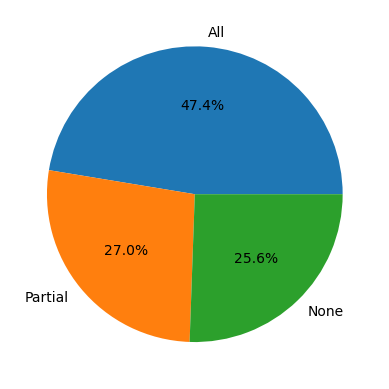

In [22]:
# calculate the sum of missing info for each entry
df_app['MISSING_BUILDING_INFO'] = df_app.loc[:,'APARTMENTS_AVG':'EMERGENCYSTATE_MODE'].isna().sum(axis=1)
 
# Create labels based on the amount of missing values: None missing, Partial missing, All all missing
df_app['MISSING_BUILDING_INFO'] = pd.cut(df_app['MISSING_BUILDING_INFO'], [-1,0,46,47], labels = ['None', 'Partial', 'All'])

# Show percentage
plt.pie(df_app['MISSING_BUILDING_INFO'].value_counts(normalize=True), labels=df_app['MISSING_BUILDING_INFO'].value_counts().index, autopct='%.1f%%')
plt.show()

- About 47% of total records have missing values in all the column and 27% have missing values in at least 1 column.
- Reason for missing: maybe they don't live in an apartment building, or they do but these information are not available or applicable?
- A lot of the information tend to be irrelevant (number of elevator, number of doors/gate,..)

**Solution:** 
- Remove all building-related column
- Create a new variable "MISSING_BUILDING_INFO" for the amount of missing info for each row ('All', 'Partial' or 'None')

In [23]:
# drop building-related columns
df_app.drop(df_app.loc[:,'APARTMENTS_AVG':'EMERGENCYSTATE_MODE'], axis = 1, inplace=True, errors='ignore')
print(f'Current shape: {df_app.shape}') 
print(f'Columns dropped: {122 - df_app.shape[1] + 1}')

Current shape: (307511, 76)
Columns dropped: 47


### Missing values in OCCUPATION_TYPE

In [24]:
job_related_cols = ['OCCUPATION_TYPE','AMOUNT_INCOME_TOTAL','INCOME_TYPE','DAYS_EMPLOYED', 'ORGANIZATION_TYPE']

df_app[df_app.OCCUPATION_TYPE.isna()][job_related_cols].sample(10)

,OCCUPATION_TYPE,AMOUNT_INCOME_TOTAL,INCOME_TYPE,DAYS_EMPLOYED,ORGANIZATION_TYPE
22413,NaN,270000.0,Working,-958,Business Entity Type 2
205076,NaN,44100.0,Pensioner,365243,XNA
98569,NaN,171000.0,Working,-7675,Business Entity Type 3
239510,NaN,157500.0,Pensioner,365243,XNA
135812,NaN,202500.0,Working,-1378,Business Entity Type 3
33602,NaN,99000.0,Pensioner,365243,XNA
213637,NaN,99000.0,Pensioner,365243,XNA
10131,NaN,180000.0,Pensioner,365243,XNA
8814,NaN,198000.0,Pensioner,365243,XNA
117733,NaN,202500.0,Pensioner,365243,XNA


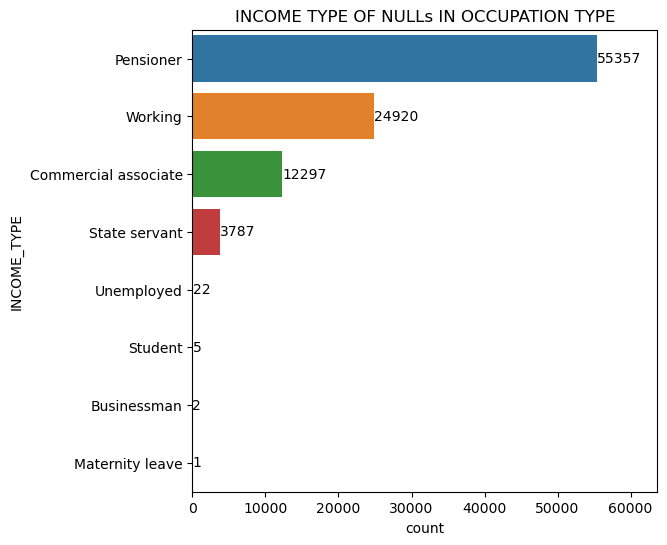

In [25]:
eda_show_count(df_app[df_app.OCCUPATION_TYPE.isna()], y='INCOME_TYPE', 
               plot_title='INCOME TYPE OF NULLs IN OCCUPATION TYPE')

In [26]:
df_app['ORGANIZATION_TYPE'][df_app.OCCUPATION_TYPE.isna()].value_counts().head(10)

XNA                       55372
Business Entity Type 3    14337
Other                      5192
Self-employed              3545
Business Entity Type 2     2265
Government                 2083
School                     1443
Business Entity Type 1     1310
Medicine                   1073
Transport: type 4           935
Name: ORGANIZATION_TYPE, dtype: int64

**Reason and Solution:**
- Majority of missing values in OCCUPATION_TYPE has INCOME_TYPE=='Pensioner'. For these, we fill with 'Retired'.
- 22 missing values is due to being unemployed.
- As for the rest, it is possible that they do not belong to any of the predefined occupation. There was not an 'Other' occupation type either. For these and unemployment, we assign them a new category 'Missing/Other' 

In [27]:
# Fill OCCUPATION_TYPE nulls with 'Retired' if INCOME_TYPE is Pensioner
df_app['OCCUPATION_TYPE'][df_app['OCCUPATION_TYPE'].isna()  & (df_app.INCOME_TYPE == 'Pensioner')] = 'Retired'

# Fill the rest with 'Missing/Others'
df_app.OCCUPATION_TYPE.fillna('Missing/Others', inplace=True)

### Missing values in CAR_AGE

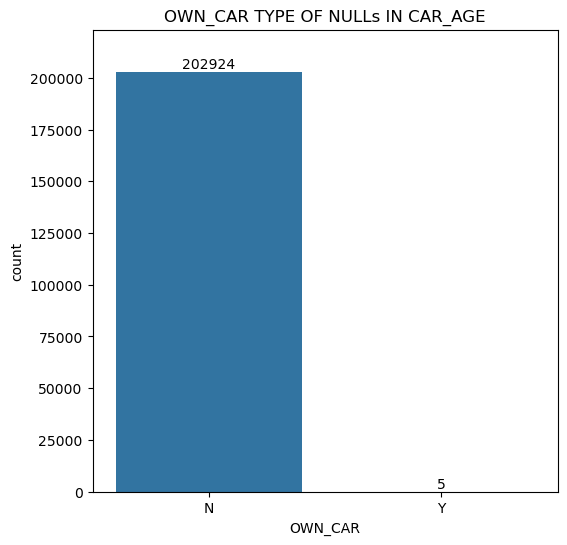

In [28]:
eda_show_count(df_app[df_app.CAR_AGE.isna()], x='OWN_CAR', plot_title='OWN_CAR TYPE OF NULLs IN CAR_AGE')

**Solution:**
- A majority of NaN in CAR_AGE is simply because they don't own a car. We leave them as-is.
- For the 5 people that own car but has no car age, we can fill with mean.

In [29]:
df_app['CAR_AGE'][(df_app.CAR_AGE.isna()) & (df_app.OWN_CAR =='Y')] = df_app['CAR_AGE'].mean()

### Missing values in AMOUNT_REQ_CREDIT_

These columns are the number of (credit score check?) requests made by a bank to the Credit Bureau regarding an applicant prior to the application. Usually higher requests is a bad sign, as it shows that the applicant have tried to apply for loan many times.

In [30]:
eda_check_null(df_app.loc[:, 'AMOUNT_REQ_CB_HOUR':'AMOUNT_REQ_CB_YEAR'])

Columns with more than 10% missing, (unit: %)
AMOUNT_REQ_CB_HOUR    13.5
AMOUNT_REQ_CB_DAY     13.5
AMOUNT_REQ_CB_WEEK    13.5
AMOUNT_REQ_CB_MON     13.5
AMOUNT_REQ_CB_QRT     13.5
AMOUNT_REQ_CB_YEAR    13.5
dtype: float64
************************************************************
Columns with less than 10% missing, (unit: values)
Series([], dtype: int64)


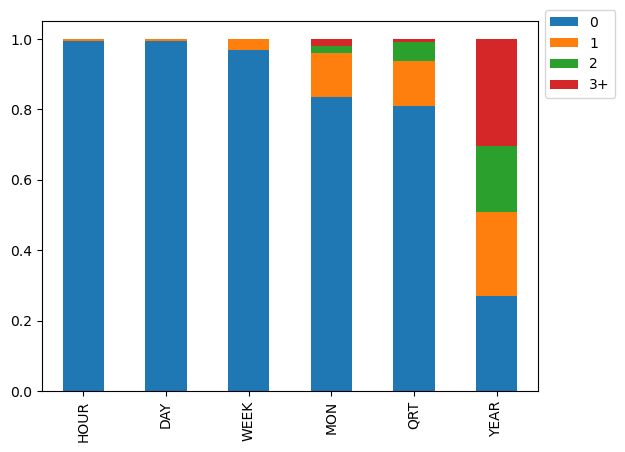

In [31]:
# Plot visualization of value distribution in these columns
df_plot = pd.DataFrame({
    'YEAR': df_app.AMOUNT_REQ_CB_YEAR.value_counts(normalize=True),
    'QRT': df_app.AMOUNT_REQ_CB_QRT.value_counts(normalize=True),
    'MON': df_app.AMOUNT_REQ_CB_MON.value_counts(normalize=True),
    'WEEK': df_app.AMOUNT_REQ_CB_WEEK.value_counts(normalize=True),
    'DAY': df_app.AMOUNT_REQ_CB_DAY.value_counts(normalize=True),
    'HOUR': df_app.AMOUNT_REQ_CB_HOUR.value_counts(normalize=True)
})

# combine the >3 rows to 3+, drop the rest and rename the index  
df_plot.iloc[3,:] = df_plot.iloc[3:].sum()
df_plot.drop(index = df_plot.iloc[4:].index, inplace=True)
df_plot.index = ['0','1','2','3+']

df_plot[df_plot.columns[::-1]].T.plot(kind='bar',stacked=True)
plt.legend(bbox_to_anchor=(1,1.05))
plt.show()

**Check if all the nulls are on the same rows (in other words, will a row either miss all 6 columns or does not miss any value at all)**

In [32]:
# sum of missing values of AMOUNT_REQ_xxx per row
df_app.loc[:,'AMOUNT_REQ_CB_HOUR':'AMOUNT_REQ_CB_YEAR'].isna().sum(axis=1).value_counts()

0    265992
6     41519
dtype: int64

So we can confirm that the missing values in AMOUNT_REQ_xxx happen on the same rows (each applicant either miss none or miss all 6).

**Solution:** 
- For the columns from Hour -> Quarter, we can fill the nulls with mode (0). For Year column, we can fill them with median as the data is quite balanced between 0,1,2 and 3+
- For investigating purpose, we will encode the missing value with -1 to see if the entries with missing values have anything in common. 
- Also we can combine all the data into 1 column YEAR to reduce the redundancy 

In [33]:
# encode the missing value with -1 for analysis
df_app.loc[:,'AMOUNT_REQ_CB_HOUR':'AMOUNT_REQ_CB_QRT'] = df_app.loc[:,'AMOUNT_REQ_CB_HOUR':'AMOUNT_REQ_CB_QRT'].fillna(-1)
df_app.AMOUNT_REQ_CB_YEAR.fillna(-1, inplace=True)

In [34]:
# combine data
df_app.AMOUNT_REQ_CB_YEAR = df_app.loc[:,'AMOUNT_REQ_CB_HOUR':'AMOUNT_REQ_CB_YEAR'].sum(axis=1)

In [35]:
# drop redundant columns
df_app.drop(columns = df_app.loc[:,'AMOUNT_REQ_CB_HOUR':'AMOUNT_REQ_CB_QRT'].columns, inplace=True)

### Missing values in EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3

**How many rows miss all 3 EXT_SOURCE?**

In [36]:
(df_app[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].isna().sum(axis=1)==3).sum()

172

**Observation and solution:**
- Despite having many missing values, there are only 172 rows missed all 3 sources, meaning there is usually at least 1 external data source available.
- We will create a mean rating variable from available ratings and create a new variable to count how many external source each application has.
- For the 172 applications that have no available source, their mean rating will also be missing. We can leave them as-is.

In [37]:
# Create mean rating variable
df_app['EXT_SOURCE_MEAN'] = df_app[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)

# Create count available source variable
df_app['EXT_SOURCE_COUNT'] = df_app[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].notna().sum(axis=1)

# Drop original EXT_SOURCE columns
df_app.drop(columns = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'], inplace=True)

### Columns with small amount of missing values

In [38]:
# Check for columns which have null
eda_check_null(df_app)

Columns with more than 10% missing, (unit: %)
CAR_AGE    65.99
dtype: float64
************************************************************
Columns with less than 10% missing, (unit: values)
AMOUNT_ANNUITY                  12
AMOUNT_GOODS_PRICE             278
SUITE_TYPE                    1292
COUNT_FAM_MEMBERS                2
OBS_30_COUNT_SOCIAL_CIRCLE    1021
DEF_30_COUNT_SOCIAL_CIRCLE    1021
OBS_60_COUNT_SOCIAL_CIRCLE    1021
DEF_60_COUNT_SOCIAL_CIRCLE    1021
DAYS_LAST_PHONE_CHANGE           1
EXT_SOURCE_MEAN                172
dtype: int64


#### Missing values in AMOUNT_ANNUITY

<AxesSubplot: xlabel='AMOUNT_ANNUITY', ylabel='AMOUNT_CREDIT'>

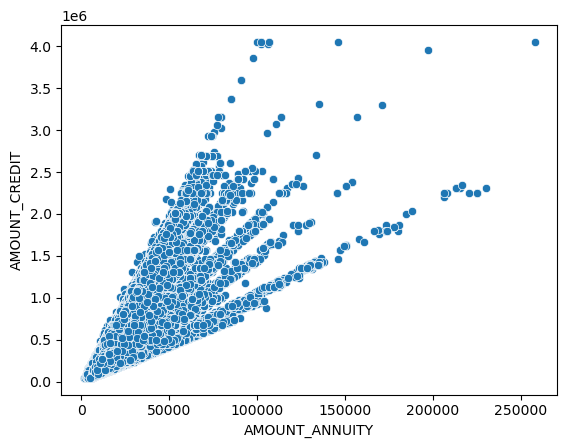

In [39]:
sns.scatterplot(data = df_app, x='AMOUNT_ANNUITY', y='AMOUNT_CREDIT')

Since AMOUNT_ANNUITY is the amount money for customer to pay per installment, it tends to be a percentage of AMOUNT_CREDIT.

We will find what's the median percentage and fill nan in AMOUNT_ANNUITY with said percentage of AMOUNT_CREDIT

In [40]:
# Median of AMOUNT_ANNUITY/AMOUNT_CREDIT percentage
AMOUNT_ANNUITY_PCT = (df_app.AMOUNT_ANNUITY / df_app.AMOUNT_CREDIT)
AMOUNT_ANNUITY_PCT.median()

0.05

In [41]:
# Fill nan in AMOUNT_ANNUITY with this percentage * AMOUNT_CREDIT
df_app.AMOUNT_ANNUITY.fillna(df_app.AMOUNT_CREDIT*0.05, inplace=True)

#### Missing values in AMOUNT_GOODS_PRICE

What are the contract type of the missing value in AMOUNT_GOODS_PRICE?

In [42]:
df_app[df_app.AMOUNT_GOODS_PRICE.isna()]['CONTRACT_TYPE'].value_counts()

Revolving loans    278
Name: CONTRACT_TYPE, dtype: int64

Correlation coef. between AMOUNT_GOODS_PRICE and AMOUNT_CREDIT
CONTRACT_TYPE=='Cash loans'     : 0.9868842854799815
CONTRACT_TYPE=='Revolving loans': 0.9949006416606588


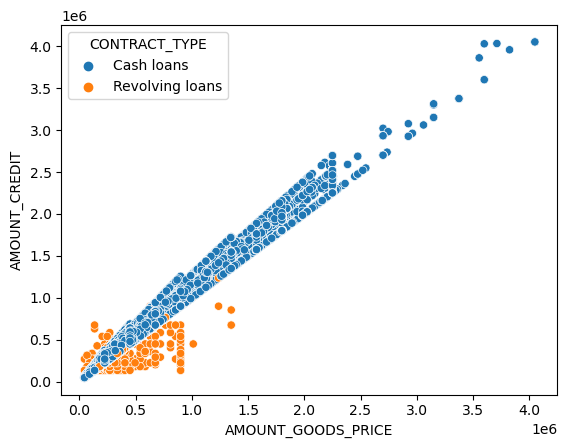

In [43]:
# Scatterplot of AMOUNT_GOODS_PRICE and AMOUNT_CREDIT, split hue by CONTRACT_TYPE
ax = sns.scatterplot(data = df_app, x = 'AMOUNT_GOODS_PRICE', y='AMOUNT_CREDIT', hue='CONTRACT_TYPE')
print('Correlation coef. between AMOUNT_GOODS_PRICE and AMOUNT_CREDIT')
print('CONTRACT_TYPE==\'Cash loans\'     : ', end='')
print(df_app['AMOUNT_GOODS_PRICE'][df_app.CONTRACT_TYPE=='Cash loans'].corr(df_app['AMOUNT_CREDIT'][df_app.CONTRACT_TYPE=='Cash loans']))
print('CONTRACT_TYPE==\'Revolving loans\': ',end='')
print(df_app['AMOUNT_GOODS_PRICE'][df_app.CONTRACT_TYPE=='Revolving loans'].corr(df_app['AMOUNT_CREDIT'][df_app.CONTRACT_TYPE=='Revolving loans']))


- AMOUNT_GOODS_PRICE is the value of the good which the loan was applied for. 
- This applied to term cash loans but not revolving loan, since revolving loan (most often in the form of credit card) doesn't require such product price. 
- For EDA analysis, we can leave the null in AMOUNT_GOODS_PRICE as-is, since it is not applicable. 
- If we have to, we can fill the nan with AMOUNT_CREDIT because of still very high correlation coefficient.

In [44]:
# If building a model, fill the nan with AMOUNT_CREDIT because of still very high correlation coefficient.
# df_app.AMOUNT_GOODS_PRICE.fillna(df_app.AMOUNT_CREDIT, inplace=True)

#### The rest
Fill the rest with mode

In [45]:
# fill with mode
fill_with_mode = [
    'SUITE_TYPE', 
    'COUNT_FAM_MEMBERS',
    'DAYS_LAST_PHONE_CHANGE',
    'OBS_30_COUNT_SOCIAL_CIRCLE',
    'DEF_30_COUNT_SOCIAL_CIRCLE',
    'OBS_60_COUNT_SOCIAL_CIRCLE',
    'DEF_60_COUNT_SOCIAL_CIRCLE',
]

for column in fill_with_mode:
    df_app[column].fillna(df_app[column].mode()[0],inplace=True)

In [46]:
eda_check_null(df_app)

Columns with more than 10% missing, (unit: %)
CAR_AGE    65.99
dtype: float64
************************************************************
Columns with less than 10% missing, (unit: values)
AMOUNT_GOODS_PRICE    278
EXT_SOURCE_MEAN       172
dtype: int64


### Missing values encoded as XNA

In [47]:
print('Columns contain \'XNA\':')
for column in df_app.select_dtypes(include='object').columns:
    if df_app[column].str.contains('XNA').any():
        print(column)

Columns contain 'XNA':
GENDER
ORGANIZATION_TYPE


**XNA in GENDER**

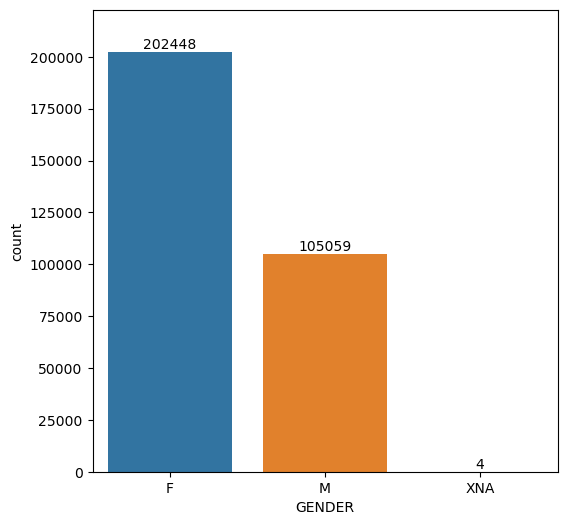

In [48]:
eda_show_count(df_app,'GENDER')

- There are so few of them, we can replace them with mode ('F').

In [49]:
# Replace XNA in GENDER
df_app['GENDER'] = df_app['GENDER'].replace('XNA', 'F')

**XNA in ORGANIZATION_TYPE**

In [50]:
df_app['ORGANIZATION_TYPE'].unique()

array(['Business Entity Type 3', 'School', 'Government', 'Religion',
       'Other', 'XNA', 'Electricity', 'Medicine',
       'Business Entity Type 2', 'Self-employed', 'Transport: type 2',
       'Construction', 'Housing', 'Kindergarten', 'Trade: type 7',
       'Industry: type 11', 'Military', 'Services', 'Security Ministries',
       'Transport: type 4', 'Industry: type 1', 'Emergency', 'Security',
       'Trade: type 2', 'University', 'Transport: type 3', 'Police',
       'Business Entity Type 1', 'Postal', 'Industry: type 4',
       'Agriculture', 'Restaurant', 'Culture', 'Hotel',
       'Industry: type 7', 'Trade: type 3', 'Industry: type 3', 'Bank',
       'Industry: type 9', 'Insurance', 'Trade: type 6',
       'Industry: type 2', 'Transport: type 1', 'Industry: type 12',
       'Mobile', 'Trade: type 1', 'Industry: type 5', 'Industry: type 10',
       'Legal Services', 'Advertising', 'Trade: type 5', 'Cleaning',
       'Industry: type 13', 'Trade: type 4', 'Telecom',
       'I

There are too many sub-types. We can merge the sub-types together for ananlysis.

**Group all the subtype into one**

In [51]:
# (Strip all numbers, type, Type, colon, etc...)
df_app.ORGANIZATION_TYPE = df_app.ORGANIZATION_TYPE.str.strip('1234567890 ').str.replace(' Type','').str.replace(' type','').str.strip(':')

In [52]:
df_app.ORGANIZATION_TYPE.unique()

array(['Business Entity', 'School', 'Government', 'Religion', 'Other',
       'XNA', 'Electricity', 'Medicine', 'Self-employed', 'Transport',
       'Construction', 'Housing', 'Kindergarten', 'Trade', 'Industry',
       'Military', 'Services', 'Security Ministries', 'Emergency',
       'Security', 'University', 'Police', 'Postal', 'Agriculture',
       'Restaurant', 'Culture', 'Hotel', 'Bank', 'Insurance', 'Mobile',
       'Legal Services', 'Advertising', 'Cleaning', 'Telecom', 'Realtor'],
      dtype=object)

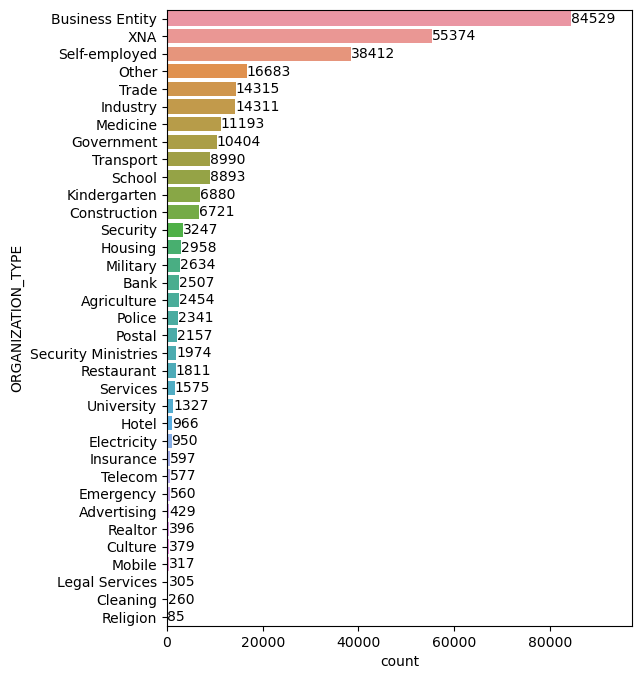

In [53]:
eda_show_count(df_app, y='ORGANIZATION_TYPE', figsize=(6,8))

In [54]:
df_app['INCOME_TYPE'][df_app.ORGANIZATION_TYPE=='XNA'].value_counts()

Pensioner     55352
Unemployed       22
Name: INCOME_TYPE, dtype: int64

- XNA in ORGANIZATION_TYPE are from the pensioner and the unemployed.
- Assign these to a Retired/Unemployed type.

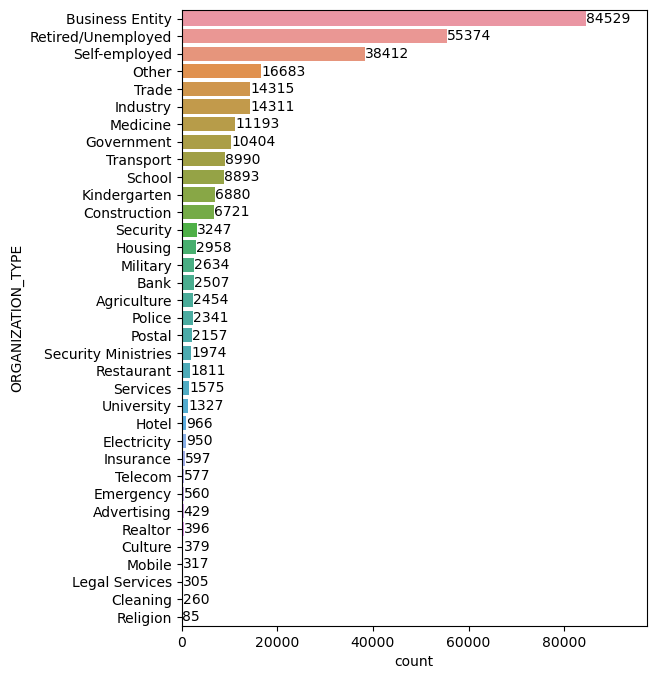

In [55]:
df_app.ORGANIZATION_TYPE = df_app.ORGANIZATION_TYPE.str.replace('XNA', 'Retired/Unemployed')

eda_show_count(df_app, y='ORGANIZATION_TYPE', figsize=(6,8))

## 2.4 Outliers

### Check for outlier

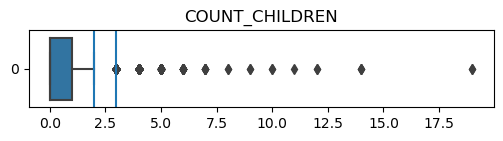

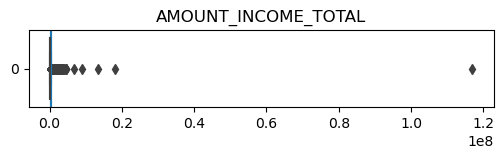

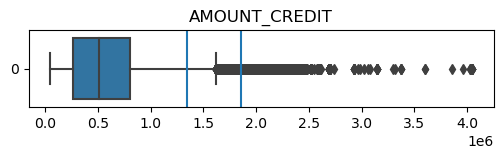

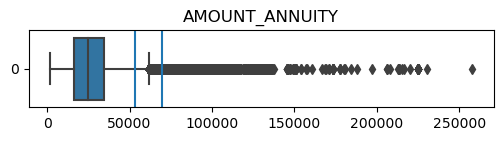

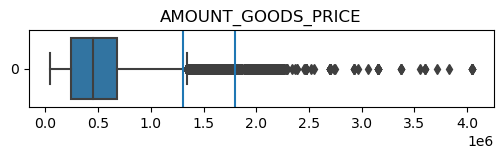

...

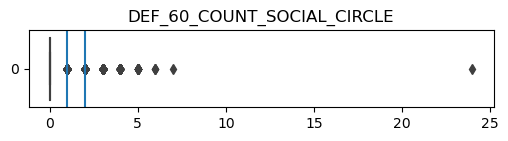

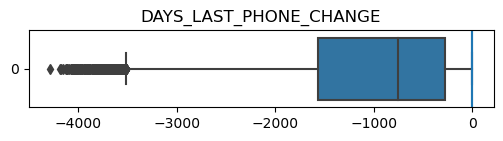

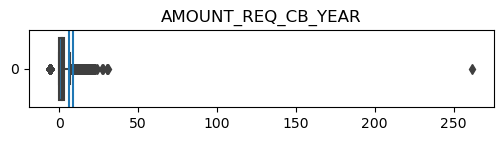

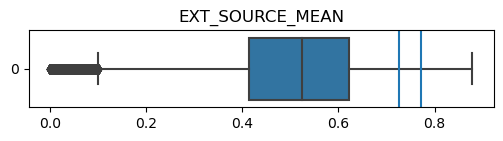

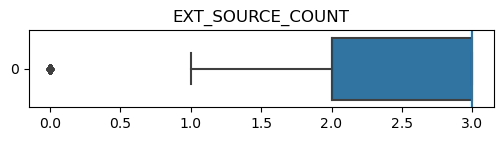

In [56]:
# manually select columns to check for outliers
continuous_numerical_columns = [
    'COUNT_CHILDREN', 'AMOUNT_INCOME_TOTAL',
    'AMOUNT_CREDIT', 'AMOUNT_ANNUITY', 'AMOUNT_GOODS_PRICE',
    'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
    'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CAR_AGE', 
    'COUNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
    'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
    'OBS_30_COUNT_SOCIAL_CIRCLE', 'DEF_30_COUNT_SOCIAL_CIRCLE',
    'OBS_60_COUNT_SOCIAL_CIRCLE', 'DEF_60_COUNT_SOCIAL_CIRCLE',
    'DAYS_LAST_PHONE_CHANGE', 'AMOUNT_REQ_CB_YEAR',
    'EXT_SOURCE_MEAN', 'EXT_SOURCE_COUNT']

for feature in continuous_numerical_columns:
    plt.figure(figsize=(6,1))
    sns.boxplot(data = df_app[feature], orient='h')
    plt.axvline(df_app[feature].quantile(.95)) # Draw 2 lines at 95% and 99% quantiles
    plt.axvline(df_app[feature].quantile(.99))
    plt.title(feature)
    plt.show()

We detected some columns with potential outliers. They have some values that are extremely larger and far away from the rest.
- AMOUNT_INCOME_TOTAL 
- CAR_AGE
- DAYS_EMPLOYED 
- OBS/DEF_COUNT_SOCIAL_CIRCLE columns
- AMOUNT_REQ_CB_YEAR

Some columns that are extremely skewed and need to assign bins:
- COUNT_CHILDREN, COUNT_FAM_MEMBERS
- REGION_POPULATION_RELATIVE
- AMOUNT_CREDIT / ANNUITY / GOODS_PRICE

### Outliers in AMOUNT_INCOME_TOTAL

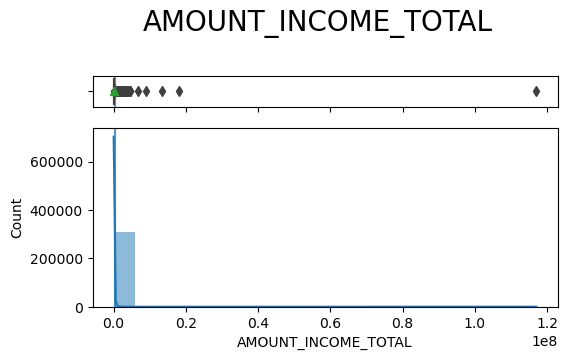

In [57]:
eda_histbox(df_app, 'AMOUNT_INCOME_TOTAL', line=df_app.AMOUNT_INCOME_TOTAL.quantile([.95,.99]))

In [58]:
# investigate the highest value
richest_person = df_app[df_app['AMOUNT_INCOME_TOTAL']==df_app['AMOUNT_INCOME_TOTAL'].max()]
richest_person

,SK_ID_CURR,TARGET,CONTRACT_TYPE,GENDER,OWN_CAR,OWN_REALTY,COUNT_CHILDREN,AMOUNT_INCOME_TOTAL,AMOUNT_CREDIT,AMOUNT_ANNUITY,AMOUNT_GOODS_PRICE,SUITE_TYPE,INCOME_TYPE,EDUCATION,MARITAL_STATUS,HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CAR_AGE,MOBILE,EMP_PHONE,WORK_PHONE,CONT_MOBILE,PHONE,EMAIL,OCCUPATION_TYPE,COUNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_COUNT_SOCIAL_CIRCLE,DEF_30_COUNT_SOCIAL_CIRCLE,OBS_60_COUNT_SOCIAL_CIRCLE,DEF_60_COUNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DOC_2,DOC_3,DOC_4,DOC_5,DOC_6,DOC_7,DOC_8,DOC_9,DOC_10,DOC_11,DOC_12,DOC_13,DOC_14,DOC_15,DOC_16,DOC_17,DOC_18,DOC_19,DOC_20,DOC_21,AMOUNT_REQ_CB_YEAR,MISSING_BUILDING_INFO,EXT_SOURCE_MEAN,EXT_SOURCE_COUNT
12840,114967,1,Cash loans,F,N,Y,1,117000000.0,562491.0,26194.5,454500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,-12615,-922,-6762.0,-3643,NaN,1,1,0,1,0,0,Laborers,3.0,2,2,TUESDAY,14,0,0,0,0,0,0,Business Entity,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,Partial,0.239838,3


In [59]:
from scipy import stats    
for feature in ['AMOUNT_CREDIT', 'AMOUNT_ANNUITY','AMOUNT_GOODS_PRICE']:
    print(f'{feature}: at {stats.percentileofscore(df_app[feature], richest_person[feature].values[0]):.3f}% quantile')
    
richest_person[['OWN_CAR','EDUCATION','OCCUPATION_TYPE']]

AMOUNT_CREDIT: at 56.733% quantile
AMOUNT_ANNUITY: at 53.892% quantile
AMOUNT_GOODS_PRICE: at 52.864% quantile


,OWN_CAR,EDUCATION,OCCUPATION_TYPE
12840,N,Secondary / secondary special,Laborers


- This particular entry's AMOUNT_INCOME_TOTAL seems to be incorrect.
- AMOUNT_INCOME_TOTAL is sky high while all credit related features are only in the ~50% quantile range.
- Other information doesn't suggest this is a billionaire either.

In [60]:
# assign this entry's AMOUNT_INCOME_TOTAL to median
df_app['AMOUNT_INCOME_TOTAL'][df_app['AMOUNT_INCOME_TOTAL']==117000000.0] = df_app['AMOUNT_INCOME_TOTAL'].median()

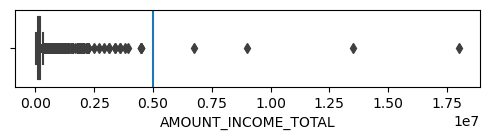

In [61]:
# Check out the rest
plt.figure(figsize=(6,1))
sns.boxplot(data=df_app,x='AMOUNT_INCOME_TOTAL')
plt.axvline(5e6)

In [62]:
# See the percentiles of applicant with income > 5e6

AMOUNT_INCOME_TOTAL_5e6 = pd.DataFrame({
    'AMOUNT_INCOME_TOTAL' : df_app.AMOUNT_INCOME_TOTAL,
    'AMOUNT_CREDIT' : df_app.AMOUNT_CREDIT.rank(pct=True),
    'AMOUNT_ANNUITY' : df_app.AMOUNT_ANNUITY.rank(pct=True),
    'AMOUNT_GOODS_PRICE' : df_app.AMOUNT_GOODS_PRICE.rank(pct=True),
})
AMOUNT_INCOME_TOTAL_5e6[AMOUNT_INCOME_TOTAL_5e6.AMOUNT_INCOME_TOTAL>5e6]

,AMOUNT_INCOME_TOTAL,AMOUNT_CREDIT,AMOUNT_ANNUITY,AMOUNT_GOODS_PRICE
77768,9000000.0,0.958977,0.999672,0.974044
131127,6750000.0,0.734424,0.948088,0.697811
203693,18000090.0,0.648731,0.989205,0.697811
246858,13500000.0,0.957649,0.999659,0.973130


The rest of the outliers in AMOUNT_INCOME_TOTAL seems to be correct, as supported by the percentile rank in AMOUNT_CREDIT, AMOUNT_ANNUITY and AMOUNT_GOODS_PRICE

**Assign bins for AMOUNT_INCOME_TOTAL**

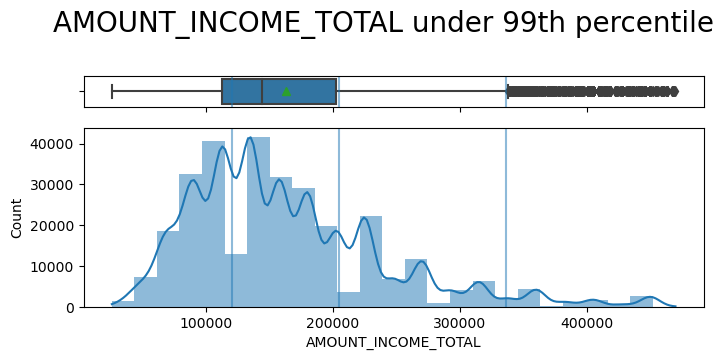

In [63]:
eda_histbox(df_app[df_app.AMOUNT_INCOME_TOTAL<472500],'AMOUNT_INCOME_TOTAL', kde=True,
            figsize=(8,3), bins=25, line = [1.2e5, 2.05e5,3.36e5],
            plot_title='AMOUNT_INCOME_TOTAL under 99th percentile', bw_adjust=1.2,)

On the histogram and kde, we can see the distribution can be divided into 4 big clusters: 
- Low: income below 1.2e5
- Average: below 2.05e5
- High: below 3.36e5
- Very High: above 3.36e5

In [64]:
# assign bins for income
df_app['AMOUNT_INCOME_GROUP'] = pd.cut(df_app['AMOUNT_INCOME_TOTAL'], 
        [0, 1.2e5, 2.05e5, 3.36e5, df_app['AMOUNT_INCOME_TOTAL'].max()],
        labels=['Low', 'Average','High','Very High']
       )

### Outliers in DAYS_EMPLOYED

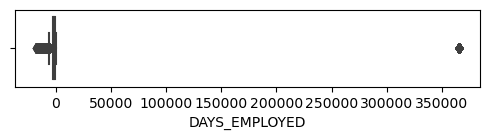

In [65]:
plt.figure(figsize=(6,1))
sns.boxplot(data = df_app, x = 'DAYS_EMPLOYED')
plt.show()

In [66]:
df_app.INCOME_TYPE[df_app['DAYS_EMPLOYED']>0].value_counts()

Pensioner     55352
Unemployed       22
Name: INCOME_TYPE, dtype: int64

- The outliers are encoded values for NaN, in this case Pensioner and Unemployed.
- Convert the pensioner to NaN, Unemployed to 0

In [67]:
df_app['DAYS_EMPLOYED'][df_app.INCOME_TYPE == 'Pensioner'] = np.NaN
df_app['DAYS_EMPLOYED'][df_app.INCOME_TYPE == 'Unemployed'] = 0

See the distribution again

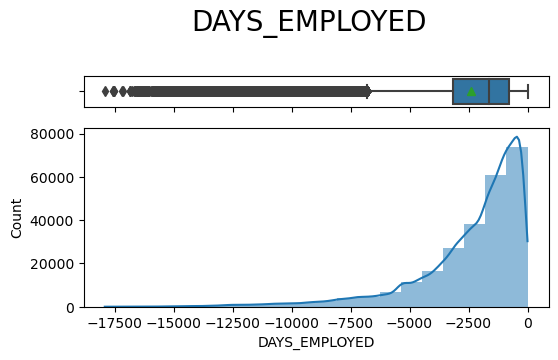

In [68]:
eda_histbox(df_app, 'DAYS_EMPLOYED', figsize=(6,3))

### Outliers in CAR_AGE

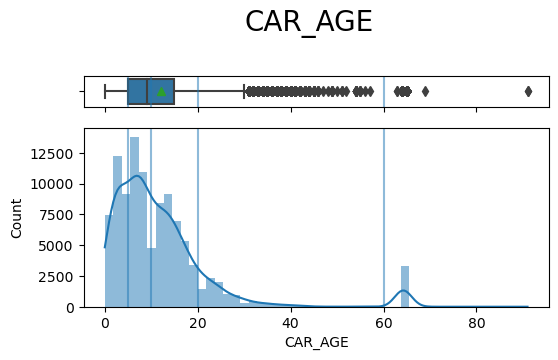

In [69]:
eda_histbox(df_app, 'CAR_AGE', kde=True, line = [5, 10, 20,60],
            figsize=(6,3), bins=50, bw_adjust=1.5)

In [70]:
F'Max value in CAR_ARE: {df_app.CAR_AGE.max()}'

'Max value in CAR_ARE: 91.0'

- For a car to be 91 years old, it must be from pre World War 2 which is very unlikely here. It's also a lot higher than the 99% quantile. 
- There is also a large group of cars age 62~65. We will group these for later analysis.

In [71]:
# replace 91 with 99% percentile value
df_app.CAR_AGE.replace(91,64, inplace=True)

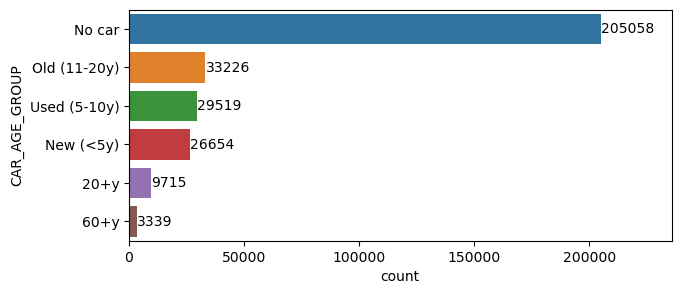

In [72]:
# Create bins for car age
df_app['CAR_AGE_GROUP']= pd.cut(df_app.CAR_AGE, 
                                [0,5,10,20,60,100], 
                                labels=['New (<5y)','Used (5-10y)','Old (11-20y)','20+y','60+y']
                               ).values.add_categories('No car')
df_app['CAR_AGE_GROUP'].fillna('No car', inplace=True)
eda_show_count(df_app, y='CAR_AGE_GROUP', figsize=(7,3))

### Outlier in OBS/DEF_30/60_COUNT_SOCIAL_CIRCLE

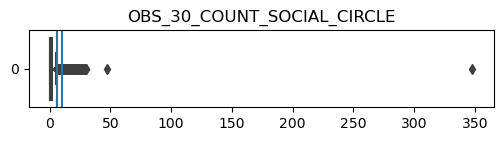

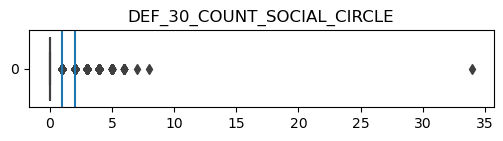

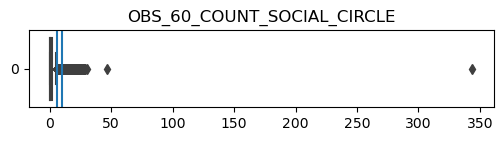

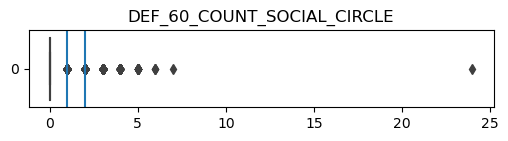

In [73]:
for feature in df_app.loc[:,'OBS_30_COUNT_SOCIAL_CIRCLE':'DEF_60_COUNT_SOCIAL_CIRCLE'].columns:
    plt.figure(figsize=(6,1))
    sns.boxplot(data = df_app[feature], orient='h')
    plt.axvline(df_app[feature].quantile(.95)) # Draw 2 lines at 95% and 99% quantiles
    plt.axvline(df_app[feature].quantile(.99))
    plt.title(feature),plt.show()

In [74]:
df_app.sort_values('OBS_30_COUNT_SOCIAL_CIRCLE', ascending=False).head(1)

,SK_ID_CURR,TARGET,CONTRACT_TYPE,GENDER,OWN_CAR,OWN_REALTY,COUNT_CHILDREN,AMOUNT_INCOME_TOTAL,AMOUNT_CREDIT,AMOUNT_ANNUITY,AMOUNT_GOODS_PRICE,SUITE_TYPE,INCOME_TYPE,EDUCATION,MARITAL_STATUS,HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CAR_AGE,MOBILE,EMP_PHONE,WORK_PHONE,CONT_MOBILE,PHONE,EMAIL,OCCUPATION_TYPE,COUNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_COUNT_SOCIAL_CIRCLE,DEF_30_COUNT_SOCIAL_CIRCLE,OBS_60_COUNT_SOCIAL_CIRCLE,DEF_60_COUNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DOC_2,DOC_3,DOC_4,DOC_5,DOC_6,DOC_7,DOC_8,DOC_9,DOC_10,DOC_11,DOC_12,DOC_13,DOC_14,DOC_15,DOC_16,DOC_17,DOC_18,DOC_19,DOC_20,DOC_21,AMOUNT_REQ_CB_YEAR,MISSING_BUILDING_INFO,EXT_SOURCE_MEAN,EXT_SOURCE_COUNT,AMOUNT_INCOME_GROUP,CAR_AGE_GROUP
148403,272071,0,Revolving loans,M,N,Y,0,202500.0,180000.0,9000.0,180000.0,Family,State servant,Higher education,Single / not married,House / apartment,0.020246,-10111,-1917.0,-2306.0,-2306,NaN,1,1,0,1,0,0,Core staff,1.0,3,3,THURSDAY,9,0,0,0,0,1,1,Police,348.0,34.0,344.0,24.0,-667.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5.0,Partial,0.340816,3,Average,No car


The applicant with 348 OBS_30_COUNT_SOCIAL_CIRCLE is a core staff in Police organization. It's possible that in his line of work, he has to come into contact with so many OBS/DEF? We leave it as-is.

In [75]:
for feature in df_app.loc[:,'OBS_30_COUNT_SOCIAL_CIRCLE':'DEF_60_COUNT_SOCIAL_CIRCLE'].columns:
    print(df_app['SK_ID_CURR'][df_app[feature]==df_app[feature].max()])

148403    272071
Name: SK_ID_CURR, dtype: int64
148403    272071
Name: SK_ID_CURR, dtype: int64
148403    272071
Name: SK_ID_CURR, dtype: int64
148403    272071
Name: SK_ID_CURR, dtype: int64


All the outliers in OBS and DEF is the same ID. We don't need to investigate the other columns in OBS and DEF.

### Outlier in AMOUNT_REQ_CB_YEAR

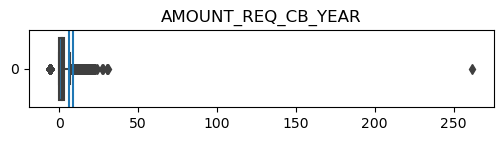

(Text(0.5, 1.0, 'AMOUNT_REQ_CB_YEAR'), None)

In [76]:
plt.figure(figsize=(6,1))
sns.boxplot(data = df_app['AMOUNT_REQ_CB_YEAR'], orient='h')
plt.axvline(df_app['AMOUNT_REQ_CB_YEAR'].quantile(.95)) # Draw 2 lines at 95% and 99% quantiles
plt.axvline(df_app['AMOUNT_REQ_CB_YEAR'].quantile(.99))
plt.title('AMOUNT_REQ_CB_YEAR'),plt.show()

In [77]:
df_app[df_app['AMOUNT_REQ_CB_YEAR']>250]

,SK_ID_CURR,TARGET,CONTRACT_TYPE,GENDER,OWN_CAR,OWN_REALTY,COUNT_CHILDREN,AMOUNT_INCOME_TOTAL,AMOUNT_CREDIT,AMOUNT_ANNUITY,AMOUNT_GOODS_PRICE,SUITE_TYPE,INCOME_TYPE,EDUCATION,MARITAL_STATUS,HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CAR_AGE,MOBILE,EMP_PHONE,WORK_PHONE,CONT_MOBILE,PHONE,EMAIL,OCCUPATION_TYPE,COUNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_COUNT_SOCIAL_CIRCLE,DEF_30_COUNT_SOCIAL_CIRCLE,OBS_60_COUNT_SOCIAL_CIRCLE,DEF_60_COUNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DOC_2,DOC_3,DOC_4,DOC_5,DOC_6,DOC_7,DOC_8,DOC_9,DOC_10,DOC_11,DOC_12,DOC_13,DOC_14,DOC_15,DOC_16,DOC_17,DOC_18,DOC_19,DOC_20,DOC_21,AMOUNT_REQ_CB_YEAR,MISSING_BUILDING_INFO,EXT_SOURCE_MEAN,EXT_SOURCE_COUNT,AMOUNT_INCOME_GROUP,CAR_AGE_GROUP
239474,377322,0,Cash loans,F,N,Y,1,360000.0,1035000.0,30393.0,1035000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.026392,-13590,-3336.0,-3629.0,-3267,NaN,1,1,0,1,1,0,Accountants,3.0,2,2,MONDAY,19,0,0,0,0,0,0,Business Entity,3.0,0.0,3.0,0.0,-695.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,262.0,Partial,0.583381,2,Very High,No car


Having 262 requests in a year does not seem correct. We will assign this value to mode (0)

In [78]:
df_app['AMOUNT_REQ_CB_YEAR'][df_app['AMOUNT_REQ_CB_YEAR']>250] = 0

### Assign bins for AMOUNT_CREDIT

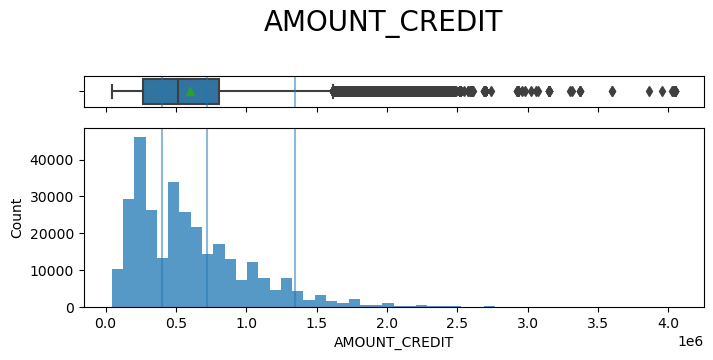

In [79]:
# find the approximate splits
eda_histbox(df_app, 'AMOUNT_CREDIT', line = [4e5,7.2e5, df_app.AMOUNT_CREDIT.quantile(0.95)], bins=50, figsize=(8,3), kde=False)

In [80]:
df_app['AMOUNT_CREDIT_GROUP'] = pd.cut(df_app.AMOUNT_CREDIT, 
                                       [0, 4e5, 7.2e5, df_app.AMOUNT_CREDIT.quantile(0.95), df_app.AMOUNT_CREDIT.max()],
                                       labels = ['Low', 'Average', 'High', 'Very High'])

### Assign bins AMOUNT_ANNUITY

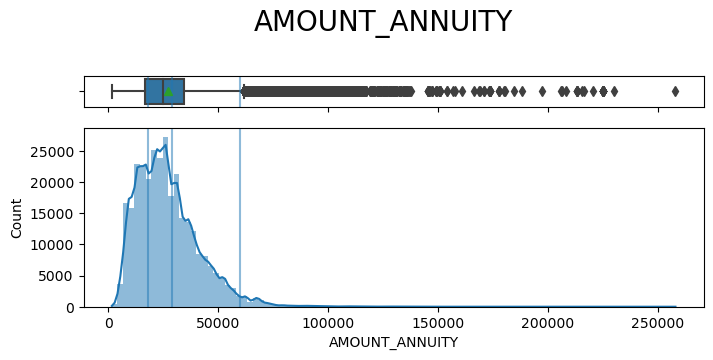

In [81]:
eda_histbox(df_app, 'AMOUNT_ANNUITY', kde=True, line = [1.8e4, 2.9e4, 6e4],figsize=(8,3), bins=100)

In [82]:
df_app['AMOUNT_ANNUITY_GROUP'] = pd.cut(df_app.AMOUNT_ANNUITY, 
                                        [0, 1.8e4, 2.9e4, 6e4, df_app.AMOUNT_ANNUITY.max()],
                                        labels = ['Low', 'Average', 'High', 'Very High'])


### Assign bins AMOUNT_GOODS_PRICE

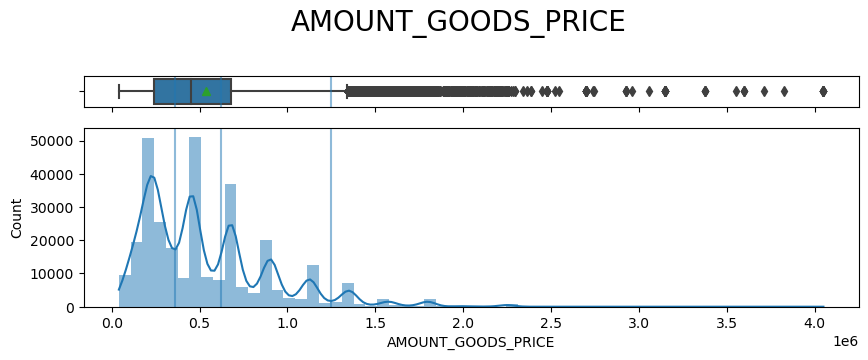

In [83]:
eda_histbox(df_app, 'AMOUNT_GOODS_PRICE', kde=True, line = [0.36e6, 0.62e6, 1.25e6],figsize=(10,3), bins=60, bw_adjust=1.5)

In [84]:
df_app['AMOUNT_GOODS_PRICE_GROUP'] = pd.cut(df_app.AMOUNT_GOODS_PRICE, 
                                            [0, 0.36e6, 0.62e6, 1.25e6, df_app.AMOUNT_GOODS_PRICE.max()],
                                            labels = ['Low', 'Average', 'High', 'Very High'])

### Assign bins for COUNT_CHILDREN

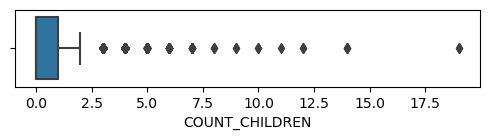

In [85]:
plt.figure(figsize=(6,1))
sns.boxplot(data = df_app, x = 'COUNT_CHILDREN')
plt.show()

Assign bins for COUNT_CHILDREN

In [86]:
df_app['COUNT_CHILDREN']= pd.cut(df_app.COUNT_CHILDREN, [-1,0,1,2,20], labels=['None','1','2','3 or more'])
df_app['COUNT_CHILDREN'].value_counts()

None         215371
1             61119
2             26749
3 or more      4272
Name: COUNT_CHILDREN, dtype: int64

### Assign bins for in COUNT_FAM_MEMBERS

<AxesSubplot: xlabel='COUNT_FAM_MEMBERS'>

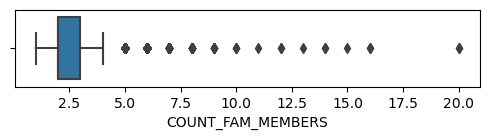

In [87]:
plt.figure(figsize=(6,1))
sns.boxplot(data = df_app, x = 'COUNT_FAM_MEMBERS')

In [88]:
df_app['COUNT_FAM_MEMBERS']= pd.cut(df_app.COUNT_FAM_MEMBERS, [0,1,2,3,50], labels=['1','2','3', '4 or more'])
df_app.COUNT_FAM_MEMBERS.value_counts()

2            158359
1             67847
3             52601
4 or more     28704
Name: COUNT_FAM_MEMBERS, dtype: int64

Looks like the outliers have been treated

## 2.5 Fix invalid values / Standardize values

In [89]:
df_app.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,307511.0,278180.518577,102790.175348,100002.000000,189145.500000,278202.000000,367142.500000,4.562550e+05
TARGET,307511.0,0.080729,0.272419,0.000000,0.000000,0.000000,0.000000,1.000000e+00
AMOUNT_INCOME_TOTAL,307511.0,168417.923622,108811.637181,25650.000000,112500.000000,147150.000000,202500.000000,1.800009e+07
AMOUNT_CREDIT,307511.0,599025.999706,402490.776996,45000.000000,270000.000000,513531.000000,808650.000000,4.050000e+06
AMOUNT_ANNUITY,307511.0,27108.620161,14493.867116,1615.500000,16524.000000,24903.000000,34596.000000,2.580255e+05
AMOUNT_GOODS_PRICE,307233.0,538396.207429,369446.460540,40500.000000,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307511.0,0.020868,0.013831,0.000290,0.010006,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-25229.000000,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,252149.0,-2383.859714,2338.214494,-17912.000000,-3175.000000,-1647.000000,-767.000000,0.000000e+00
DAYS_REGISTRATION,307511.0,-4986.120328,3522.886321,-24672.000000,-7479.500000,-4504.000000,-2010.000000,0.000000e+00


- The DAYS_xxx columns has their value in negative.
- All the DOC_xxx columns except for DOC_3 is a very sparse matrix (most values are 0). These columns also need processing.
- Reg/Work/Live region and city columns should also be processed into more easily understandable information.
- The rest seems to be correct.

### Fix negative values in 'DAYS_BIRTH', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_EMPLOYED'

In [90]:
# convert from days to year
days_to_years = ['DAYS_BIRTH', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
                 'DAYS_EMPLOYED', 'DAYS_LAST_PHONE_CHANGE']

df_app[days_to_years] = np.round(df_app[days_to_years].abs()/365,1)

# rename columns
df_app.rename(columns = {'DAYS_BIRTH': 'AGE',
                         'DAYS_REGISTRATION': 'YEARS_REGISTRATION',
                         'DAYS_ID_PUBLISH':'YEARS_ID_PUBLISH',
                         'DAYS_EMPLOYED': 'YEARS_EMPLOYED',
                         'DAYS_LAST_PHONE_CHANGE': 'YEARS_LAST_PHONE_CHANGE'
                        }, inplace=True)

Create bins for AGE and YEARS_EMPLOYED

<AxesSubplot: xlabel='AGE'>

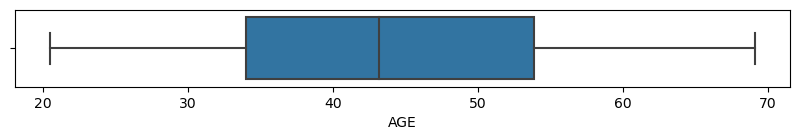

In [91]:
plt.figure(figsize=(10,1))
sns.boxplot(data=df_app, x='AGE')

In [92]:
df_app['AGE_GROUP']= pd.cut(df_app.AGE, [0,30,40,50,60,70], labels=['Under 30','31 to 40','41 to 50','51 to 60','61+'])

<AxesSubplot: xlabel='YEARS_EMPLOYED'>

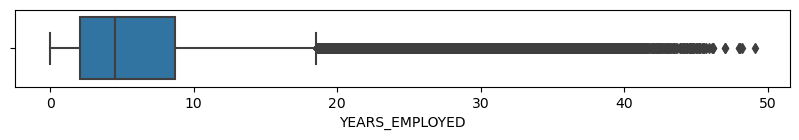

In [93]:
plt.figure(figsize=(10,1))
sns.boxplot(data=df_app, x='YEARS_EMPLOYED')

In [94]:
df_app['YEARS_EMPLOYED_GROUP'] = pd.cut(df_app['YEARS_EMPLOYED'], [0, 2, 5, 10, 50], labels = ['<2 years', '2-5 years', '6-10 years', '10+ years'])
df_app['YEARS_EMPLOYED_GROUP'] = df_app['YEARS_EMPLOYED_GROUP'].values.add_categories('Retired/Unemployed')
df_app['YEARS_EMPLOYED_GROUP'].fillna('Retired/Unemployed', inplace=True)

### Process DOC_xxx column

In [95]:
# How many time each document appeared?
df_app.loc[:,'DOC_2':'DOC_21'].sum()

DOC_2         13
DOC_3     218340
DOC_4         25
DOC_5       4648
DOC_6      27078
DOC_7         59
DOC_8      25024
DOC_9       1198
DOC_10         7
DOC_11      1203
DOC_12         2
DOC_13      1084
DOC_14       903
DOC_15       372
DOC_16      3053
DOC_17        82
DOC_18      2500
DOC_19       183
DOC_20       156
DOC_21       103
dtype: int64

In [96]:
# How many people submit exactly 1 document
(df_app.loc[:,'DOC_2':'DOC_21'].sum(axis=1)==1).sum()

270056

In [97]:
# How many people submit more than 1 document
(df_app.loc[:,'DOC_2':'DOC_21'].sum(axis=1)>1).sum()

7906

In [98]:
# How many people submit 0 documents
(df_app.loc[:,'DOC_2':'DOC_21'].sum(axis=1)==0).sum()

29549

Since the majority of application has only 1 document, we will combine all the DOC_xxx column into 1 categorical column
- For applications with 1 doc: name of the document
- For applications with 0 doc: 'NO_DOC'
- For application with >1 doc: 'MULTI_DOC'

In [99]:
# Replace the 1 with the column name, 0 with blank
for column_name in df_app.loc[:,'DOC_2':'DOC_21'].columns:
    df_app[column_name] = df_app[column_name].replace(1,column_name).replace(0,'')
df_app.loc[:,'DOC_2':'DOC_21'].head()

,DOC_2,DOC_3,DOC_4,DOC_5,DOC_6,DOC_7,DOC_8,DOC_9,DOC_10,DOC_11,DOC_12,DOC_13,DOC_14,DOC_15,DOC_16,DOC_17,DOC_18,DOC_19,DOC_20,DOC_21
0,,DOC_3,,,,,,,,,,,,,,,,,,
1,,DOC_3,,,,,,,,,,,,,,,,,,
2,,,,,,,,,,,,,,,,,,,,
3,,DOC_3,,,,,,,,,,,,,,,,,,
4,,,,,,,DOC_8,,,,,,,,,,,,,


In [100]:
# Create a DOC_TYPE column, joining the values from DOC_2 to DOC_21
df_app['DOC_TYPE'] = df_app.loc[:,'DOC_2':'DOC_21'].agg(''.join, axis=1)

In [101]:
# DOC_TYPE's length==0 -> 'NO_DOC'    |    DOC_TYPE's length>6 -> 'MULTI_DOC'    |    else keep intact.    
df_app['DOC_TYPE'] = df_app['DOC_TYPE'].apply(lambda x: 'NO_DOC' if len(x)==0 else ('MULTI_DOC' if len(x)>6 else x))
df_app['DOC_TYPE'].value_counts()

DOC_3        212036
NO_DOC        29549
DOC_6         26975
DOC_8         23588
MULTI_DOC      7906
DOC_5          4643
DOC_11         1151
DOC_9          1141
DOC_18          315
DOC_21           86
DOC_7            59
DOC_4            25
DOC_14           17
DOC_2            13
DOC_10            7
Name: DOC_TYPE, dtype: int64

In [102]:
# Combine low occurence (<1200) into 'OTHER'
low_occurence_doc = df_app['DOC_TYPE'].value_counts()[df_app['DOC_TYPE'].value_counts()<1200].index

df_app['DOC_TYPE'][df_app['DOC_TYPE'].isin(low_occurence_doc)] = 'OTHER'

In [103]:
df_app['DOC_TYPE'].value_counts()

DOC_3        212036
NO_DOC        29549
DOC_6         26975
DOC_8         23588
MULTI_DOC      7906
DOC_5          4643
OTHER          2814
Name: DOC_TYPE, dtype: int64

In [104]:
# Drop individual DOC_xxx columns
df_app.drop(columns = df_app.loc[:,'DOC_2':'DOC_21'].columns, inplace=True)

### Create new features from Reg/Work/Live region and city columns

**Region**

In [105]:
# How many applicant have as least 1 mismatched region? 
region_mismatch_columns = ['REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION']
df_app[region_mismatch_columns].sum(axis=1).value_counts()

0    291195
2     15556
3       450
1       310
dtype: int64

Since over 90% of applicant has no region mismatch, we will combine all 3 columns into a new REGION_MISMATCH column, with 2 values: 'Matched' or 'Not matched' and drop the original.

In [106]:
df_app['REGION_MISMATCH'] = df_app[region_mismatch_columns].sum(axis=1)
df_app['REGION_MISMATCH'] = df_app['REGION_MISMATCH'].apply(lambda x: 'Matched' if x==0 else 'Not matched')
df_app.drop(columns = region_mismatch_columns, inplace=True)

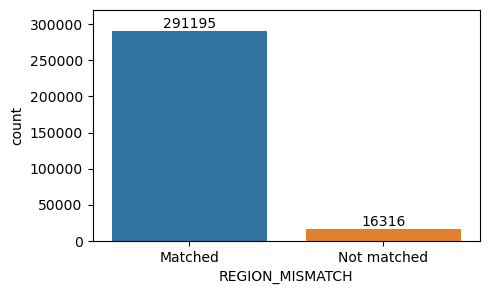

In [107]:
eda_show_count(df_app,'REGION_MISMATCH', figsize=(5,3))

**For City mismatch columns**

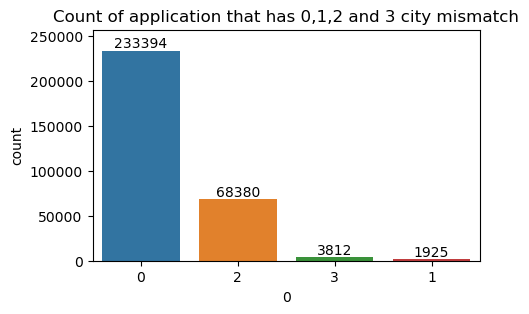

In [108]:
# Similarly, how many applicant have city mismatch, and how many mismatch? 
city_mismatch_columns = ['REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY']

eda_show_count(df_app[city_mismatch_columns].sum(axis=1).to_frame(),0, figsize=(5,3),
              plot_title = 'Count of application that has 0,1,2 and 3 city mismatch')

**Create categorical column for city mismatching:**

In [109]:
df_app[city_mismatch_columns].head()

,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,1,1


There are 3 columns for city mismatch so the total possibility are 2^3 = 8 combinations.

But logically, there can only be 5 possibilites, which are:
>- 1. **(0,0,0)** -> REG = LIVE = WORK: People who live and WORK in the same city of their permanent address.
>- 2. **(0,1,1)** -> REG = LIVE $\neq$ WORK:  live in the same city of permanent address, go to work in a different city
>- 3. **(1,0,1)** -> REG = WORK $\neq$ LIVE:  go to work in the same city of their permanent address but currently LIVE in a different city
>- 4. **(1,1,0)** -> REG $\neq$ LIVE = WORK:  live and work in a different city from their permanent address
>- 5. **(1,1,1)** -> REG $\neq$ LIVE $\neq$ WORK: their live address, work address, and permanent address are 3 different cities.

The 3 impossible combinations are:
>- 6. **(0,0,1)**-> if REG = LIVE (0) and REG = WORK (0) then LIVE cannot $\neq$ WORK (1)
>- 7. **(0,1,0)**-> if REG = LIVE (0) and REG $\neq$ WORK (1) then LIVE cannot = WORK (0)
>- 8. **(1,0,0)**-> if REG $\neq$ LIVE (1) and REG = WORK (0) then LIVE cannot = WORK (0)

The few exception to the impossible combinations are Pensioner, Unemployed, Student and Maternity leave. If they aren't working then there may be invalid WORK record. 

For simplicity, I name 1-5 for creating categorical feature as follows and 6-8 as Invalid:
1. REG = LIVE = WORK: The **Homeboy/Homegirl**.
2. REG = LIVE $\neq$ WORK:  The **Distant worker**
3. REG = WORK $\neq$ LIVE:  The **Distant worker (2)**
4. REG $\neq$ LIVE = WORK:  The **Relocator**
5. REG $\neq$ LIVE $\neq$ WORK: The **Nomad**
6. -8. : **Invalid**

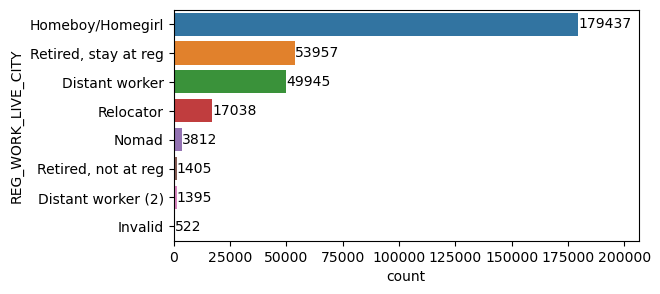

In [110]:
# Create categorical column for city mismatch

city_type_map = {
    '000': 'Homeboy/Homegirl',
    '011': 'Distant worker',
    '101': 'Distant worker (2)',
    '110': 'Relocator',
    '111': 'Nomad',
    '001': 'Invalid',
    '010': 'Invalid',
    '100': 'Invalid'
}

# join the 0,1 together then map them to correct category
df_app['REG_WORK_LIVE_CITY'] = df_app[city_mismatch_columns].astype(str).agg(''.join, axis=1).map(city_type_map)

# replace the Pensioner to their correct Category
df_app['REG_WORK_LIVE_CITY'][(df_app.INCOME_TYPE=='Pensioner') & ~(df_app.REG_WORK_LIVE_CITY=='Homeboy/Homegirl')] = 'Retired, not at reg'
df_app['REG_WORK_LIVE_CITY'][(df_app.INCOME_TYPE=='Pensioner') & (df_app.REG_WORK_LIVE_CITY=='Homeboy/Homegirl')] = 'Retired, stay at reg'

eda_show_count(data=df_app, y='REG_WORK_LIVE_CITY', figsize=(6, 3))

Count how many different cities are associated to each applicant:

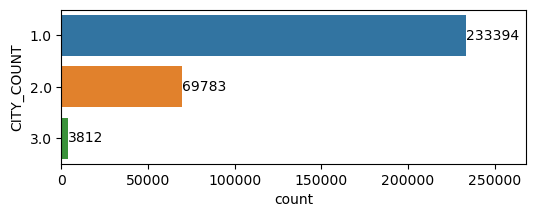

In [111]:
city_count_map = {
    'Homeboy/Homegirl': 1,
    'Retired, stay at reg' : 1,
    'Distant worker': 2,
    'Distant worker (2)': 2,
    'Relocator': 2,
    'Retired, not at reg': 2,
    'Nomad': 3,
    'Invalid': np.NaN, 
}

df_app['CITY_COUNT'] = df_app['REG_WORK_LIVE_CITY'].map(city_count_map)
eda_show_count(data=df_app, y='CITY_COUNT', figsize=(6, 2))

In [112]:
# Drop original city-pair mismatch columns
df_app.drop(columns = city_mismatch_columns, inplace=True)

### Shorten some category name

In [113]:
df_app['EDUCATION'].replace('Secondary / secondary special', 'Secondary', inplace=True)
df_app['MARITAL_STATUS'].replace('Single / not married', 'Single', inplace=True)

# 3. Previous application data

**To do:**
1. Retain quantitative summary for each client, such as:
- How many previous application each client had in the past.
- number of approved, refused,... applications for each client.
- total and average of applied credit for each client.
- total and average of approve credit for each client.
2. Drop non-quantitative info or info that are unique to each application

In [114]:
df_prev = pd.read_csv('previous_application.csv')
df_prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


## 3.1 Check datatype

In [115]:
df_prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

## 3.2 Check for missing values

#### Check for columns with large amount of null and drop

In [116]:
df_prev.replace('XNA', np.NaN, inplace=True)
eda_check_null(df_prev)

Columns with more than 10% missing, (unit: %)
AMT_ANNUITY                  22.29
AMT_DOWN_PAYMENT             53.64
AMT_GOODS_PRICE              23.08
RATE_DOWN_PAYMENT            53.64
RATE_INTEREST_PRIMARY        99.64
RATE_INTEREST_PRIVILEGED     99.64
NAME_CASH_LOAN_PURPOSE       40.59
NAME_PAYMENT_TYPE            37.56
NAME_TYPE_SUITE              49.12
NAME_GOODS_CATEGORY          56.93
NAME_PORTFOLIO               22.29
NAME_PRODUCT_TYPE            63.68
NAME_SELLER_INDUSTRY         51.23
CNT_PAYMENT                  22.29
NAME_YIELD_GROUP             30.97
DAYS_FIRST_DRAWING           40.30
DAYS_FIRST_DUE               40.30
DAYS_LAST_DUE_1ST_VERSION    40.30
DAYS_LAST_DUE                40.30
DAYS_TERMINATION             40.30
NFLAG_INSURED_ON_APPROVAL    40.30
dtype: float64
************************************************************
Columns with less than 10% missing, (unit: values)
NAME_CONTRACT_TYPE      346
AMT_CREDIT                1
CODE_REJECT_REASON     5244
NAME_CLI

In [117]:
# calculate percentage of nulls in each column
df_prev_null_pct = df_prev.isna().sum()/len(df_prev)

# drop column with >20% null
df_prev.drop(columns = df_prev_null_pct[df_prev_null_pct>0.2].index, inplace=True)

# Drop non-quantitative info or info that are unique to each application
df_prev.drop(columns = ['SK_ID_PREV',
                        'WEEKDAY_APPR_PROCESS_START',
                        'HOUR_APPR_PROCESS_START',
                        'DAYS_DECISION',
                        'NAME_CONTRACT_TYPE',
                        'AMT_APPLICATION',
                        'CODE_REJECT_REASON',
                        'NAME_CLIENT_TYPE',
                        'CHANNEL_TYPE',
                        'SELLERPLACE_AREA',
                        'PRODUCT_COMBINATION'
                       ], inplace=True)

In [118]:
eda_check_null(df_prev)

Columns with more than 10% missing, (unit: %)
Series([], dtype: float64)
************************************************************
Columns with less than 10% missing, (unit: values)
AMT_CREDIT    1
dtype: int64


**Check the missing value in AMT_CREDIT**    

In [119]:
df_prev[df_prev.AMT_CREDIT.isna()]

,SK_ID_CURR,AMT_CREDIT,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CONTRACT_STATUS
1127152,438387,NaN,Y,1,Approved


In [120]:
df_prev[df_prev.SK_ID_CURR==438387]

,SK_ID_CURR,AMT_CREDIT,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CONTRACT_STATUS
38671,438387,47970.0,Y,1,Refused
61881,438387,225000.0,Y,1,Approved
61966,438387,254700.0,Y,1,Refused
96589,438387,254700.0,Y,1,Approved
148954,438387,101880.0,Y,1,Approved
290459,438387,152820.0,Y,1,Approved
1127152,438387,NaN,Y,1,Approved
1379176,438387,180000.0,Y,1,Approved
1402397,438387,329148.0,Y,1,Refused


In [121]:
# Fill nan with mean of AMT_CREDIT from the same ID
df_prev.AMT_CREDIT.fillna(df_prev[df_prev.SK_ID_CURR==438387]['AMT_CREDIT'].mean(), inplace=True)

## 3.3 Check for outlier/wrong value

In [122]:
df_prev.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,1670214.0,278357.174099,102814.823849,100001.0,189329.0,278714.5,367514.0,456255.0
AMT_CREDIT,1670214.0,196114.019520,318574.521185,0.0,24160.5,80541.0,216418.5,6905160.0
NFLAG_LAST_APPL_IN_DAY,1670214.0,0.996468,0.059330,0.0,1.0,1.0,1.0,1.0


- There are value 0 in AMT_CREDIT
- AMT_CREDIT is the amount of credit approved by the bank for the loan. Value 0 doesn not make sense here.

### For AMT_CREDIT == 0

**Is AMT_CREDIT==0 always a result of Cancelled or Refused application?**

In [123]:
# show status of AMT_CREDIT==0
df_prev[df_prev.AMT_CREDIT==0]['NAME_CONTRACT_STATUS'].value_counts()

Canceled        305566
Refused          29159
Approved          1551
Unused offer       492
Name: NAME_CONTRACT_STATUS, dtype: int64

The majority are Cancelled and Refused, but there are still 1551 approved application with AMT_CREDIT==0

In [124]:
# how many unique ID has AMT_CREDIT==0 in one of their previous contracts
len(df_prev[df_prev.AMT_CREDIT==0]['SK_ID_CURR'].unique())

136261

In [125]:
# how many unique ID has AMT_CREDIT==0 and Status == Cancelled
len(df_prev[(df_prev.AMT_CREDIT==0) & (df_prev.NAME_CONTRACT_STATUS=='Canceled')]['SK_ID_CURR'].unique())

128952

Drop all contracts which was 'Canceled' & AMT credit == 0 because they seem like they were canceled due to faulty input.

In [126]:
df_prev.drop(index = df_prev[(df_prev.AMT_CREDIT==0) & (df_prev.NAME_CONTRACT_STATUS.isin(['Canceled','Refused']))].index,
             inplace=True
            )

In [127]:
df_prev[(df_prev.AMT_CREDIT==0)]['NAME_CONTRACT_STATUS'].value_counts()

Approved        1551
Unused offer     492
Name: NAME_CONTRACT_STATUS, dtype: int64

Try to fill the rest with mean from non-zero amount of the same ID

In [128]:
# calculate AMT_CREDIT mean excluding 0 for each ID
mean_by_id = df_prev[df_prev.AMT_CREDIT>0].groupby('SK_ID_CURR').mean(numeric_only = True)['AMT_CREDIT'].to_frame().reset_index()
mean_by_id

,SK_ID_CURR,AMT_CREDIT
0,100001,23787.00
1,100002,179055.00
2,100003,484191.00
3,100004,20106.00
4,100005,40153.50
...,...,...
338600,456251,40455.00
338601,456252,56821.50
338602,456253,20625.75
338603,456254,134439.75


In [129]:
%%capture
# Replace 0 with mean 
for ID in df_prev['SK_ID_CURR'][df_prev.AMT_CREDIT==0]:
    df_prev['AMT_CREDIT'][df_prev.SK_ID_CURR==ID] = mean_by_id['AMT_CREDIT'][mean_by_id.SK_ID_CURR == ID]

## 3.4 Create summary data

In [130]:
df_prev_status_count = df_prev.groupby(['SK_ID_CURR','NAME_CONTRACT_STATUS']).count()['AMT_CREDIT'].to_frame()

# Count the occurence of each status for each unique applicant
df_prev_summary = df_prev_status_count.pivot_table(index='SK_ID_CURR', columns='NAME_CONTRACT_STATUS', values='AMT_CREDIT', fill_value=0)
df_prev_summary

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer
SK_ID_CURR,,,,
100001,1,0,0,0
100002,1,0,0,0
100003,3,0,0,0
100004,1,0,0,0
100005,1,0,0,0
...,...,...,...,...
456251,1,0,0,0
456252,1,0,0,0
456253,2,0,0,0


In [131]:
status_list = ['Approved','Canceled','Refused','Unused offer']

# Count the total previous applications of each applicant
df_prev_summary['TOTAL_PREV_APPLICATION'] = df_prev_summary[status_list].sum(axis=1)
df_prev_summary

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer,TOTAL_PREV_APPLICATION
SK_ID_CURR,,,,,
100001,1,0,0,0,1
100002,1,0,0,0,1
100003,3,0,0,0,3
100004,1,0,0,0,1
100005,1,0,0,0,1
...,...,...,...,...,...
456251,1,0,0,0,1
456252,1,0,0,0,1
456253,2,0,0,0,2


**Calculate sum/average of total/approved credit**

- TOTAL_CREDIT_APPLIED = (sum of AMT_CREDIT from all previous application)
- TOTAL_CREDIT_APPROVED = (sum of AMT_CREDIT which NAME_CONTRACT_STATUS=='Approved')

- AVERAGE_CREDIT_APPLIED = (TOTAL_CREDIT_APPLIED) / (total applications)
- AVERAGE_CREDIT_APPROVED = (TOTAL_CREDIT_APPROVED) / (total 'Approved' application)

In [132]:
# Add sum/average of total/approved credit to df_prev_summary
df_prev_summary['TOTAL_CREDIT_APPLIED'] = df_prev.groupby('SK_ID_CURR').sum(numeric_only = True)['AMT_CREDIT']
df_prev_summary['TOTAL_CREDIT_APPROVED'] = df_prev[df_prev.NAME_CONTRACT_STATUS=='Approved'].groupby('SK_ID_CURR').sum(numeric_only = True)['AMT_CREDIT']

df_prev_summary['AVERAGE_CREDIT_APPLIED'] = df_prev_summary['TOTAL_CREDIT_APPLIED'] / df_prev_summary[status_list].sum(axis=1)
df_prev_summary['AVERAGE_CREDIT_APPROVED'] = df_prev_summary['TOTAL_CREDIT_APPROVED'] / df_prev_summary['Approved']

df_prev_summary.head(5)

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer,TOTAL_PREV_APPLICATION,TOTAL_CREDIT_APPLIED,TOTAL_CREDIT_APPROVED,AVERAGE_CREDIT_APPLIED,AVERAGE_CREDIT_APPROVED
SK_ID_CURR,,,,,,,,,
100001,1,0,0,0,1,23787.0,23787.0,23787.0,23787.0
100002,1,0,0,0,1,179055.0,179055.0,179055.0,179055.0
100003,3,0,0,0,3,1452573.0,1452573.0,484191.0,484191.0
100004,1,0,0,0,1,20106.0,20106.0,20106.0,20106.0
100005,1,0,0,0,1,40153.5,40153.5,40153.5,40153.5


In [133]:
df_prev_summary.isna().sum()

NAME_CONTRACT_STATUS
Approved                      0
Canceled                      0
Refused                       0
Unused offer                  0
TOTAL_PREV_APPLICATION        0
TOTAL_CREDIT_APPLIED          0
TOTAL_CREDIT_APPROVED       910
AVERAGE_CREDIT_APPLIED     1947
AVERAGE_CREDIT_APPROVED    2855
dtype: int64

In [134]:
# Fill null with 0 because these ID have no previous approved application
df_prev_summary.fillna(0, inplace=True)

## 3.5 Check outliers and assign bins

[ 1.  2.  4. 10.]


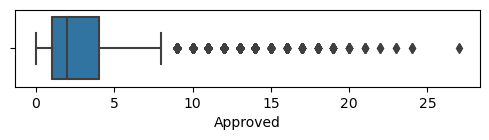

[0. 0. 0. 1.]


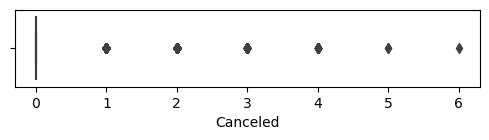

[0. 0. 1. 8.]


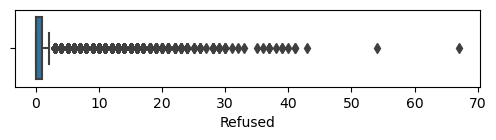

[0. 0. 0. 1.]


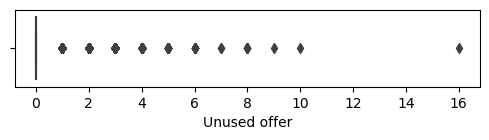

In [135]:
# Check outliers for Approved,Canceled,Refused,Unused offer
for feature in df_prev_summary.loc[:,'Approved':'Unused offer'].columns:
    plt.figure(figsize=(6,1))
    print(df_prev_summary[feature].quantile([0.25,0.5,.75,.99]).values )
    sns.boxplot(data = df_prev_summary, x = feature)
    plt.show()

In [136]:
# Assign bins for Approved,Canceled,Refused,Unused offer
for feature in df_prev_summary.loc[:,'Approved':'Unused offer'].columns:
    df_prev_summary[feature+'_GROUP'] = pd.cut(df_prev_summary[feature], [-1,0,1,2,3,4,5,6,100], labels=['0','1','2','3','4','5','6','7+'])

[ 156456.          431433.         1169602.875      7020516.19499999]


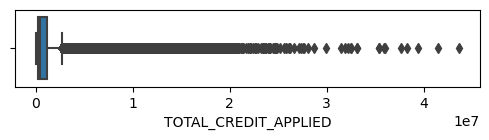

[ 128248.875  318595.5    805807.125 3568688.865]


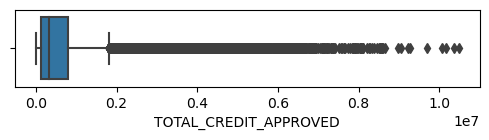

[ 76369.1625     138916.88221154 268028.15625    955053.135     ]


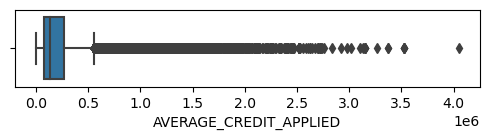

[ 70675.65   125955.     235515.375  820352.9025]


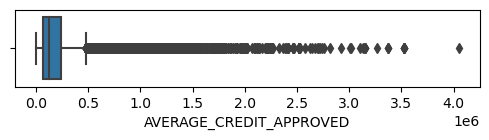

In [137]:
# Check outliers for TOTAL/AVERAGE CREDIT APPLIED/APPROVED
for feature in df_prev_summary.loc[:,'TOTAL_CREDIT_APPLIED':'AVERAGE_CREDIT_APPROVED'].columns:
    plt.figure(figsize=(6,1))
    print(df_prev_summary[feature].quantile([0.25,0.5,.75,.99]).values )
    sns.boxplot(data = df_prev_summary, x = feature)
    plt.show()

In [138]:
# Assign bins
for feature in df_prev_summary.loc[:,'TOTAL_CREDIT_APPLIED':'AVERAGE_CREDIT_APPROVED'].columns:
    df_prev_summary[feature+'_GROUP'] = pd.qcut(df_prev_summary[feature], 
                                                [0,0.5,.75,.99,1], 
                                                labels=['Low', 'Average', 'High','Very High'])
   

# 4. Merge current and previous data

What's in this section:
- 4.1 Rename columns to uppercase to match
- 4.2 Check for missing values after merging
- 4.3 Reorder the columns based on their information

In [139]:
df = pd.merge(df_app, df_prev_summary, how='left', on = 'SK_ID_CURR')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 72 columns):
 #   Column                         Non-Null Count   Dtype   
---  ------                         --------------   -----   
 0   SK_ID_CURR                     307511 non-null  int64   
 1   TARGET                         307511 non-null  int64   
 2   CONTRACT_TYPE                  307511 non-null  object  
 3   GENDER                         307511 non-null  object  
 4   OWN_CAR                        307511 non-null  object  
 5   OWN_REALTY                     307511 non-null  object  
 6   COUNT_CHILDREN                 307511 non-null  category
 7   AMOUNT_INCOME_TOTAL            307511 non-null  float64 
 8   AMOUNT_CREDIT                  307511 non-null  float64 
 9   AMOUNT_ANNUITY                 307511 non-null  float64 
 10  AMOUNT_GOODS_PRICE             307233 non-null  float64 
 11  SUITE_TYPE                     307511 non-null  object  
 12  INCOME_TYPE     

In [140]:
df.head()

,SK_ID_CURR,TARGET,CONTRACT_TYPE,GENDER,OWN_CAR,OWN_REALTY,COUNT_CHILDREN,AMOUNT_INCOME_TOTAL,AMOUNT_CREDIT,AMOUNT_ANNUITY,AMOUNT_GOODS_PRICE,SUITE_TYPE,INCOME_TYPE,EDUCATION,MARITAL_STATUS,HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,CAR_AGE,MOBILE,EMP_PHONE,WORK_PHONE,CONT_MOBILE,PHONE,EMAIL,OCCUPATION_TYPE,COUNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,ORGANIZATION_TYPE,OBS_30_COUNT_SOCIAL_CIRCLE,DEF_30_COUNT_SOCIAL_CIRCLE,OBS_60_COUNT_SOCIAL_CIRCLE,DEF_60_COUNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,AMOUNT_REQ_CB_YEAR,MISSING_BUILDING_INFO,EXT_SOURCE_MEAN,EXT_SOURCE_COUNT,AMOUNT_INCOME_GROUP,CAR_AGE_GROUP,AMOUNT_CREDIT_GROUP,AMOUNT_ANNUITY_GROUP,AMOUNT_GOODS_PRICE_GROUP,AGE_GROUP,YEARS_EMPLOYED_GROUP,DOC_TYPE,REGION_MISMATCH,REG_WORK_LIVE_CITY,CITY_COUNT,Approved,Canceled,Refused,Unused offer,TOTAL_PREV_APPLICATION,TOTAL_CREDIT_APPLIED,TOTAL_CREDIT_APPROVED,AVERAGE_CREDIT_APPLIED,AVERAGE_CREDIT_APPROVED,Approved_GROUP,Canceled_GROUP,Refused_GROUP,Unused offer_GROUP,TOTAL_CREDIT_APPLIED_GROUP,TOTAL_CREDIT_APPROVED_GROUP,AVERAGE_CREDIT_APPLIED_GROUP,AVERAGE_CREDIT_APPROVED_GROUP
0,100002,1,Cash loans,M,N,Y,None,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary,Single,House / apartment,0.018801,25.9,1.7,10.0,5.8,NaN,1,1,0,1,1,0,Laborers,1,2,2,WEDNESDAY,10,Business Entity,2.0,2.0,2.0,2.0,3.1,1.0,None,0.161787,3,Average,No car,Average,Average,Low,Under 30,<2 years,DOC_3,Matched,Homeboy/Homegirl,1.0,1.0,0.0,0.0,0.0,1.0,179055.0,179055.0,179055.00,179055.00,1,0,0,0,Low,Low,Average,Average
1,100003,0,Cash loans,F,N,N,None,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.9,3.3,3.2,0.8,NaN,1,1,0,1,1,0,Core staff,2,1,1,MONDAY,11,School,1.0,0.0,1.0,0.0,2.3,0.0,None,0.466757,2,High,No car,High,High,High,41 to 50,2-5 years,DOC_3,Matched,Homeboy/Homegirl,1.0,3.0,0.0,0.0,0.0,3.0,1452573.0,1452573.0,484191.00,484191.00,3,0,0,0,High,High,High,High
2,100004,0,Revolving loans,M,Y,Y,None,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary,Single,House / apartment,0.010032,52.2,0.6,11.7,6.9,26.0,1,1,1,1,1,0,Laborers,1,2,2,MONDAY,9,Government,0.0,0.0,0.0,0.0,2.2,0.0,All,0.642739,2,Low,20+y,Low,Low,Low,51 to 60,<2 years,NO_DOC,Matched,Homeboy/Homegirl,1.0,1.0,0.0,0.0,0.0,1.0,20106.0,20106.0,20106.00,20106.00,1,0,0,0,Low,Low,Low,Low
3,100006,0,Cash loans,F,N,Y,None,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary,Civil marriage,House / apartment,0.008019,52.1,8.3,26.9,6.7,NaN,1,1,0,1,0,0,Laborers,2,2,2,WEDNESDAY,17,Business Entity,2.0,0.0,2.0,0.0,1.7,-6.0,All,0.650442,1,Average,No car,Low,High,Low,51 to 60,6-10 years,DOC_3,Matched,Homeboy/Homegirl,1.0,5.0,0.0,1.0,0.0,6.0,2625259.5,1718644.5,437543.25,343728.90,5,0,1,0,High,High,High,High
4,100007,0,Cash loans,M,N,Y,None,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary,Single,House / apartment,0.028663,54.6,8.3,11.8,9.5,NaN,1,1,0,1,0,0,Core staff,1,2,2,THURSDAY,11,Religion,0.0,0.0,0.0,0.0,3.0,0.0,All,0.322738,1,Average,No car,Average,Average,Average,51 to 60,6-10 years,DOC_8,Matched,Distant worker,2.0,6.0,0.0,0.0,0.0,6.0,999832.5,999832.5,166638.75,166638.75,6,0,0,0,Average,High,Average,Average


## 4.1 Rename columns to match

In [141]:
df.rename(columns = {'Approved': 'PREV_APPROVED',
                     'Canceled': 'PREV_CANCELED',
                     'Refused': 'PREV_REFUSED',
                     'Unused offer': 'PREV_UNUSED',
                     'Approved_GROUP': 'PREV_APPROVED_GROUP',
                     'Canceled_GROUP': 'PREV_CANCELED_GROUP',
                     'Refused_GROUP': 'PREV_REFUSED_GROUP',
                     'Unused offer_GROUP': 'PREV_UNUSED_GROUP'},
          inplace=True
         )

## 4.2 Check for missing values

In [142]:
eda_check_null(df)

Columns with more than 10% missing, (unit: %)
YEARS_EMPLOYED    18.00
CAR_AGE           65.99
dtype: float64
************************************************************
Columns with less than 10% missing, (unit: values)
AMOUNT_GOODS_PRICE                 278
EXT_SOURCE_MEAN                    172
AMOUNT_GOODS_PRICE_GROUP           278
CITY_COUNT                         522
PREV_APPROVED                    16678
PREV_CANCELED                    16678
PREV_REFUSED                     16678
PREV_UNUSED                      16678
TOTAL_PREV_APPLICATION           16678
TOTAL_CREDIT_APPLIED             16678
TOTAL_CREDIT_APPROVED            16678
AVERAGE_CREDIT_APPLIED           16678
AVERAGE_CREDIT_APPROVED          16678
PREV_APPROVED_GROUP              16678
PREV_CANCELED_GROUP              16678
PREV_REFUSED_GROUP               16678
PREV_UNUSED_GROUP                16678
TOTAL_CREDIT_APPLIED_GROUP       16678
TOTAL_CREDIT_APPROVED_GROUP      16678
AVERAGE_CREDIT_APPLIED_GROUP     16678

In [143]:
# Fill null with 0 or 'No history' for IDs that have no previous data
df.loc[:,'PREV_APPROVED':'AVERAGE_CREDIT_APPROVED'] = df.loc[:,'PREV_APPROVED':'AVERAGE_CREDIT_APPROVED'].fillna(0)

for column in df.loc[:,'PREV_APPROVED_GROUP':'AVERAGE_CREDIT_APPROVED_GROUP']:
    df[column] = df[column].values.add_categories('No history').fillna('No history')
    
eda_check_null(df)

Columns with more than 10% missing, (unit: %)
YEARS_EMPLOYED    18.00
CAR_AGE           65.99
dtype: float64
************************************************************
Columns with less than 10% missing, (unit: values)
AMOUNT_GOODS_PRICE          278
EXT_SOURCE_MEAN             172
AMOUNT_GOODS_PRICE_GROUP    278
CITY_COUNT                  522
dtype: int64


## 4.3 Rearrange columns

In [144]:
f'Number of columns before rearrange: {len(df.columns)}'

'Number of columns before rearrange: 72'

In [145]:
column_reorder = [
    'SK_ID_CURR',
    # contract related
    'TARGET', 'CONTRACT_TYPE', 'AMOUNT_CREDIT', 'AMOUNT_CREDIT_GROUP', 
    'AMOUNT_ANNUITY','AMOUNT_ANNUITY_GROUP', 'AMOUNT_GOODS_PRICE',  'AMOUNT_GOODS_PRICE_GROUP','DOC_TYPE',

    # personal info
    'GENDER', 'AGE', 'AGE_GROUP', 'EDUCATION', 

    # family related
    'OWN_CAR', 'CAR_AGE', 'CAR_AGE_GROUP',  'HOUSING_TYPE', 'OWN_REALTY',
    'MARITAL_STATUS', 'COUNT_CHILDREN',  'COUNT_FAM_MEMBERS',  'SUITE_TYPE', 

     # income and profession related
    'AMOUNT_INCOME_TOTAL', 'AMOUNT_INCOME_GROUP',  'INCOME_TYPE',
    'YEARS_EMPLOYED', 'YEARS_EMPLOYED_GROUP', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE',

    # history info
    'PREV_APPROVED', 'PREV_CANCELED', 'PREV_REFUSED', 'PREV_UNUSED', 
    'PREV_APPROVED_GROUP', 'PREV_CANCELED_GROUP', 'PREV_REFUSED_GROUP', 'PREV_UNUSED_GROUP',
    'TOTAL_PREV_APPLICATION',
    'TOTAL_CREDIT_APPLIED', 'TOTAL_CREDIT_APPROVED',
    'AVERAGE_CREDIT_APPLIED', 'AVERAGE_CREDIT_APPROVED',
    'TOTAL_CREDIT_APPLIED_GROUP', 'TOTAL_CREDIT_APPROVED_GROUP',
    'AVERAGE_CREDIT_APPLIED_GROUP', 'AVERAGE_CREDIT_APPROVED_GROUP',

    # contact and circle
    'MOBILE', 'EMP_PHONE', 'WORK_PHONE', 'CONT_MOBILE', 'PHONE', 'EMAIL', 
    'YEARS_LAST_PHONE_CHANGE', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH',
    'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 
    'OBS_30_COUNT_SOCIAL_CIRCLE', 'DEF_30_COUNT_SOCIAL_CIRCLE',
    'OBS_60_COUNT_SOCIAL_CIRCLE', 'DEF_60_COUNT_SOCIAL_CIRCLE',
    'AMOUNT_REQ_CB_YEAR', 'MISSING_BUILDING_INFO',
    'EXT_SOURCE_MEAN', 'EXT_SOURCE_COUNT', 

    # region related
    'REGION_POPULATION_RELATIVE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 
    'REGION_MISMATCH','REG_WORK_LIVE_CITY','CITY_COUNT']

f'Double check: After {len(column_reorder)} = Before {len(df.columns)}?'

'Double check: After 72 = Before 72?'

In [146]:
df = df[column_reorder]

Now the data is ready for analysis

In [147]:
# Create csv for preprocessed data
df.to_csv('df_preprocessed_for_analysis.csv', index=False)

# 5. Univariate analysis

In [148]:
df = pd.read_csv('df_preprocessed_for_analysis.csv')
df.drop('SK_ID_CURR',axis=1, inplace=True)

In [149]:
# prepare under 99th percentile data for extremely right skewed columns that we detected during outlier analysis
AMOUNT_INCOME_TOTAL_Q99 = df[df.AMOUNT_INCOME_TOTAL < df.AMOUNT_INCOME_TOTAL.quantile(.99)]
AMOUNT_CREDIT_Q99 = df[df.AMOUNT_CREDIT < df.AMOUNT_CREDIT.quantile(.99)]
AMOUNT_ANNUITY_Q99 = df[df.AMOUNT_ANNUITY < df.AMOUNT_ANNUITY.quantile(.99)]
AMOUNT_GOODS_PRICE_Q99 = df[df.AMOUNT_GOODS_PRICE < df.AMOUNT_GOODS_PRICE.quantile(.99)]
TOTAL_CREDIT_APPLIED_Q99 = df[df.TOTAL_CREDIT_APPLIED < df.TOTAL_CREDIT_APPLIED.quantile(.99)]
TOTAL_CREDIT_APPROVED_Q99 = df[df.TOTAL_CREDIT_APPROVED < df.TOTAL_CREDIT_APPROVED.quantile(.99)]
AVERAGE_CREDIT_APPLIED_Q99 = df[df.AVERAGE_CREDIT_APPLIED < df.AVERAGE_CREDIT_APPLIED.quantile(.99)]
AVERAGE_CREDIT_APPROVED_Q99 = df[df.AVERAGE_CREDIT_APPROVED < df.AVERAGE_CREDIT_APPROVED.quantile(.99)]

## 5.1 Target

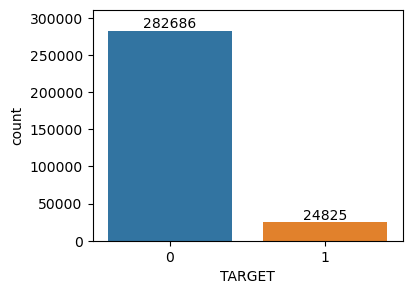

Average Target 1 rate: 8.07%


In [150]:
# Count
eda_show_count(df, x='TARGET', figsize=(4,3))
print(f'Average Target 1 rate: {df.TARGET.mean()*100:.2f}%')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**
- The dataset has an average **Target 1 rate of 8.07%**. 
- Since the target variable is imbalanced, we will use this rate as benchmark for analysing segmented / categorical variables (instead of just looking at absolute amount). 
- A segment (for numerical features) or a categorical class (for categorical features) has **higher chance of payment difficulty than average** if its rate is **significantly higher than 8.07%** and vice versa.
- Note: for short, the analysis below will often refer to payment difficulty rate as **PD rate**.
</div>

## 5.2 Numerical feature

### Overview

In [151]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
TARGET,307511.0,0.08,0.27,0.0,0.00,0.00,0.00,1.00
AMOUNT_CREDIT,307511.0,599026.00,402490.78,45000.0,270000.00,513531.00,808650.00,4050000.00
AMOUNT_ANNUITY,307511.0,27108.62,14493.87,1615.5,16524.00,24903.00,34596.00,258025.50
AMOUNT_GOODS_PRICE,307233.0,538396.21,369446.46,40500.0,238500.00,450000.00,679500.00,4050000.00
AGE,307511.0,43.94,11.96,20.5,34.00,43.20,53.90,69.10
CAR_AGE,104587.0,12.06,11.94,0.0,5.00,9.00,15.00,69.00
AMOUNT_INCOME_TOTAL,307511.0,168417.92,108811.64,25650.0,112500.00,147150.00,202500.00,18000090.00
YEARS_EMPLOYED,252149.0,6.53,6.41,0.0,2.10,4.50,8.70,49.10
PREV_APPROVED,307511.0,2.86,2.17,0.0,1.00,2.00,4.00,27.00
PREV_CANCELED,307511.0,0.03,0.19,0.0,0.00,0.00,0.00,6.00


<div class="alert-success", style="padding: 10px">

**Observation:**
    
- Average age of applicants is about 44.

- Average years of employment is 6.5 years. Compare to the average age of 44, most applicants seems to have low years of employment for their age or we have a large amount of retired applicants (as retirees's years of employment are not applicable). It could also be both.

- Among clients who own car, the average car age is 12 years. 50% of the cars are more than 9 years. We can see that the majority do not own new cars.

- Majority of clients are associated with only 1 city (live and work in the same city as their registered address).

- Amount credit is highly right skewed, with max values are much higher than the average range. Average credit amount per application is 600,000. 
</div>   

***
### Contract info

#### AMOUNT_CREDIT

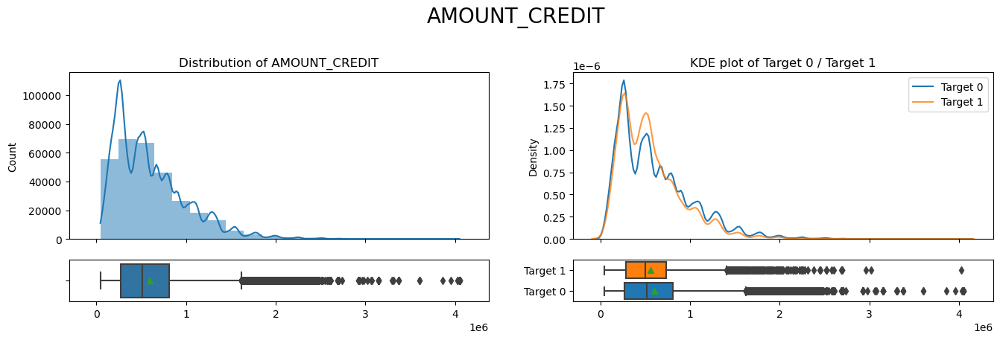

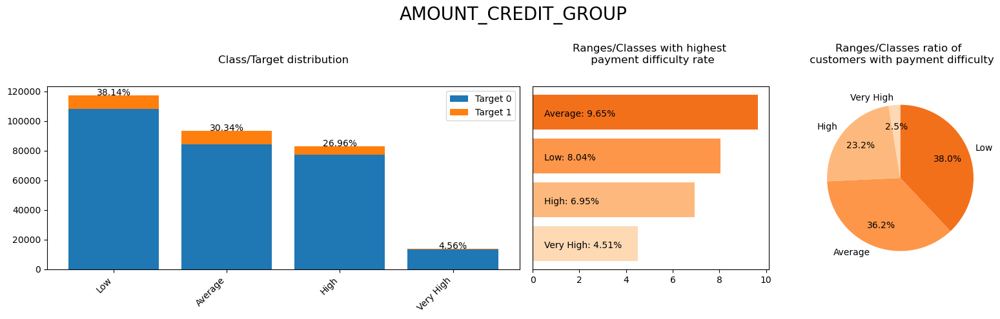

In [152]:
eda_histbox_summary(df, 'AMOUNT_CREDIT')
eda_unicat('AMOUNT_CREDIT_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >
   
**Observation:**
    
- AMOUNT_CREDIT has a right skewed distribution. 
- While the max amount can go up to 4 million, the majority distribution is under 900,000 and has a mean of 600,000.
- The 'Average' range has higher than average payment difficulty rate, while the high and very high range has significantly lower payment difficulty rate. 
- There seems to be correlation between the AMOUNT_CREDIT and payment difficulty rate, where the customers who was approved low/average amount have higher chance of payment difficulty than those with high/very high amount
</div>   



#### AMOUNT_ANNUITY

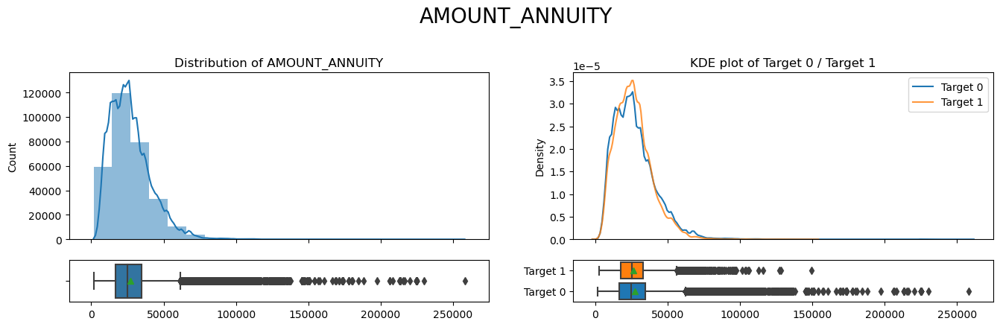

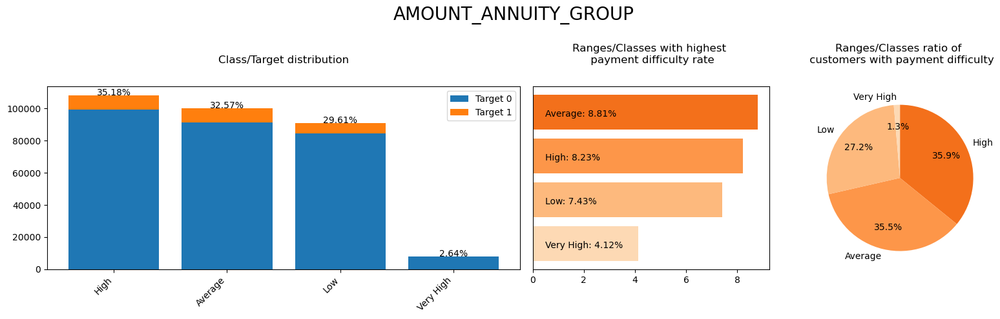

In [153]:
eda_histbox_summary(df, 'AMOUNT_ANNUITY')
eda_unicat('AMOUNT_ANNUITY_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- AMOUNT_ANNUITY has a very right-skewed distribution.    
- The majority distribution is under 50,000 and has a mean of 27,108, while the max values can go up over 200,000.
- There seems to be a relationship between annuity amount and payment difficulty rate, just not a linear correlation one.
- Customers with average/high annuity have higher than average payment difficulty rate, while customers on either end (low or very high) annuity have lower than average rate.
- Annuity is defined as the amount a customer has to pay per installment. Here we can guess that:
>- If the amount is low, the customers have little trouble to pay. 
>- For customer with very high annuity, their income is substantially higher that they have also have no trouble paying. 
>- Hence the ones in the middle range would have highest PD rate. It is possible that their income cannot keep up with the annuity amount. We will investigate this further in multivariate analysis section.
    
</div>   



#### AMOUNT_GOODS_PRICE

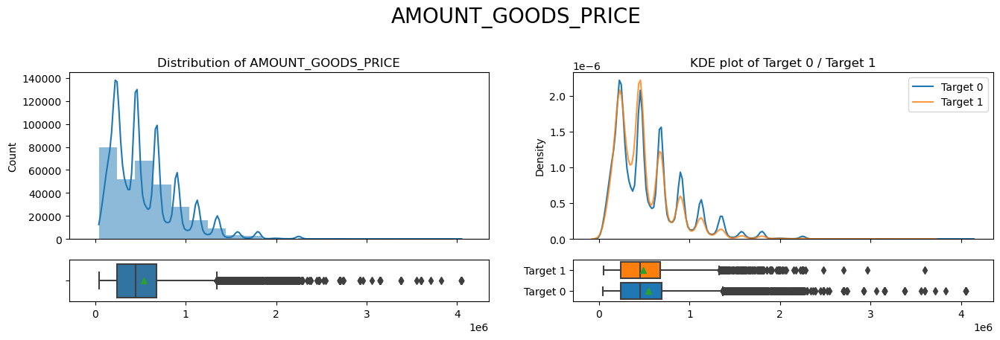

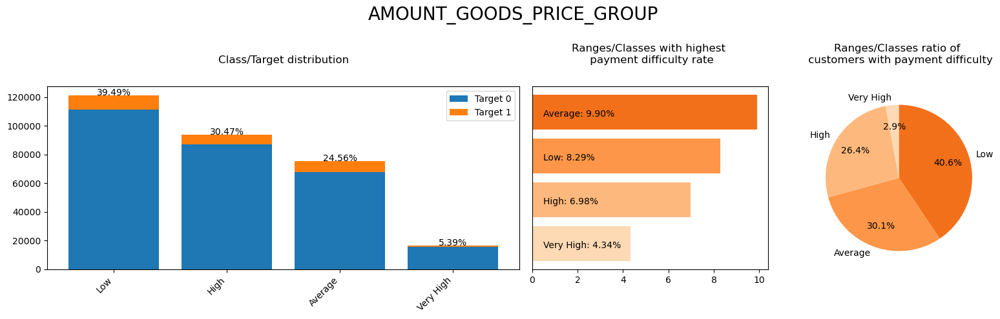

In [154]:
eda_histbox_summary(df, 'AMOUNT_GOODS_PRICE')
eda_unicat('AMOUNT_GOODS_PRICE_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- AMOUNT_GOODS_PRICE's distribution is quite similar to AMOUNT_CREDIT, which is expected. By definition, we can expected it to be strongly correlated with AMOUNT_CREDIT.
- AMOUNT_GOODS_PRICE has a right skewed distribution. 
- The max amount go up to 4 million, the majority distribution is under 700,000 and has a mean of 538,396.
- The 'Average' range has the highest payment difficulty rate, while the high and very high range has significantly lower payment difficulty rate. 
- Similar to AMOUNT_CREDIT, the customers who was approved low/average amount have higher chance of payment difficulty than those with high/very high amount
</div>   



#### AMOUNT_REQ_CB_YEAR

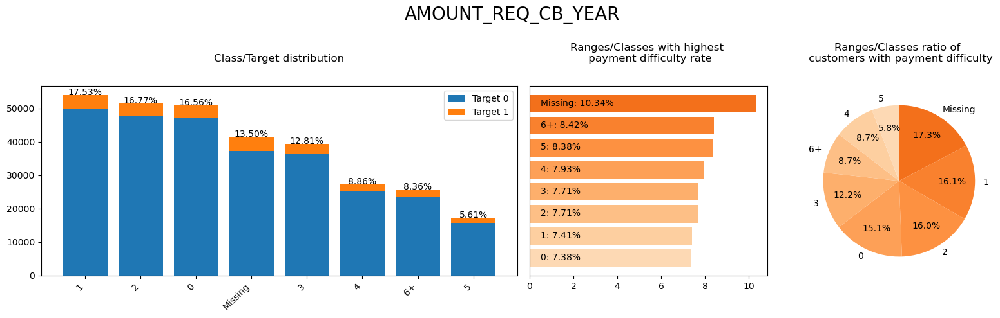

In [155]:
eda_unicat(pd.cut(df.AMOUNT_REQ_CB_YEAR, [-7,-1,0,1,2,3,4,5,20], labels = ['Missing','0','1','2','3','4','5','6+']))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Having many requests, meaning have applied for loans many time, can be a sign of financially struggling.
- People who had many requests in the year prior to the loan application have significantly higher payment difficulty rate than those with fewer request. 
- People who have more than 5 requests have significantly higher chance of payment difficulty (8.38%) than average (8.07%).
- Conversely, people who have no more than 3 requests have significantly lower chance of PD (7.71% or less)
- The clients that have missing value for amount request have the highest PD rate (10.34%). The bank needs to investigate the source of this segment and apply stricter procedure/requirements for such clients.
- Overall, this seems to be a good indicator of payment difficulty chance. The number of requests has a strong correlation to PD rate.  

</div>   



#### EXT_SOURCE_COUNT, EXT_SOURCE_MEAN

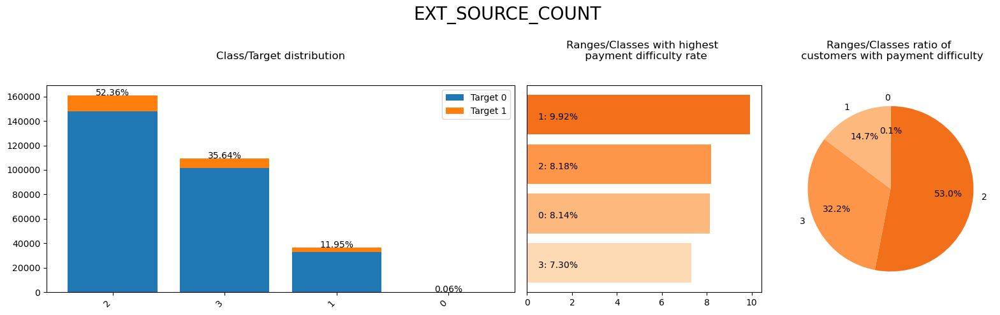

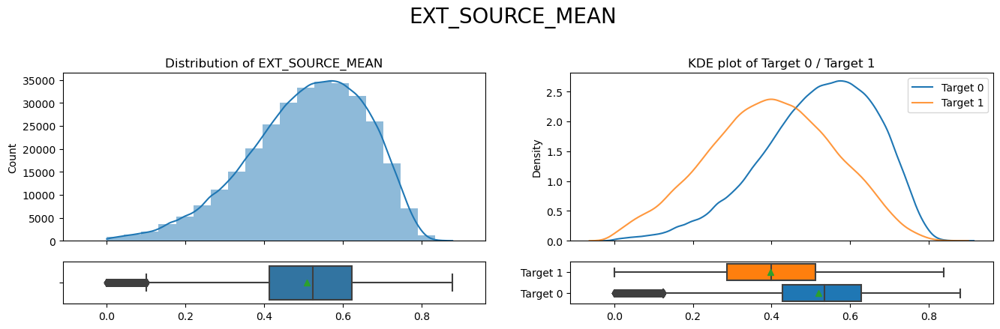

In [156]:
eda_unicat(df['EXT_SOURCE_COUNT'].astype(str))
eda_histbox_summary(df, 'EXT_SOURCE_MEAN')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

EXT_SOURCE_COUNT: 
- Nearly 90% of customers have at least 2 external source rating. About more than 10% have only 1 source.
- Customers who has only 1 source available has higher payment difficulty rate than those who has 2 and 3.
    
EXT_SOURCE_MEAN: 
- Customers with higher chance of PD has lower mean of available EXT_SOURCE rating than customers of all other cases, 0.4 vs 0.5 respectively. 

The external source mean ratings and number of the available sources can serve as a good reference for considering giving a loan to a client.
    
</div>   



***
### Personal info

#### AGE

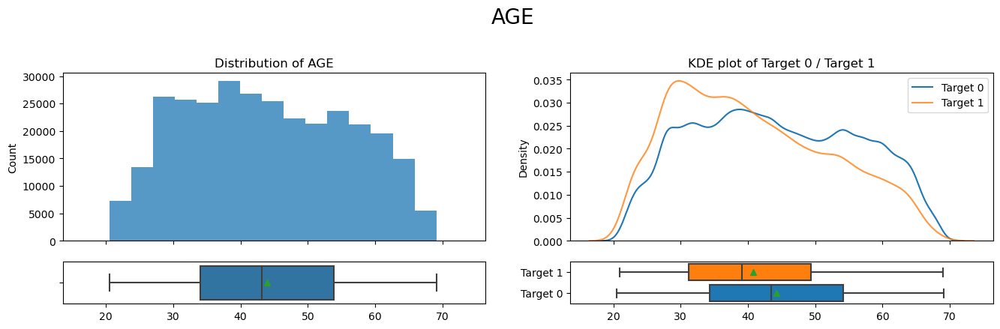

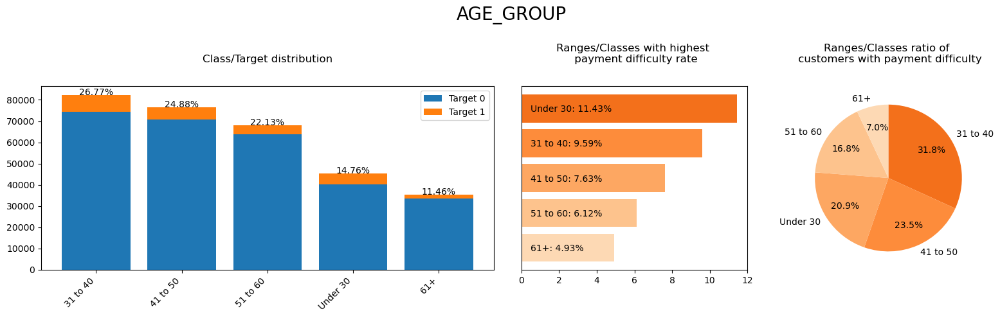

In [157]:
eda_histbox_summary(df,'AGE', bins=15, kde=False)
eda_unicat('AGE_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**
- Customers' age are from 20 to 69, with a mean of 44.
- Age seems to have a good correlation to payment difficulty rate, as we can see that the age groups with the highest rate are Under 30% and gradually decrease as the age goes up.
- Under 30 and 31-40 has significantly higher chance of payment difficulty (11.4% and 9.6%) than average (8.07%), while the rest have lower payment difficulty rate. 61+'s PD rate is the lowest, at 4.93%.
- Age seems to be a good factor to determine the chance an applicant would have trouble paying. This seems to suggest that older customers tend to have better income, better job position which leads to better financial status. We will investigate this further in multivariate analysis.
- Nearly 1/3 of clients with PD the bank have had are from 31-40 group - the group with 2nd highest risk. The bank may need to apply stricter requirement in the future on this age group to limit the clients with PD from said group.

</div>   



#### CAR_AGE

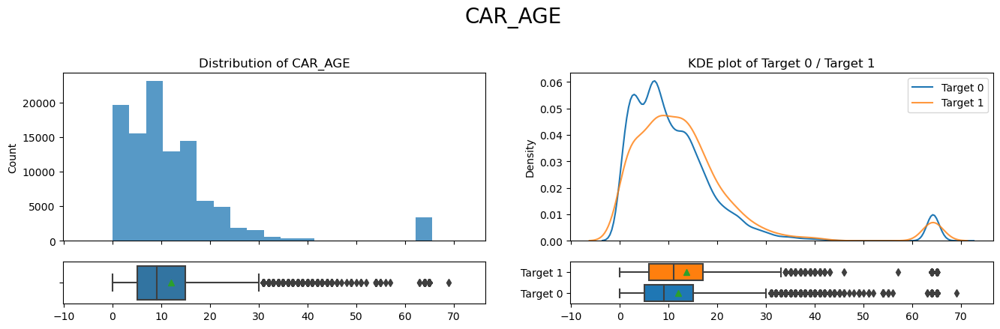

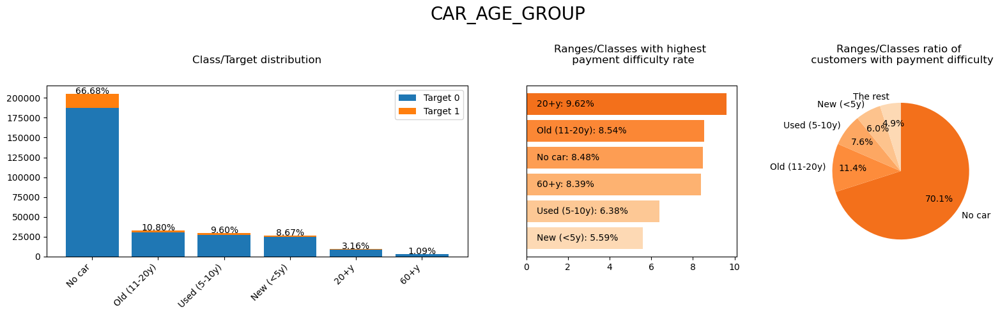

In [158]:
eda_histbox_summary(df,'CAR_AGE', bins=20, kde=False)
eda_unicat('CAR_AGE_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**
- About 1/3 of the clients own car.
- The groups with highest PD rate are those with old cars (**8.54%** for **11-20 years** and **9.62%** for **20+ years**), while those with newer cars have the lowest PD rate (**5.6%** for **less than 5years** and **6.4%** for **5-10 years**).
- Clients with no car also have slightly higher chance of PD than average.
- This reveals an insight that those who could afford new cars tends to be more financially stable than those who could only afford older cars or could not afford one at all.
</div>   



#### YEARS_EMPLOYED

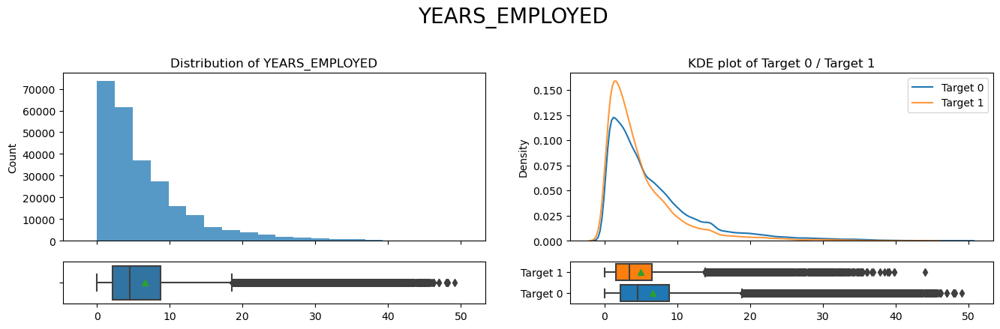

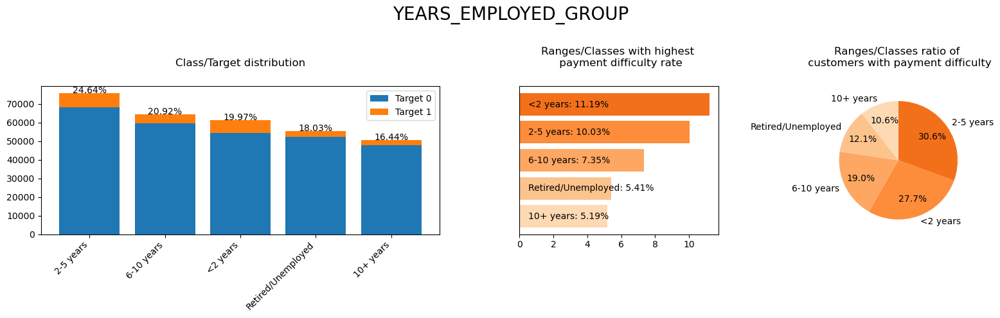

In [159]:
eda_histbox_summary(df,'YEARS_EMPLOYED', bins=20, kde=False)
eda_unicat('YEARS_EMPLOYED_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Years of employment has a right skewed distribution. The majority is under 10 years, mean is 6.5 years.
- Customers with less than 5 years of employment have significantly higher risk of payment difficulty than average, while customers with 10+ years or retired has the lowest payment difficulty rate.
- 58% of clients with PD the bank has had are from under 5 years of employment - the groups with highest risk. The bank may need to apply stricter requirement in the future on this group to limit the clients with PD from said group.
</div>   



#### AMOUNT_INCOME_TOTAL

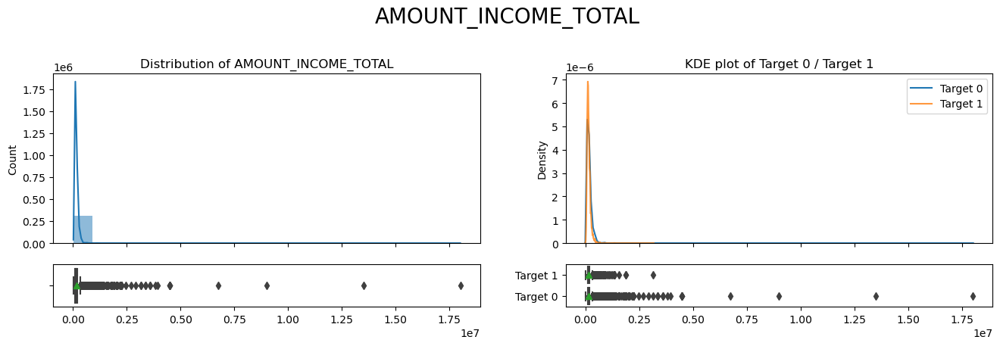

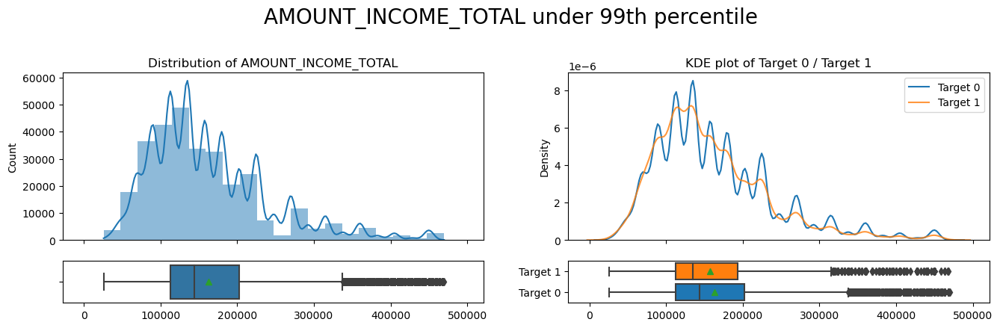

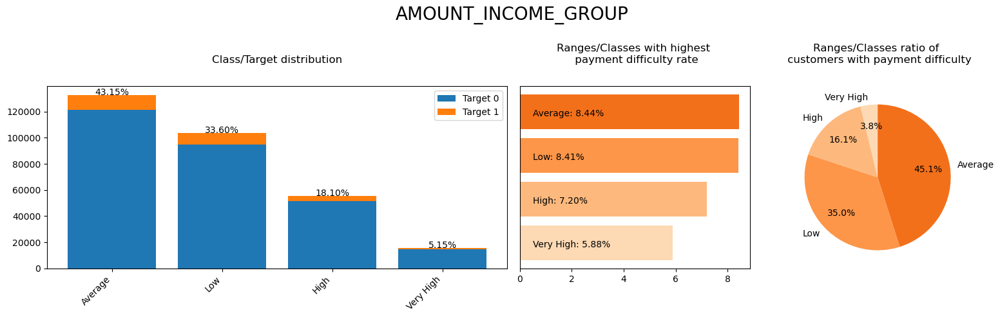

In [160]:
eda_histbox_summary(df, 'AMOUNT_INCOME_TOTAL')
eda_histbox_summary(AMOUNT_INCOME_TOTAL_Q99, 'AMOUNT_INCOME_TOTAL', plot_title = 'AMOUNT_INCOME_TOTAL under 99th percentile')
eda_unicat('AMOUNT_INCOME_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- AMOUNT_INCOME_TOTAL has a very right skewed distribution, with many extreme values in the high range.
- The majority is under 200,000, the mean income is about 168,000.
- The low and mid ranges has higher than average PD rate, while the high and very high range has significantly lower PD rate.
- Income seems to be a good factor to determine payment difficulty.
</div>   



#### 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'YEARS_LAST_PHONE_CHANGE'

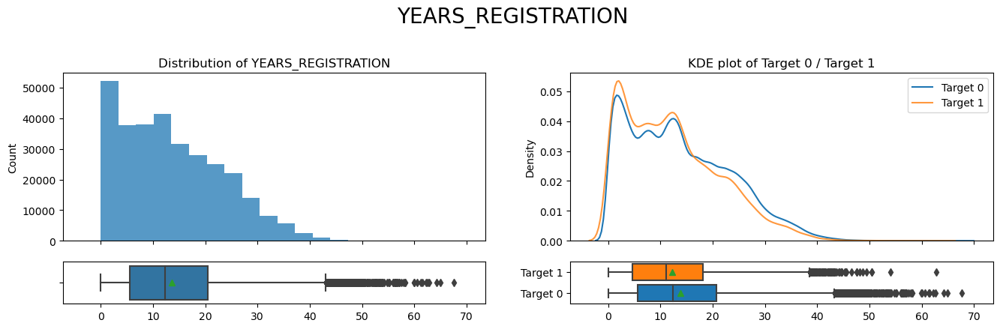

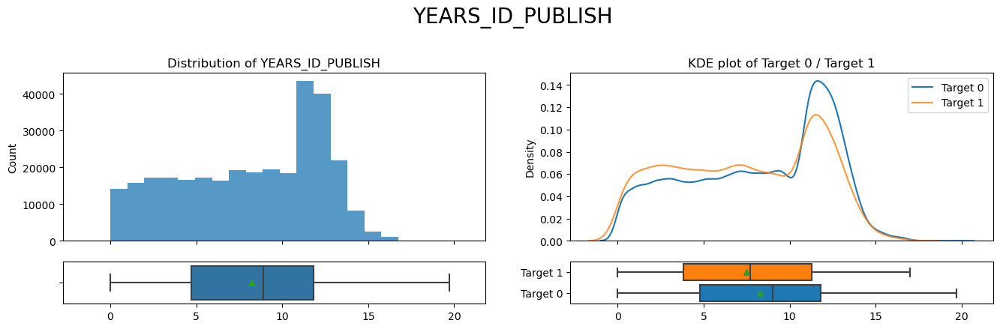

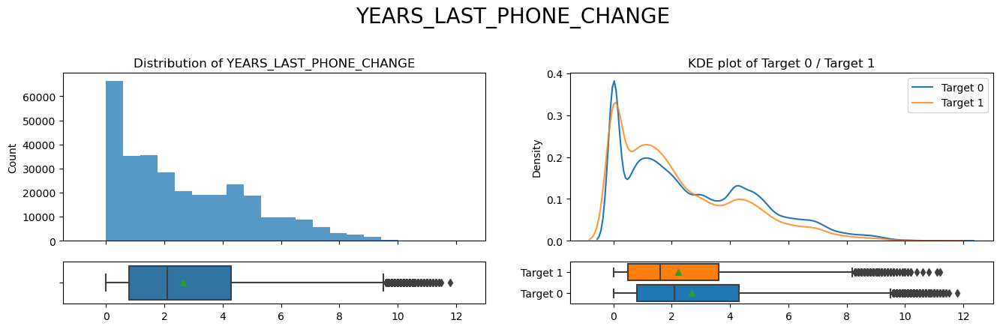

In [161]:
eda_histbox_summary(df, 'YEARS_REGISTRATION', kde=False)
eda_histbox_summary(df, 'YEARS_ID_PUBLISH', kde=False)
eda_histbox_summary(df, 'YEARS_LAST_PHONE_CHANGE', kde=False)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- YEARS_REGISTRATION, YEARS_ID_PUBLISH and YEARS_LAST_PHONE_CHANGE: Clients with PD has lower average years since registration/ID publish, but this could just be due to the fact that these features tend to correlate to AGE.

</div>   



### Credit history

#### PREV_APPROVED

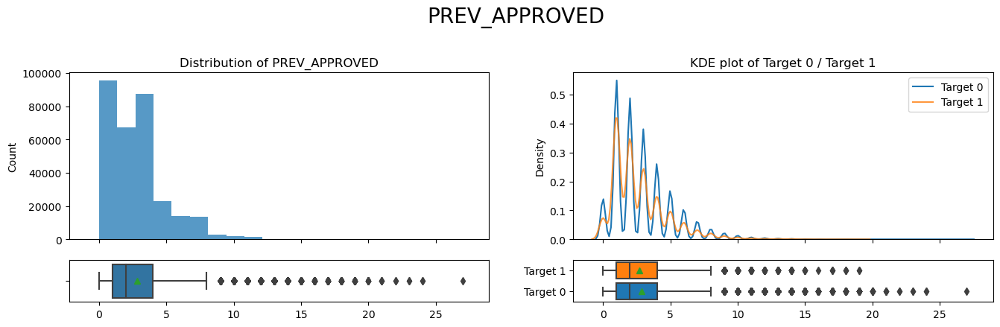

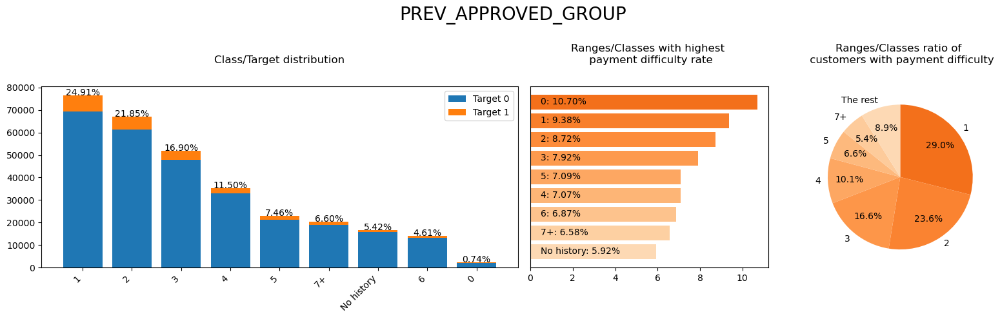

In [162]:
eda_histbox_summary(df, 'PREV_APPROVED', kde=False)
eda_unicat('PREV_APPROVED_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- The number of past approved application has a negative correlation to PD rate. But the group with the lowest rate are those with no history at all.
- In other words, while high number of previously approved applications can be a proven track record of how well a client can manage to repay, their chance of payment difficulty are still higher than who have never applied for a loan.
- Conversely, people with very few previous approved loans (ie did apply but got rejected) have significantly higher risk of payment difficulty. We will confirm this in multivariate analysis.
    
</div>   



#### PREV_REFUSED

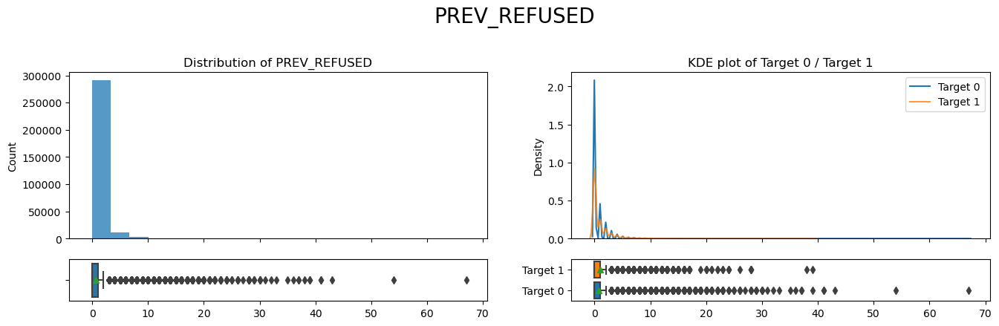

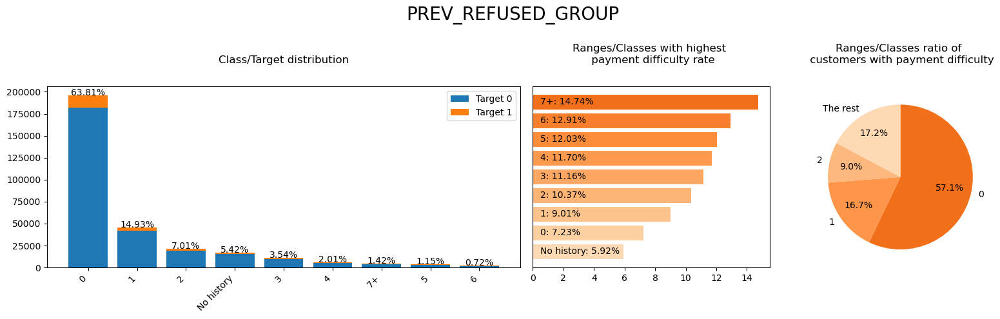

In [163]:
eda_histbox_summary(df, 'PREV_REFUSED', kde=False)
eda_unicat('PREV_REFUSED_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- In an opposite manner to PREV_APPROVED, the more times a client have been refused the loan, the higher their chance of payment difficulty are.
- Note that for clients who had even only 1 refused loan, their chance of payment difficulty is already higher than the average rate (9.01% vs 8.07%)

</div>   



#### PREV_CANCELED, PREV_UNUSED

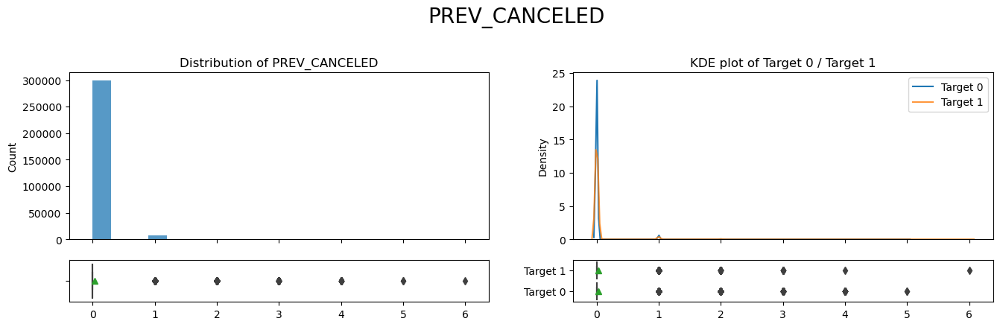

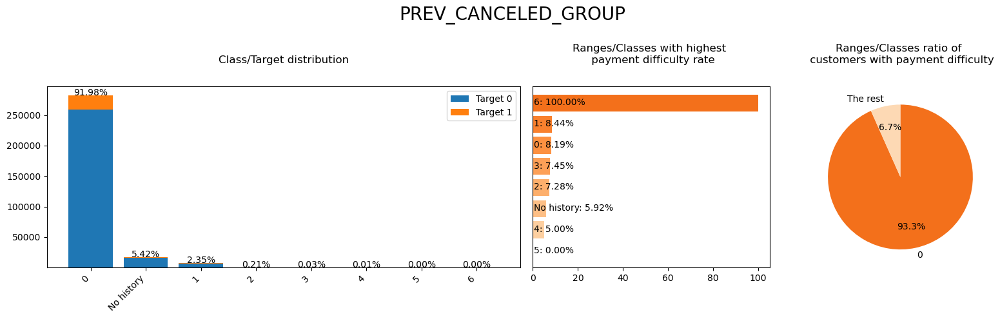

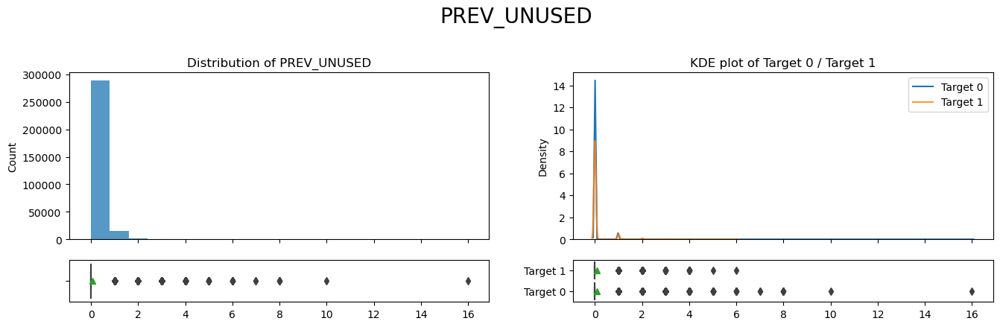

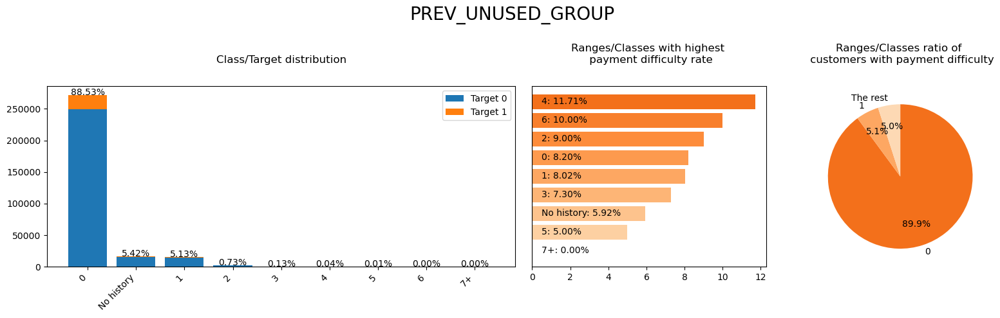

In [164]:
eda_histbox_summary(df, 'PREV_CANCELED', kde=False)
eda_unicat('PREV_CANCELED_GROUP')
eda_histbox_summary(df, 'PREV_UNUSED', kde=False)
eda_unicat('PREV_UNUSED_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Nothing conclusive here, since we have very few applicants with previous canceled/unused loan.
</div>   



#### TOTAL_PREV_APPLICATION

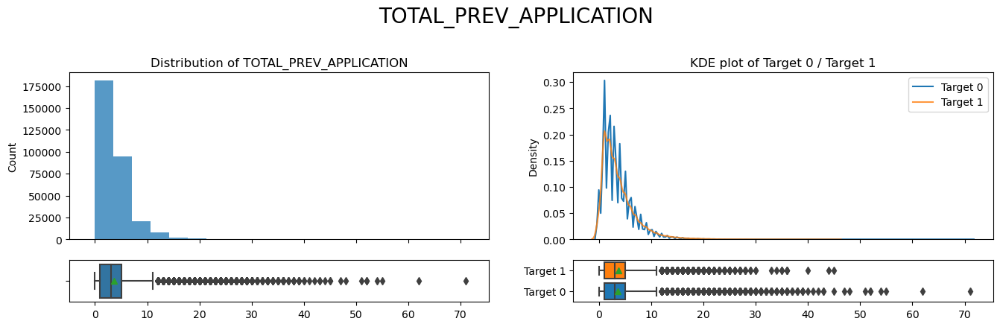

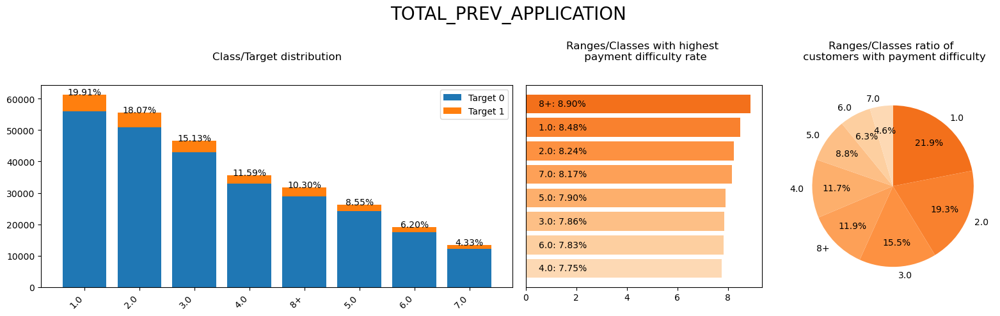

In [165]:
eda_histbox_summary(df, 'TOTAL_PREV_APPLICATION', kde=False)
eda_unicat(df.TOTAL_PREV_APPLICATION[df.TOTAL_PREV_APPLICATION>0].apply(lambda x: str(x) if x<8 else '8+'))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Nothing conclusive here if we just look at the total of previous application, although we can observe that people with too few applications (1 and 2) or too many (7, 8+) have higher chance of payment difficulty than those in the middle range.
- The number of previous approved or refused application are more decisive metrics than just the total number of application.
</div>   



#### TOTAL/AVERAGE CREDIT_APPLIED

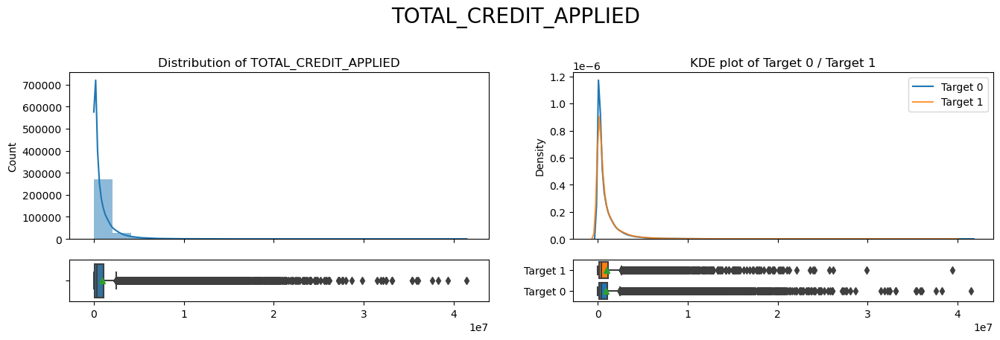

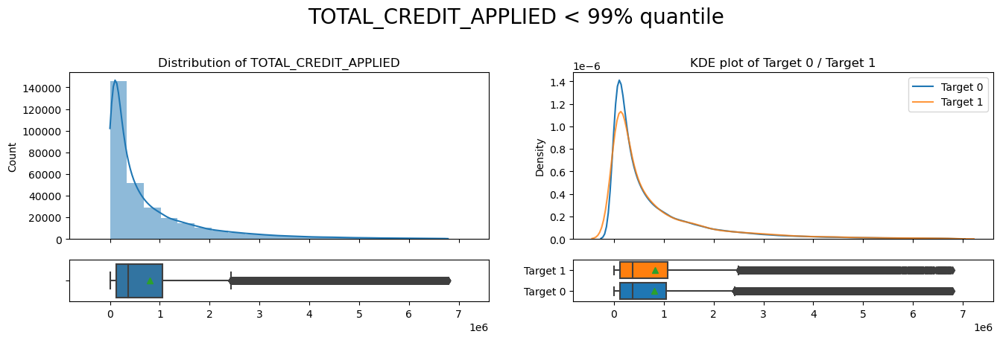

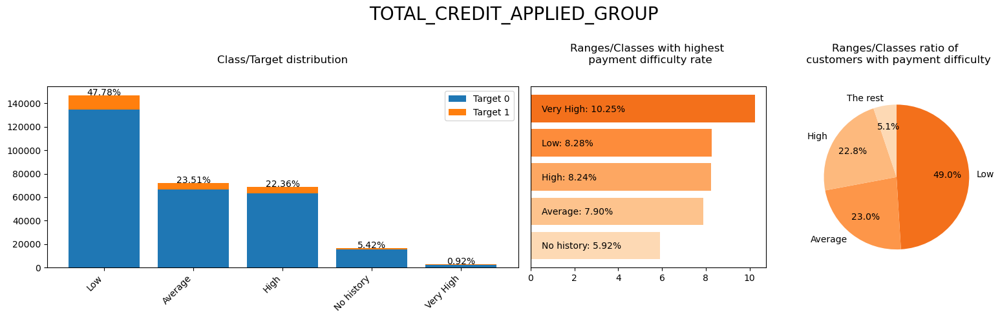

In [166]:
eda_histbox_summary(df, 'TOTAL_CREDIT_APPLIED')
eda_histbox_summary(TOTAL_CREDIT_APPLIED_Q99, 'TOTAL_CREDIT_APPLIED', plot_title = 'TOTAL_CREDIT_APPLIED < 99% quantile')
eda_unicat('TOTAL_CREDIT_APPLIED_GROUP')

In [167]:
df.AVERAGE_CREDIT_APPLIED.quantile([.25,.5,.75])

0.25     66911.464286
0.50    128583.000000
0.75    254407.875000
Name: AVERAGE_CREDIT_APPLIED, dtype: float64

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- The distribution of total credit applied by an applicant is very right skewed and has many extreme outliers.
- 75% of customers have applied for less than 254,407 per person, while there are some customers who have applied for more than 10 millions.
- The Very High range has the highest payment difficulty rate of 10.25%.
</div>   



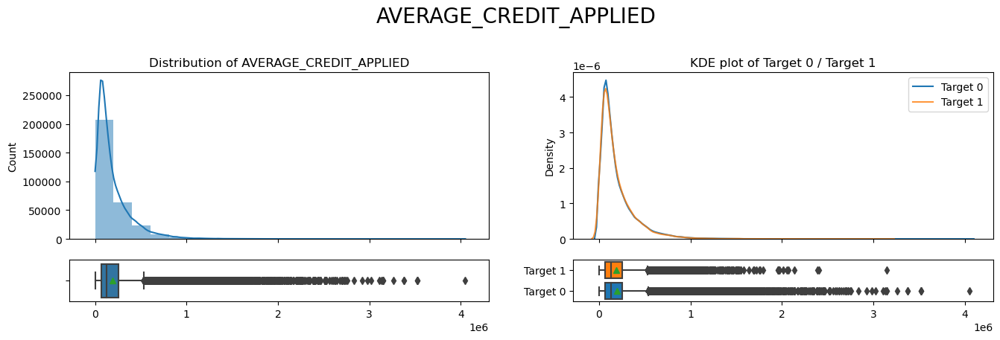

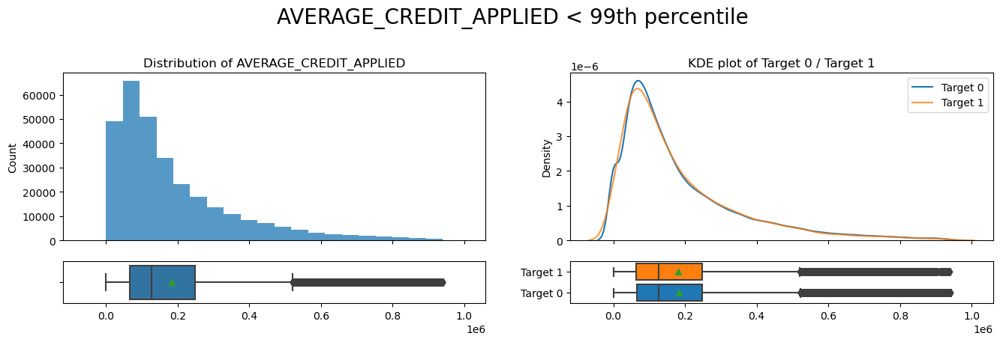

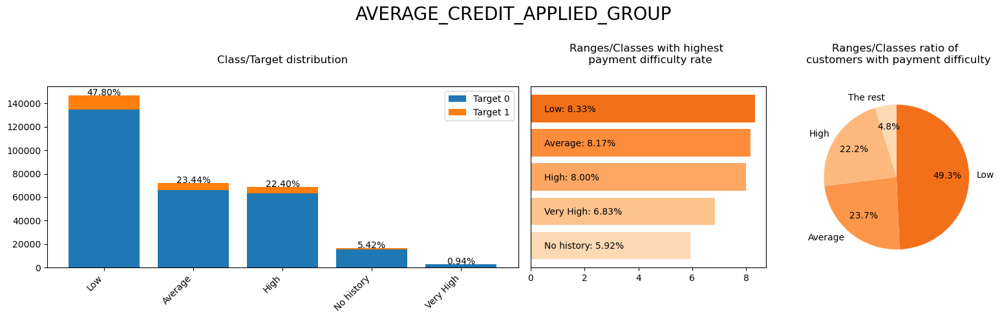

In [168]:
eda_histbox_summary(df, 'AVERAGE_CREDIT_APPLIED')
eda_histbox_summary(AVERAGE_CREDIT_APPLIED_Q99, 'AVERAGE_CREDIT_APPLIED', kde=False,
                   plot_title = 'AVERAGE_CREDIT_APPLIED < 99th percentile')
eda_unicat('AVERAGE_CREDIT_APPLIED_GROUP')

In [169]:
df.AVERAGE_CREDIT_APPLIED.mean()

194025.0699113147

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**
- Different from TOTAL_CREDIT_APPLIED (which is the sum of credit amount from ALL previous application), AVERAGE_CREDIT_APPLIED is the average amount per application by the same customer. 
- In other words, AVERAGE_CREDIT_APPLIED = TOTAL_CREDIT_APPLIED/TOTAL_PREV_APPLICATION.
- AVERAGE_CREDIT_APPLIED is also very right skewed and has many extreme outliers.
- On average, each customer applied for an amount of 194025 per application.
- Customers who tend to apply for low amount per contract are at highest risk of payment difficulty, while customer with the highest amount credit per contract has the lowest risk
    
</div>   


#### TOTAL/AVERAGE CREDIT_APPROVED

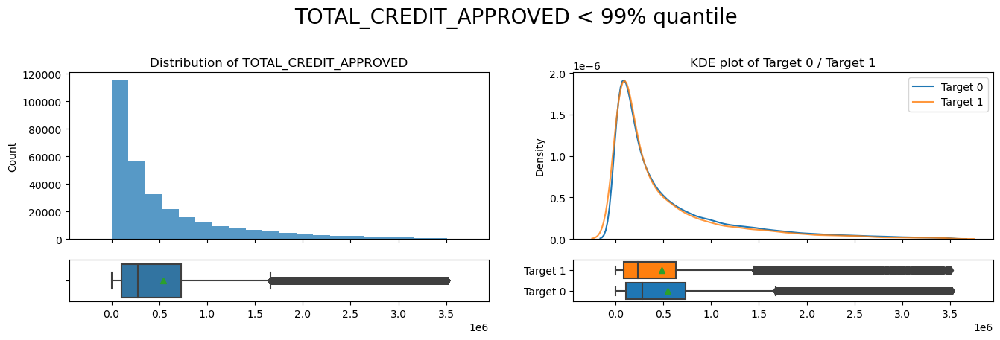

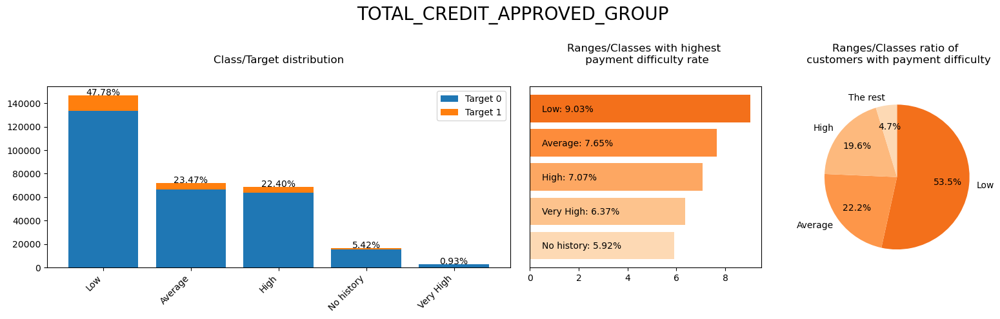

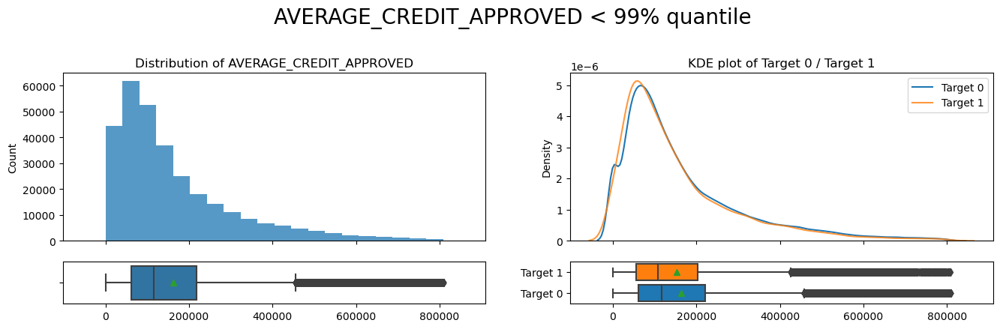

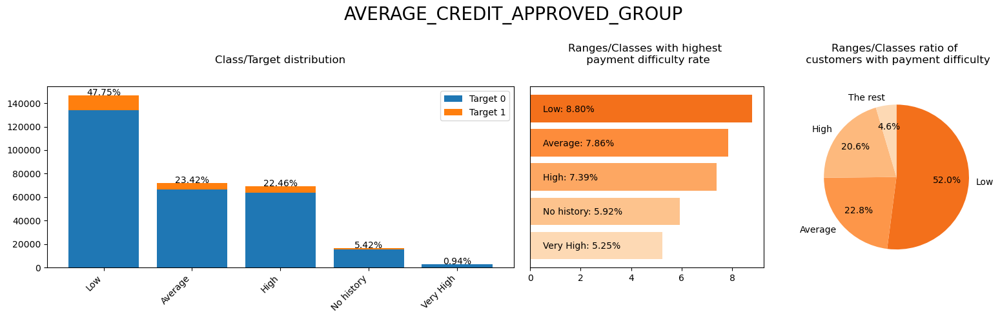

In [170]:
eda_histbox_summary(TOTAL_CREDIT_APPROVED_Q99, 'TOTAL_CREDIT_APPROVED', kde=False,
                   plot_title = 'TOTAL_CREDIT_APPROVED < 99% quantile')
eda_unicat('TOTAL_CREDIT_APPROVED_GROUP')

eda_histbox_summary(AVERAGE_CREDIT_APPROVED_Q99, 'AVERAGE_CREDIT_APPROVED', kde=False,
                   plot_title = 'AVERAGE_CREDIT_APPROVED < 99% quantile')
eda_unicat('AVERAGE_CREDIT_APPROVED_GROUP')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Different from previous TOTAL/AVERAGE CREDIT_**APPLIED**, TOTAL/AVERAGE CREDIT_**APPROVED** are the sum amount of credit actually approved by the bank.
- The people with low total approved amount and low approved amount per application has the highest PD rate, while the ones with very high approved amount/average approve amount per application has lowest chance of PD.
- They seem to be better indicators for detecting clients with payment difficulty, as it reflects past evaluation from the banks.
</div>   



### Social circle

**What is OBS/DEF_30/60_COUNT_SOCIAL_CIRCLE?** 
- How the bank observes the customers' social surrounding was not explained. Obviously the bank doesn't have private investigators follow every applicant and logs who they came into contact with.
- Most plausible explanation is that this is the number of transaction of their bank account to/from accounts associated with default.

#### OBS_30_COUNT_SOCIAL_CIRCLE

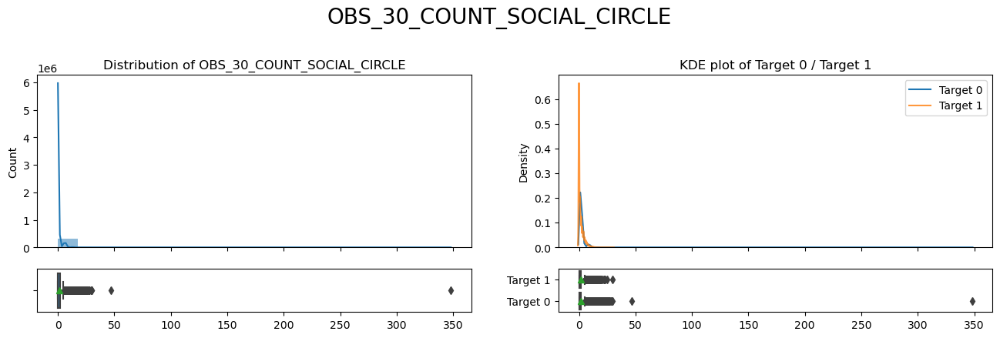

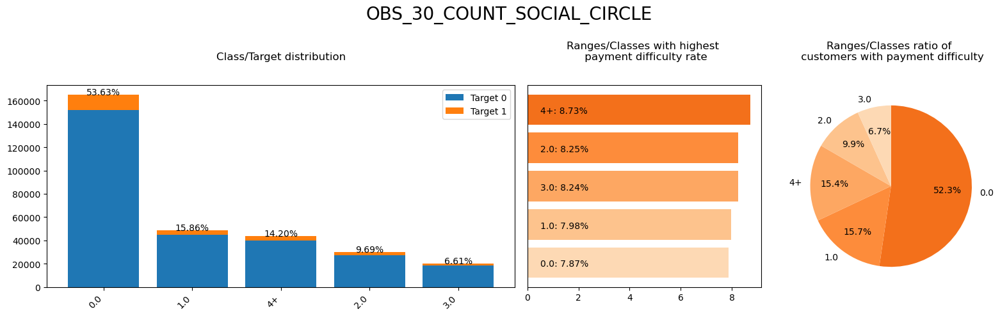

In [171]:
eda_histbox_summary(df,'OBS_30_COUNT_SOCIAL_CIRCLE')
eda_unicat(df.OBS_30_COUNT_SOCIAL_CIRCLE.apply(lambda x: str(x) if x<4 else '4+'))

#### DEF_30_COUNT_SOCIAL_CIRCLE

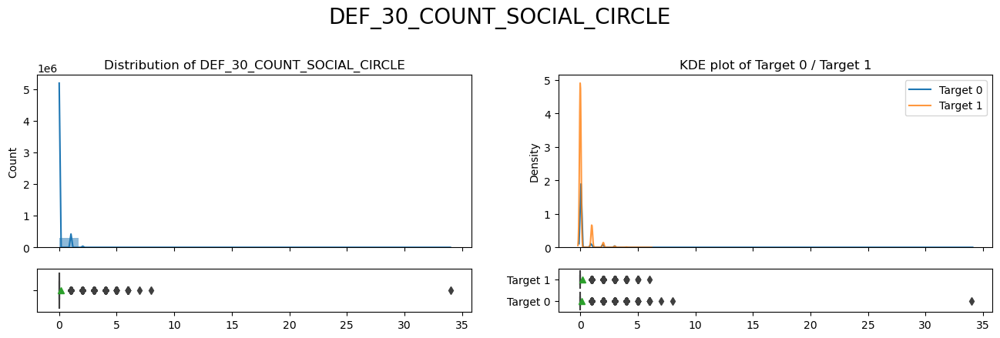

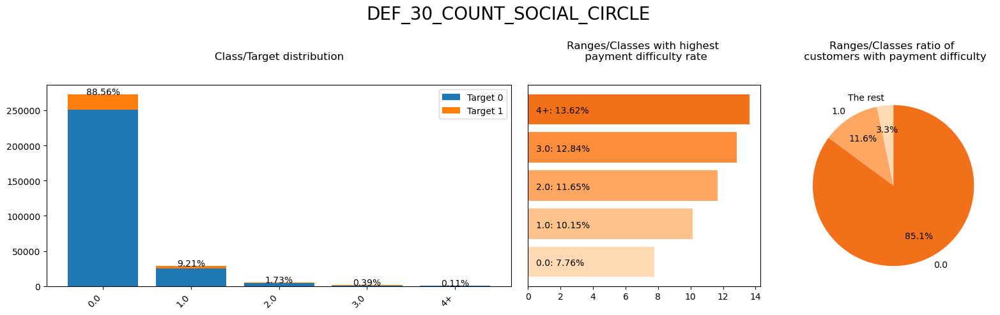

In [172]:
eda_histbox_summary(df,'DEF_30_COUNT_SOCIAL_CIRCLE')
eda_unicat(df.DEF_30_COUNT_SOCIAL_CIRCLE.apply(lambda x: str(x) if x<4 else '4+'))

#### OBS_60_COUNT_SOCIAL_CIRCLE

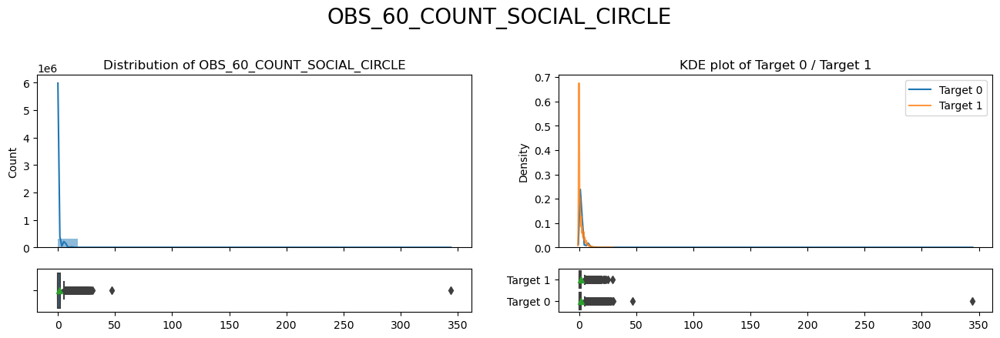

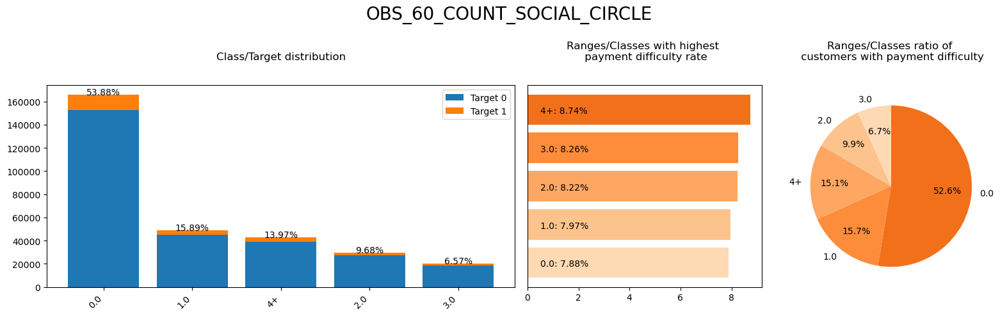

In [173]:
eda_histbox_summary(df,'OBS_60_COUNT_SOCIAL_CIRCLE')
eda_unicat(df.OBS_60_COUNT_SOCIAL_CIRCLE.apply(lambda x: str(x) if x<4 else '4+'))

#### DEF_60_COUNT_SOCIAL_CIRCLE

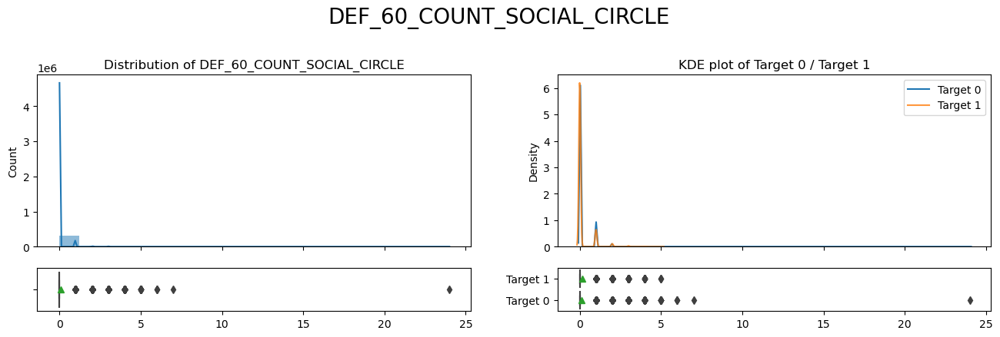

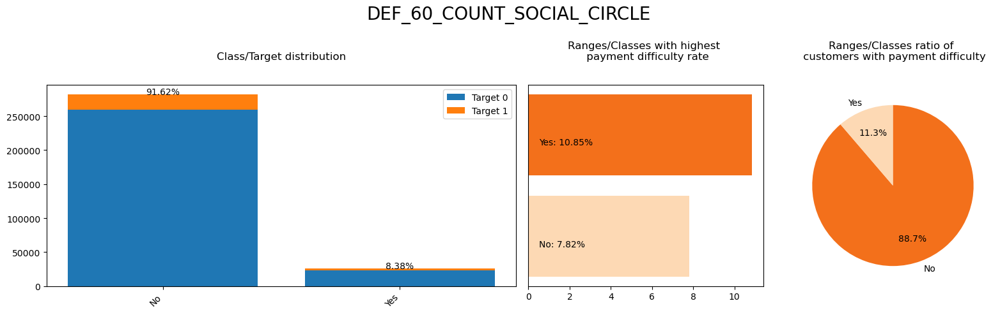

In [174]:
eda_histbox_summary(df,'DEF_60_COUNT_SOCIAL_CIRCLE')
eda_unicat(df.DEF_60_COUNT_SOCIAL_CIRCLE.apply(lambda x: 'Yes' if x>0 else 'No'))

In [175]:
# observe the outlier OBS_60_COUNT_SOCIAL_CIRCLE
df[df.OBS_60_COUNT_SOCIAL_CIRCLE>300][['TARGET','CONTRACT_TYPE','AMOUNT_CREDIT_GROUP','DOC_TYPE','AGE_GROUP','EDUCATION','MARITAL_STATUS','INCOME_TYPE','YEARS_EMPLOYED_GROUP','ORGANIZATION_TYPE','OBS_60_COUNT_SOCIAL_CIRCLE','DEF_60_COUNT_SOCIAL_CIRCLE']]

,TARGET,CONTRACT_TYPE,AMOUNT_CREDIT_GROUP,DOC_TYPE,AGE_GROUP,EDUCATION,MARITAL_STATUS,INCOME_TYPE,YEARS_EMPLOYED_GROUP,ORGANIZATION_TYPE,OBS_60_COUNT_SOCIAL_CIRCLE,DEF_60_COUNT_SOCIAL_CIRCLE
148403,0,Revolving loans,Low,NO_DOC,Under 30,Higher education,Single,State servant,6-10 years,Police,344.0,24.0


 - The outlier in OBS_60_COUNT_SOCIAL_CIRCLE works in Police force. It could be that this line of work tend to involve people who defaulted, as we explored in previous section.

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- We can see that those who are associated with more people with PD/default has higher risk of payment difficulty.
- More spefically, people associated with at least 1 observed defaulter or at least 2 observed PD will have higher payment difficulty risk than average.
</div>   



## 5.3 Categorical features

### Family-related features

#### 'MARITAL_STATUS', 'COUNT_CHILDREN', 'COUNT_FAM_MEMBERS', 'SUITE_TYPE',

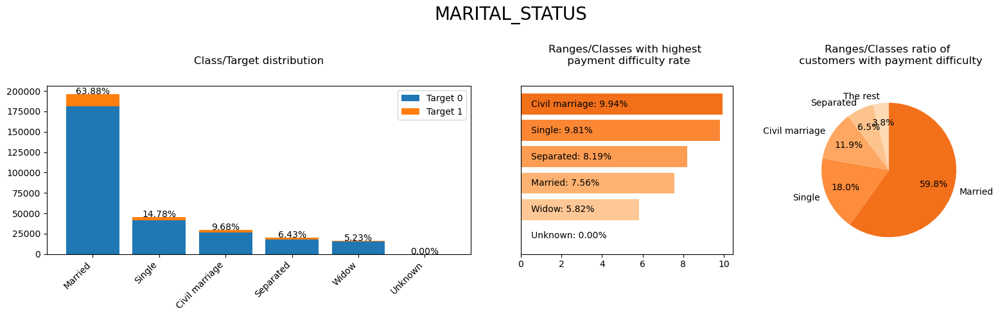

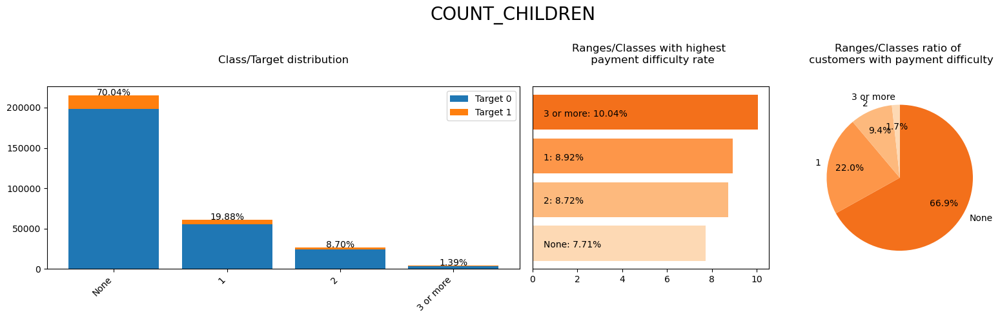

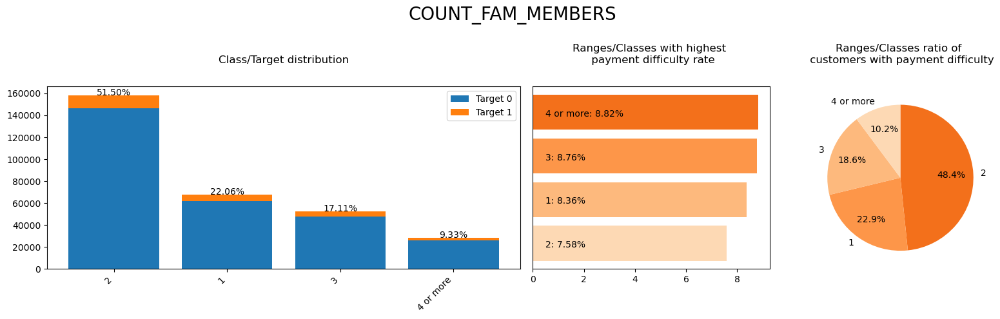

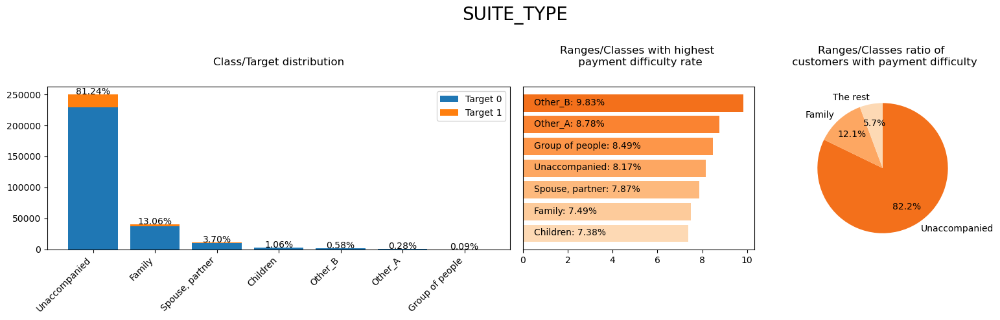

In [176]:
for feature in ['MARITAL_STATUS', 'COUNT_CHILDREN','COUNT_FAM_MEMBERS','SUITE_TYPE']:
    eda_unicat(feature)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Civil marriage and Single customers have the highest rate of payment difficulty and significantly higher than average rate 8.07%, while Married and Widow have the lowest rate. 
- People with at least 1 child have higher PD rate than average, and the risk increases if they have 3 children or more. People without kid has the lowest chance of payment difficulty.
- Customer with 2 family members (including themselves, presumed mostly are married couples) has the lowest chance of payment difficulty, while 1 (presumed to be mostly single) and 3 or more (have many children). This confirms what we knew about marital status and children count. 
</div>   



### Profession-related features

#### INCOME_TYPE

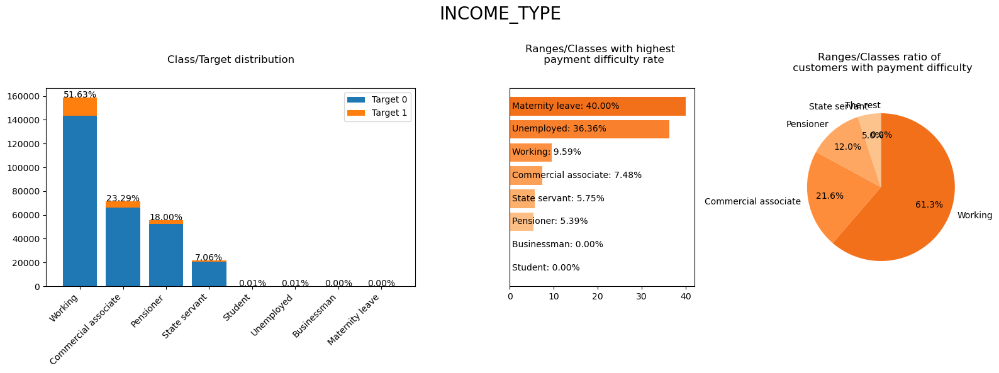

In [177]:
eda_unicat('INCOME_TYPE', figsize=(16,6))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- There are 4 main classes: **Working (more than 50%)**, **Commercial associate (23%)**, **Pensioner(18%)** and **State servant(7%)**. Student, Unemployed, Businessman and Maternity leave have too few observations.
- **Unemployed and Maternity**: highest rate of payment difficulty.
- **Working**: 3rd highest  rate of payment difficulty
- **Pensioner** and **State servant**: significantly lower chance of PD than average.
    
</div>   



#### OCCUPATION_TYPE

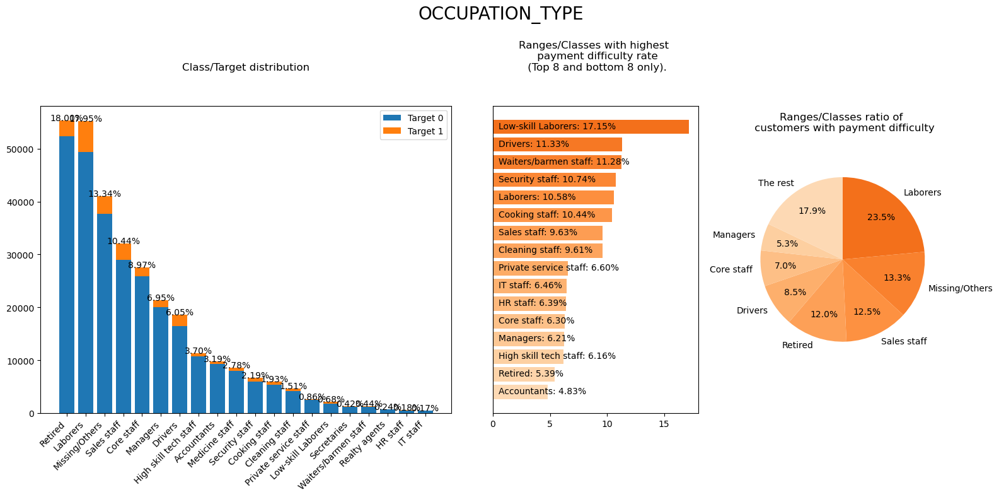

In [178]:
eda_unicat('OCCUPATION_TYPE', figsize=(16,8), limit=8)

#### ORGANIZATION_TYPE

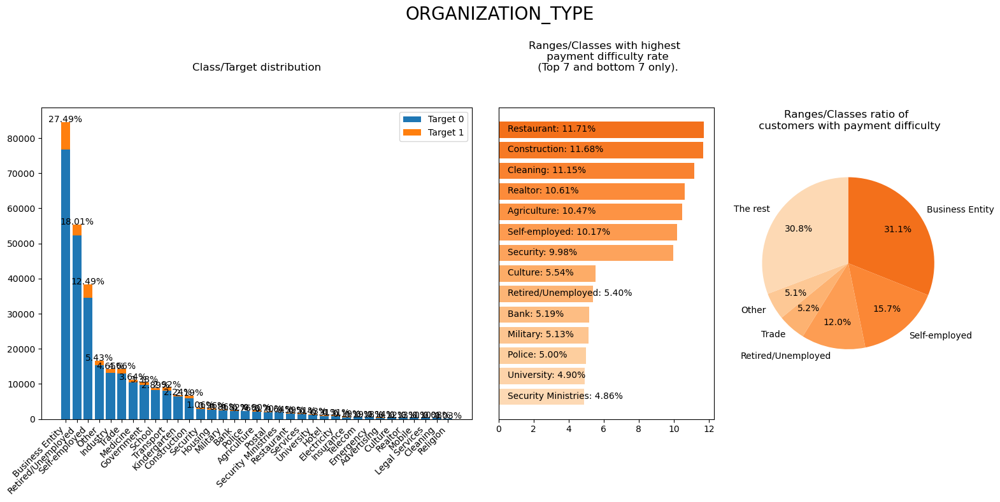

In [179]:
eda_unicat('ORGANIZATION_TYPE', figsize=(16,8), limit=7)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Low skill labor, driver, waiter, security staff, cleaning staff (ie blue collar, heavy labor jobs) has the highest PD rate
- Accountant/high skill tech, manager,... have lowest rate.

- Similarly, ORGANIZATION_TYPE related blue_collar, manual labor work (eg Restaurant, Construction, Cleaning, Agriculture,...) also has higher PD rate than average, while Banking, Police, University, Security Ministries has the lowest PD rate. 
</div>   



### Contract-related features

#### CONTRACT_TYPE

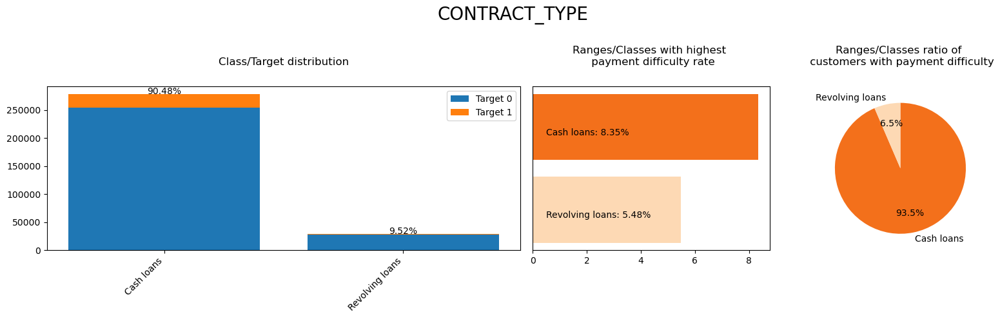

In [180]:
eda_unicat('CONTRACT_TYPE')

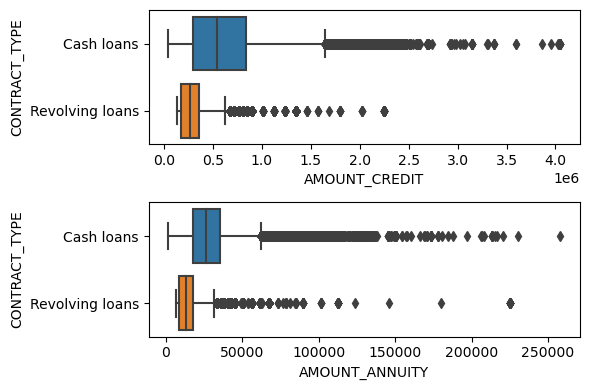

In [181]:
# Compare AMOUNT_CREDIT and AMOUNT_ANNUITY of 2 contract types
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(6,4))
sns.boxplot(data=df, x='AMOUNT_CREDIT', y='CONTRACT_TYPE', ax=ax1)
sns.boxplot(data=df, x='AMOUNT_ANNUITY', y='CONTRACT_TYPE',ax=ax2)
plt.tight_layout()

In [182]:
df.CONTRACT_TYPE.value_counts(normalize=True)

Cash loans         0.904787
Revolving loans    0.095213
Name: CONTRACT_TYPE, dtype: float64

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Cash loan customers has higher chance of payment difficulty than Revolving loan, which makes sense as Cash loan tends to have much higher annuity amount.
- About 90% of contracts are Cash loan and 10% are Revolving loan.
</div>   



#### 'MISSING_BUILDING_INFO'

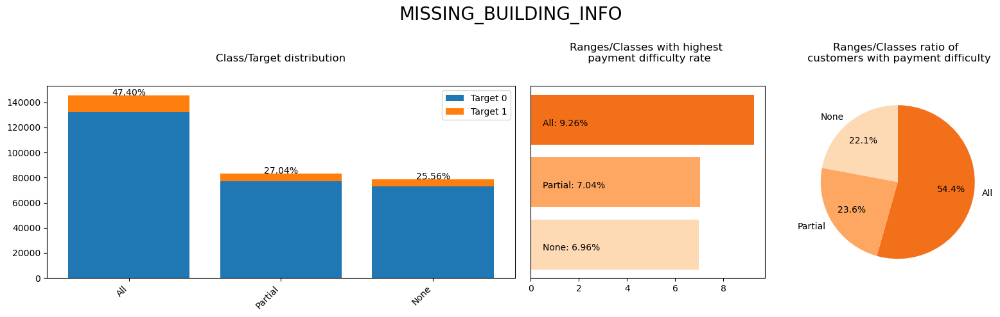

In [183]:
eda_unicat('MISSING_BUILDING_INFO')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Nearly half of the customers doesn't have any of building info. These are also the ones with highest PD rate.
- About 1/4 missing partial info and 1/4 have all available info. These have lower PD rate than average.

</div>   



#### DOC_TYPE

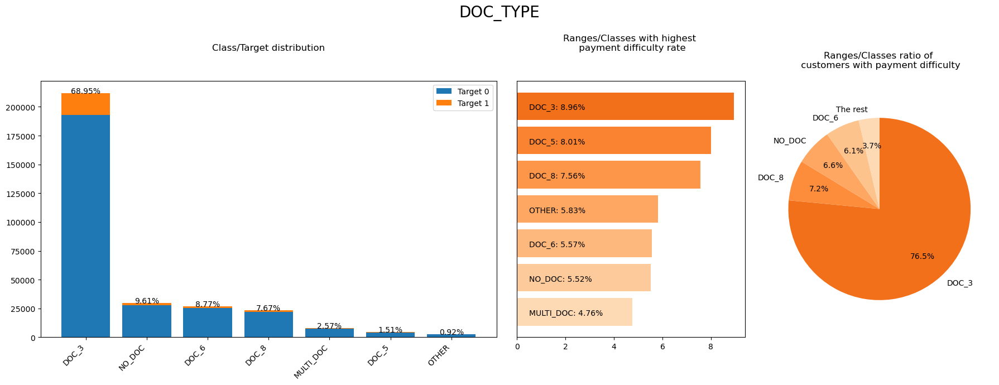

In [184]:
eda_unicat('DOC_TYPE', figsize=(18,7))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- About 2/3 of applicants applied with DOC_3, which also has the highest rate of payment difficulty.
- Customers with any other document type have lower payment difficulty rate than average.   
- It is unclear here which document is what. The bank might need to review the required documents for application. For example could it be that DOC_3 is the easiest to apply/obtain thus allow people with higher PD rate exploit this?
    
</div>   



### Personal info features
**'GENDER', 'EDUCATION', 'HOUSING_TYPE', 'OWN_REALTY'**

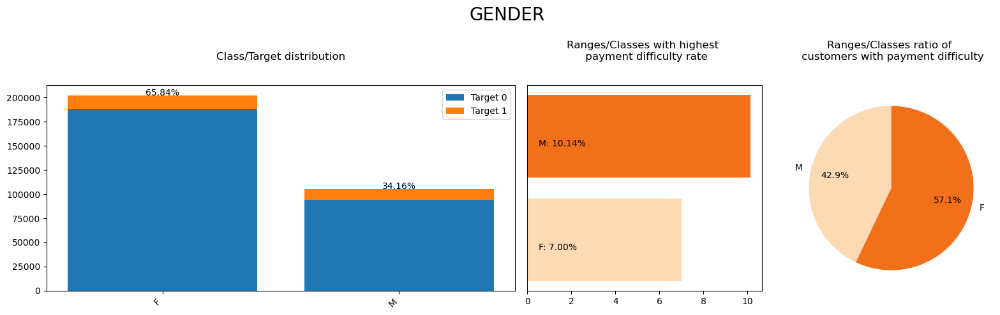

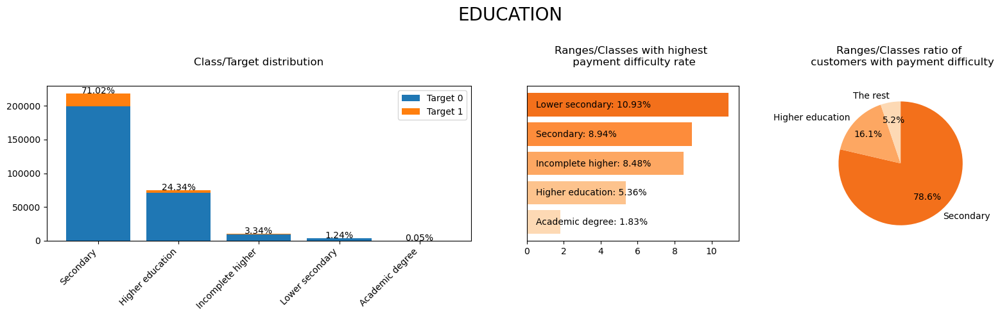

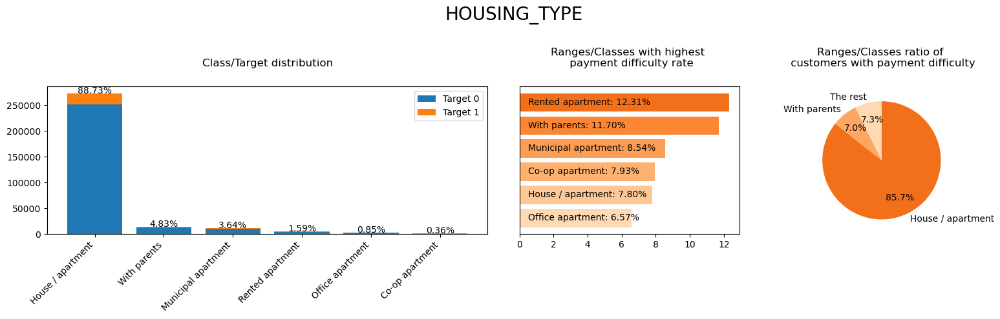

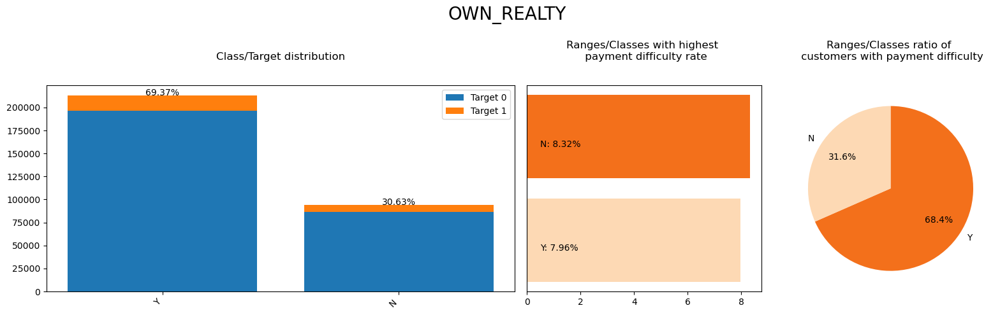

In [185]:
for feature in ['GENDER', 'EDUCATION', 'HOUSING_TYPE', 'OWN_REALTY']:
    eda_unicat(feature)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Male has significantly higher chance of payment difficulty than Female. More than 2/3 of applicants are female.
- Lower secondary and Secondary customer has the highest PD rate, while higher education and academic degree customer has the lowest risk. This makes sense, as having higher education means higher income and better job oppotunities. More than 70% of customers are Secondary/Lower Secondary, 27% are Higher/Incomplete higher and only a tiny fraction has an academic degree.

- People who live with parents or rent has the highest PD rate, while the risk of people live in house/apartment, municipal or co-op are significantly lower. Nearly 90% are House/Apartment.

- People who own realty has slightly less PD risk than average while those who do not has slightly higher. About 70% customers own realty.
    
</div>   



### Location-related features

#### 'REGION_MISMATCH','REG_WORK_LIVE_CITY', 'CITY_COUNT'

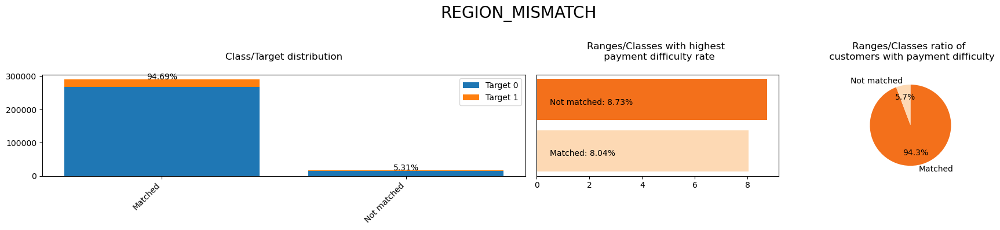

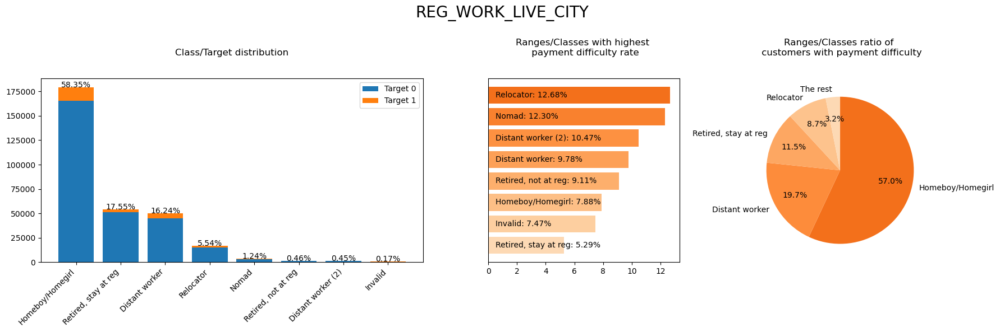

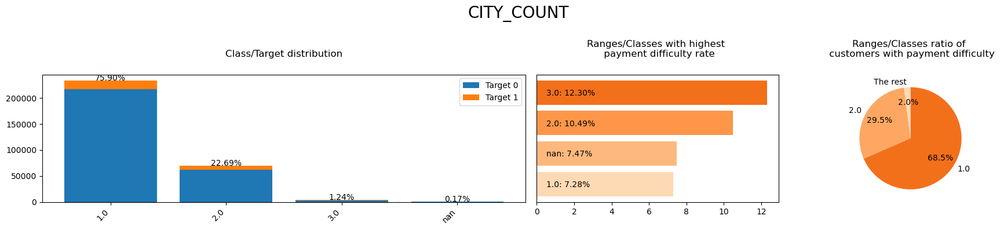

In [186]:
# Region permanent/live/work mismatch
eda_unicat('REGION_MISMATCH', figsize=(18,4))

# City permanent/work/live mismatch
eda_unicat('REG_WORK_LIVE_CITY', figsize=(18,6))
eda_unicat(df['CITY_COUNT'].astype(str), figsize=(18,4))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

Region mismatch: people who have 1 region mismatch has higher PD rate than average and than those who do not.

City mismatch: 
- We can observe that those who don't live at their registered city and/or associated with 2 cities make the top 5 highest PD rate:
>- **Relocator** (live and work in a different city than their registered city): **12.68%**
>- **Nomad** (live and work in separate city, both of which are different than their registered city): **12.3%**
>- **Distant worker (2)** (work in the same city as registered address but live in a different city): **10.47%**
>- **Distant worker** (live at reg but go to work in a different city): **9.78%**
>- **Retired, not at reg**: **9.11%**
- Meanwhile, those who associated with only 1 city has the lowest PD rate: 
>- **Homeboy/Homegirl**
>- **Retired, at reg**
- Living in a different city than registered address most likely means having to pay for rent, which can take up a large portion of monthly salary. Not to mention the cost associated with moving, commuting, etc...


</div>   



#### REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY

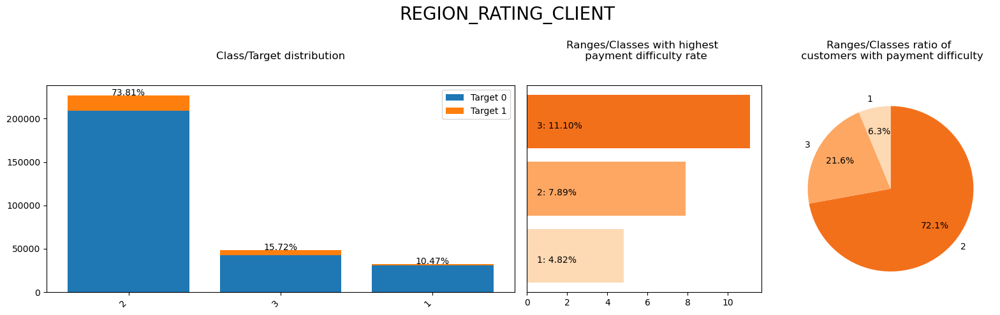

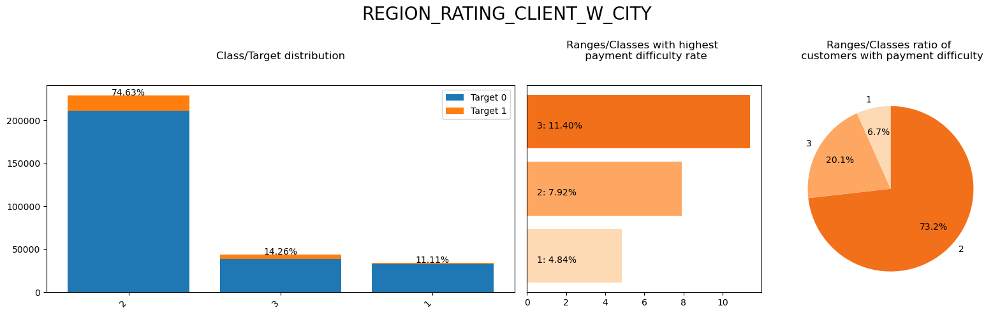

In [187]:
# Region rating and city rating
eda_unicat(df['REGION_RATING_CLIENT'].astype(str))
eda_unicat(df['REGION_RATING_CLIENT_W_CITY'].astype(str))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- The region rating and city rating seems to correlate to payment difficulty rate, with 3 being highest risk and 1 being lowest. 
- Customers with rating of 3 have higher PD rate than average rate.
</div>   



### Misc info
**'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START'**

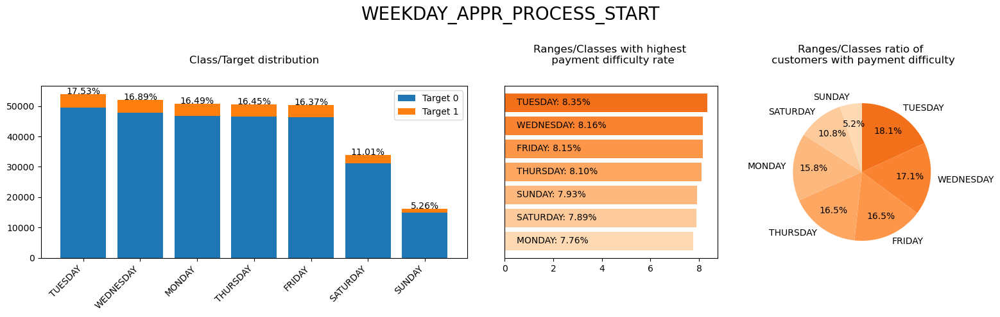

In [188]:
eda_unicat('WEEKDAY_APPR_PROCESS_START')

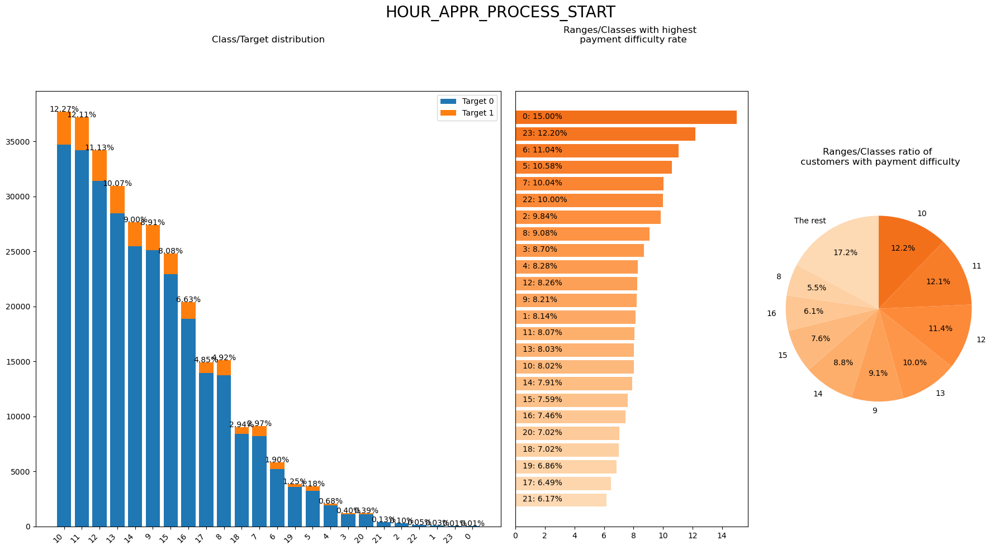

In [189]:
eda_unicat(df['HOUR_APPR_PROCESS_START'].astype(str), figsize=(18,10), limit=12)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- These 2 features seems to be random and have no correlation to payment difficulty rate.

</div>   



## 5.4 Summary of univariate analysis

#### Most important features

Numerical features that shows a clear relationship with payment difficulty rate:
1. **AGE**: younger age has higher PD rate and vice versa.
2. **YEARS_EMPLOYED**: low years of employment has higher PD
3. **AMOUNT_INCOME_TOTAL**: Low/average range has higher rate than high/very high range
4. **PREV_APPROVED**: More previous approved loan means lower PD rate. The lowest is no history.
5. **PREV_REFUSED**: Less previous refused loan means lower PD rate. The lowest is no history.
6. **TOTAL/AVERAGE_CREDIT_APPLIED**: Low total approved credit and low average approved credit per loan has higher rate.
7. **AMOUNT_CREDIT**: clients with low/average credit has higher PD rate than those in high/very high range.
8. **AMOUNT_ANNUITY**: average and high annuity has higher rate than either low or very high range.
9. **AMOUNT_REQ_CB_YEAR**: More requests in the year prior to the loan application have significantly higher payment difficulty rate than those with fewer request.
10. **CAR_AGE**: Client who owns new car (car age less than 5 years) has lower PD rate than those with old car (10+ years) or no car.

#### Insights and notable categorical features:

* **OCCUPATION_TYPE**: Heavy labor jobs has the highest PD rate while accountant, manager,high skill tech, ... have lowest rate.
* **ORGANIZATION_TYPE**:  organization type relating to blue-collar, manual labor work (eg Restaurant, Construction, Cleaning, Agriculture,...) also has higher PD rate than average, while Banking, Police, Universitym Security Ministries has the lowest PD rate.
* **EDUCATION**: the level of education also correlate to payment difficulty rate. Lower levels tends to have higher rate and vice versa.
* **CONTRACT_TYPE**: Cash loan has significantly higher PD rate than Revolving loan 
* **COUNT_CHILDREN**: People who have children has higher PD rate than those who do not, and the rate increase with the number of children
* **COUNT_FAMILY_MEMBER/MARITAL_STATUS**: Single and people with big family have higher PD rate than married couples.
* **HOUSING_TYPE**: People who live with parents or rent has significantly highest PD rate than those live in other housing type. 
* **GENDER**: Male has significantly higher chance of payment difficulty than Female.
* **REG_WORK_LIVE_CITY/CITY_COUNT**: People associated with 2 cities or more have significantly higher PD rate than those who live and work in the same city as their registered city.



***
# 6. Multivariate analysis

## Functions for multivariate analysis

### Custom order for segmented variables / ordinal categorical variables

In [190]:
AMOUNT_order = ['Low', 'Average','High','Very High']
CAR_AGE_order = ['No car','New (<5y)','Used (5-15y)','Old (15-30y)','30+y']
COUNT_CHILDREN_order = ['None','1','2','3 or more']
COUNT_FAM_MEMBERS_order = ['1','2','3', '4 or more']
AGE_order = ['Under 30','31 to 40','41 to 50','51 to 60','61+']
YEARS_EMPLOYED_order = ['<2 years', '2-5 years', '6-10 years', '10+ years','Retired/Unemployed']
PREV_AMOUNT_order = ['No history','Low', 'Average', 'High','Very High']
PREV_order = ['No history', '0', '1', '2', '3', '4', '5', '6', '7+']
EDUCATION_order = ['Lower secondary', 'Secondary', 'Incomplete higher', 'Higher education', 'Academic degree']
REG_WORK_LIVE_CITY_order = ['Homeboy/Homegirl', 'Retired, stay at reg', 'Distant worker', 'Distant worker (2)', 'Relocator', 'Retired, not at reg', 'Nomad', 'Invalid']

### Functions

In [191]:
def eda_scatterbubble(data, scat_y, scat_x, group_y, group_x, order_y = [], order_x = [], 
                      size_adjust = 3e4, figsize = (15,6), plot_title = ''):
    '''
    Return scatterplot and bubble plot of 2 numerical variable
    ---
    Parameters:
    data: dataframe for scatterplot,  
    
    scat_y, scat_x: string like, y axis and x axis variable
    
    group_y, group_x: string like, grouped variable names for y/x axis
    
    order_y, order_x: list like (optional), custom order for axis. bottom-top for y and left-right for x
    
    size_adjust: int/flt (optional), adjust size scale for bubble plot. This is multiplied with each group count
                Try between 1e4 - 10e4. Default 3e4
    
    figsize: tuple (width, height). Optional. Default (15,6)
    plot_title: (optional)
    
    '''
    # data
    df_group = df.groupby([group_y,group_x])
    df_plot = pd.DataFrame({
        'COUNT' : df_group.count()['TARGET'],
        'RATE' : df_group.mean(numeric_only = True)['TARGET']
    })
    if len(order_y)==0:
        order_y = df[group_y].unique()
    if len(order_x)==0:
        order_x = df[group_x].unique()
    
    df_plot = df_plot.loc[(order_y[::-1],order_x) ,:]
    df_plot = df_plot.reset_index()
    cmap = plt.get_cmap('Oranges')

    # plot
    fig, [ax_scat,ax_bub] = plt.subplots(ncols=2, figsize = figsize)
    plt.suptitle(plot_title if len(plot_title)>0 else f'{scat_y} x {scat_x}', size = 20, y=1.05)
    
    # scatter plot
    # sns.scatterplot(data = data[data.TARGET == 1], x = scat_x, y = scat_y, ax = ax_scat, s=2, alpha=0.3, color = default_orange, label='Target 1')
    # sns.scatterplot(data = data[data.TARGET == 0], x = scat_x, y = scat_y, ax = ax_scat, s=1, alpha=0.1, color = default_blue, label='Target 0')
    sns.scatterplot(data = data, x = scat_x, y = scat_y, ax = ax_scat, s=5, alpha=0.1, hue='TARGET')
    ax_scat.spines["top"].set_visible(False)
    ax_scat.spines["right"].set_visible(False)
    ax_scat.legend(loc='best')
    
    # Bubble plot
    sns.scatterplot(data=df_plot, x=group_x, y=group_y,
                    s = size_adjust*df_plot['COUNT']/len(df),
                    hue= df_plot.RATE.fillna(0).values,
                    palette = cmap, marker='o', ax = ax_bub)
    # bubble plot appearance
    ax_bub.set_xticks(order_x)
    ax_bub.set_xticklabels(order_x, rotation=45,ha="right")
    ax_bub.set_ylim(len(df_plot[group_y].unique())-0.5,-0.5)
    ax_bub.set_xlim(-0.5, len(df_plot[group_x].unique())-0.5)
    ax_bub.spines['top'].set_visible(False)
    ax_bub.spines['right'].set_visible(False)
    ax_bub.spines['bottom'].set_visible(False)
    ax_bub.spines['left'].set_visible(False)
    # print target 1 percentage
    for index in df_plot[df_plot.RATE.notna()].index:
        rate = df_plot.RATE.iloc[index]
        size = df_plot.COUNT.iloc[index]
        x_cord = df_plot[group_x].iloc[index]
        y_cord = df_plot[group_y].iloc[index]
        ax_bub.annotate(f'{rate*100:.2f}%', xy=(x_cord, y_cord), ha='center', va='center', size=8, color='w',weight = 'bold')
    # background grid
    for y_line in np.arange(0, len(df_plot[group_x].unique()) + 1):
        ax_bub.axhline(y_line, color = 'black', alpha = 0.1, zorder=-1, linewidth=0.75)
    for x_line in np.arange(0, len(df_plot[group_y].unique()) + 1):
        ax_bub.axvline(x_line, color = 'black', alpha = 0.1, zorder=-1, linewidth=0.75)
    
    # legend
    size1 = Line2D(range(1), range(1), color="white", marker='o', markersize=6, markerfacecolor="#fee5cb")
    size2 = Line2D(range(1), range(1), color="white", marker='o', markersize=8, markerfacecolor="#fee5cb")
    size3 = Line2D(range(1), range(1), color="white", marker='o', markersize=12, markerfacecolor="#fee5cb")
    circle_color = Line2D(range(1), range(1), color="white", marker='o', markersize=12, fillstyle = 'left', markerfacecolor="#fd9243", markerfacecoloralt='#fdc088')
    circle_empty = Line2D(range(1), range(1), color="white", marker='.', markersize=0)
    legend = ax_bub.legend(
        [size1, size2, size3, circle_empty,circle_color, circle_empty],
        ['', 'Size of circle: Segment size', '','', 'Color: Payment difficulty rate','(darker is higher)'],
        loc = 'upper center',
        ncol = 2,
        bbox_to_anchor=[0.5, 1.1],
        fontsize=8
    )

In [192]:
def eda_boxbubble(data, box_y, box_x, group_y, group_x, order_y = [], order_x = [], 
                  size_adjust = 3e4, figsize = (15,6), sharey=False,
                  plot_title = ''):
    '''
    Return boxplot and bubble plot of 1 categorical feature x 1 numeric feature
    ---
    Parameters:
    data: dataframe for scatterplot,  
    
    box_y, box_x: string like, y axis and x axis variable
                box_y should be categorical, box_x is numerical
    
    group_y, group_x: string like, grouped variable names for y/x axis
    
    order_y, order_x: list like (optional), custom order for axis. bottom-top for y and left-right for x
    
    size_adjust: int/flt (optional), adjust size scale for bubble plot. This is multiplied with each group count
                Try between 1e4 - 10e4. Default 3e4
    
    figsize: tuple (width, height). Optional. Default (15,6)
    plot_title: (optional)
    
    '''
    # data
    df_group = df.groupby([group_y,group_x])
    df_plot = pd.DataFrame({
        'COUNT' : df_group.count()['TARGET'],
        'RATE' : df_group.mean(numeric_only = True)['TARGET']
    })
    if len(order_y)==0:
        order_y = df[group_y].unique()
    if len(order_x)==0:
        order_x = df[group_x].unique()
    
    df_plot = df_plot.loc[(order_y[::-1],order_x) ,:]
    df_plot = df_plot.reset_index()
    cmap = plt.get_cmap('Oranges')

    # plot
    
    fig, [ax_box,ax_bub] = plt.subplots(ncols=2, figsize = figsize, sharey=sharey)
    plt.suptitle(plot_title if len(plot_title)>0 else f'{box_y} x {box_x}', size = 20, y=1.05)
    
    # box plot
    box_order = order_x if data[box_x].dtype == 'object' else order_y
    sns.boxplot(data = data, x = box_x, y = box_y, ax = ax_box, order = box_order[::-1])
    ax_box.spines["top"].set_visible(False)
    ax_box.spines["right"].set_visible(False)
    # ax_box.legend(loc='best')
    
    # Bubble plot
    sns.scatterplot(data=df_plot, x=group_x, y=group_y,
                    s = size_adjust*df_plot['COUNT']/len(df),
                    hue= df_plot.RATE.fillna(0).values,
                    palette = cmap, marker='o', ax = ax_bub)
    # bubble plot appearance
    ax_bub.set_xticks(order_x)
    ax_bub.set_xticklabels(order_x, rotation=45,ha="right")
    ax_bub.set_ylim(len(df_plot[group_y].unique())-0.5,-0.5)
    ax_bub.set_xlim(-0.5, len(df_plot[group_x].unique())-0.5)
    ax_bub.spines['top'].set_visible(False)
    ax_bub.spines['right'].set_visible(False)
    ax_bub.spines['bottom'].set_visible(False)
    ax_bub.spines['left'].set_visible(False)
    
    # hide y_label, yticklabel if y axis is categorical
    
    # print target 1 percentage
    for index in df_plot[df_plot.RATE.notna()].index:
        rate = df_plot.RATE.iloc[index]
        size = df_plot.COUNT.iloc[index]
        x_cord = df_plot[group_x].iloc[index]
        y_cord = df_plot[group_y].iloc[index]
        ax_bub.annotate(f'{rate*100:.2f}%', xy=(x_cord, y_cord), ha='center', va='center', size=8, color='w',weight = 'bold')
    # background grid
    for y_line in np.arange(0, len(df_plot[group_x].unique()) + 1):
        ax_bub.axhline(y_line, color = 'black', alpha = 0.1, zorder=-1, linewidth=0.75)
    for x_line in np.arange(0, len(df_plot[group_y].unique()) + 1):
        ax_bub.axvline(x_line, color = 'black', alpha = 0.1, zorder=-1, linewidth=0.75)
    
    # legend
    size1 = Line2D(range(1), range(1), color="white", marker='o', markersize=6, markerfacecolor="#fee5cb")
    size2 = Line2D(range(1), range(1), color="white", marker='o', markersize=8, markerfacecolor="#fee5cb")
    size3 = Line2D(range(1), range(1), color="white", marker='o', markersize=12, markerfacecolor="#fee5cb")
    circle_color = Line2D(range(1), range(1), color="white", marker='o', markersize=12, fillstyle = 'left', markerfacecolor="#fd9243", markerfacecoloralt='#fdc088')
    circle_empty = Line2D(range(1), range(1), color="white", marker='.', markersize=0)
    legend = ax_bub.legend(
        [size1, size2, size3, circle_empty,circle_color, circle_empty],
        ['', 'Size of circle: Segment size', '','', 'Color: Payment difficulty rate','(darker is higher)'],
        loc = 'upper center',
        ncols = 2,
        bbox_to_anchor=[0.5, 1.1],
        fontsize=8
    )
    plt.tight_layout()

In [193]:
def eda_bubble(group_y, group_x, order_y = [], order_x = [], size_adjust = 3e4, figsize = (6,6), plot_title = ''):
    '''
    Return bubble plot of 2 catergorical variables. Similar to heatmap, but can also display the size of each segment.
    '''
    # data
    df_group = df.groupby([group_y,group_x])
    df_plot = pd.DataFrame({
        'COUNT' : df_group.count()['TARGET'],
        'RATE' : df_group.mean(numeric_only = True)['TARGET']
    })
    if len(order_y)==0:
        order_y = df[group_y].unique()
    if len(order_x)==0:
        order_x = df[group_x].unique()
    
    df_plot = df_plot.loc[(order_y[::-1],order_x) ,:]
    df_plot = df_plot.reset_index()
    cmap = plt.get_cmap('Oranges')

    # plot
    plt.figure(figsize = figsize, tight_layout=False)
    plt.title(plot_title if len(plot_title)>0 else f'{group_y} x {group_x}', size = 15, y=1.1)
    
    ax_bub = sns.scatterplot(data=df_plot, x=group_x, y=group_y,
                             s = size_adjust*df_plot['COUNT']/len(df),
                             hue= df_plot.RATE.fillna(0).values,
                             palette = cmap, marker='o')
    ax_bub.set_xticks(order_x)
    ax_bub.set_xticklabels(order_x, rotation=45,ha="right")
    
    padding = 0.6
    ax_bub.set_ylim(len(df_plot[group_y].unique())-1+padding,-padding)        
    ax_bub.set_xlim(-padding, len(df_plot[group_x].unique())-1+padding)  
    ax_bub.spines['top'].set_visible(False)
    ax_bub.spines['right'].set_visible(False)
    ax_bub.spines['bottom'].set_visible(False)
    ax_bub.spines['left'].set_visible(False)
    for index in df_plot[df_plot.RATE.notna()].index:
        rate = df_plot.RATE.iloc[index]
        size = df_plot.COUNT.iloc[index]
        x_cord = df_plot[group_x].iloc[index]
        y_cord = df_plot[group_y].iloc[index]
        ax_bub.annotate(f'{rate*100:.2f}%', xy=(x_cord, y_cord), ha='center', va='center', size=8, color='black')
    
    for y_line in np.arange(0, len(df_plot[group_y].unique()) + 1):
        ax_bub.axhline(y_line, color = 'black', alpha = 0.1, zorder=-1, linewidth=0.5)
    for x_line in np.arange(0, len(df_plot[group_x].unique()) + 1):
        ax_bub.axvline(x_line, color = 'black', alpha = 0.1, zorder=-1, linewidth=0.5)
    
    size1 = Line2D(range(1), range(1), color="white", marker='o', markersize=6, markerfacecolor="#fee5cb")
    size2 = Line2D(range(1), range(1), color="white", marker='o', markersize=8, markerfacecolor="#fee5cb")
    size3 = Line2D(range(1), range(1), color="white", marker='o', markersize=12, markerfacecolor="#fee5cb")
    circle_color = Line2D(range(1), range(1), color="white", marker='o', markersize=12, fillstyle = 'left', markerfacecolor="#fd9243", markerfacecoloralt='#fdc088')
    circle_empty = Line2D(range(1), range(1), color="white", marker='.', markersize=0)
   
    legend = ax_bub.legend(
        [size1, size2, size3, circle_empty,circle_color, circle_empty],
        ['', 'Size of circle: Segment size', '','', 'Color: Payment difficulty rate',''],
        # handles=legend_elements,
        loc = 'upper center',
        ncols = 2,
        bbox_to_anchor=[0.5, 1.1],
        # title="Bubble plot",
        fontsize=8
    )
 

In [194]:
def eda_heatmap(data, group_y, group_x, order_y = [], order_x = [], value = 'TARGET', aggfunc = 'mean',  
                figsize = (6,6), annot=True, v_range = (0.05,0.15), plot_title = ''):
    '''
    
    '''
    df_hm = pd.pivot_table(data, columns = group_x, index = group_y, values = value, aggfunc= aggfunc)
    if len(order_y)==0:
        order_y = data[group_y].unique()
    if len(order_x)==0:
        order_x = data[group_x].unique()
    df_hm = df_hm.loc[order_y[::-1],:]
    df_hm = df_hm[order_x]
    
    
    cmap = plt.get_cmap('Oranges')
    plt.figure(figsize=figsize)
    sns.heatmap(data=df_hm, vmin = v_range[0], vmax = v_range[1],cmap = cmap, annot=annot, fmt='.2%', annot_kws={"size": 8})
    plt.yticks(rotation=0)
    plt.title(plot_title if len(plot_title)>0 else f'{group_y} x {group_x}', size = 10, y=1.1)

In [195]:
def eda_heatmap_ax(data,ax, group_y, group_x, order_y = [], order_x = [], value = 'TARGET', aggfunc = 'mean',  
                    annot=True, v_range = (0.05,0.15), plot_title = ''):
    '''
    
    '''
    df_hm = pd.pivot_table(data, columns = group_x, index = group_y, values = value, aggfunc= aggfunc)
    if len(order_y)==0:
        order_y = data[group_y].unique()
    if len(order_x)==0:
        order_x = data[group_x].unique()
    df_hm = df_hm.loc[order_y[::-1],:]
    df_hm = df_hm[order_x]
    
    
    cmap = plt.get_cmap('Oranges')
    sns.heatmap(data=df_hm, vmin = v_range[0], vmax = v_range[1],cmap = cmap, annot=annot, fmt='.2%', annot_kws={"size": 8}, ax=ax)
    ax.set_title(plot_title if len(plot_title)>0 else f'{group_y} x {group_x}', size = 12, y=1.1)
    ax.set_yticklabels(labels = order_y[::-1],rotation=0)

## 6.1 Relationship between Age, Years of employment and Income
- What is the relationship between AGE, YEARS_EMPLOYED and AMOUNT_INCOME_TOTAL?
- How do they affect payment difficulty rate? 

### AMOUNT_INCOME_TOTAL x AGE

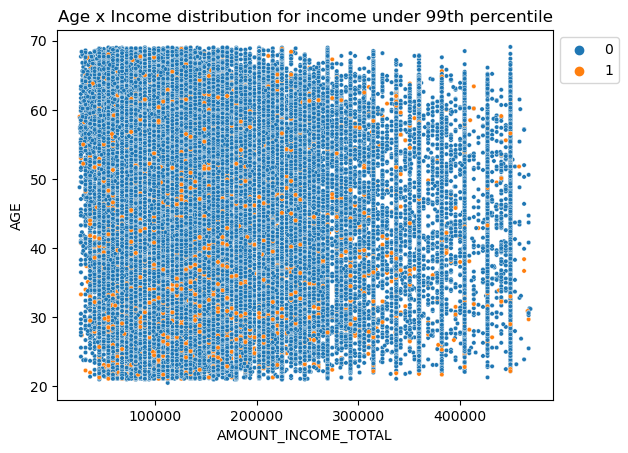

In [196]:
sns.scatterplot(AMOUNT_INCOME_TOTAL_Q99, y='AGE', x='AMOUNT_INCOME_TOTAL', s=10, hue='TARGET')
plt.title('Age x Income distribution for income under 99th percentile')
plt.legend(bbox_to_anchor = (1,1))

<div class="alert-warning" /* success danger */, style="padding: 10px" >
*If you have error in the code above or below, please refer to the note about upgrading seaborn/matplotlib at the beginning*

error could be: 
- 'Cannot inteprete value 'AGE' for y
- 'matplotlib does not have ncols arguments'
</div>

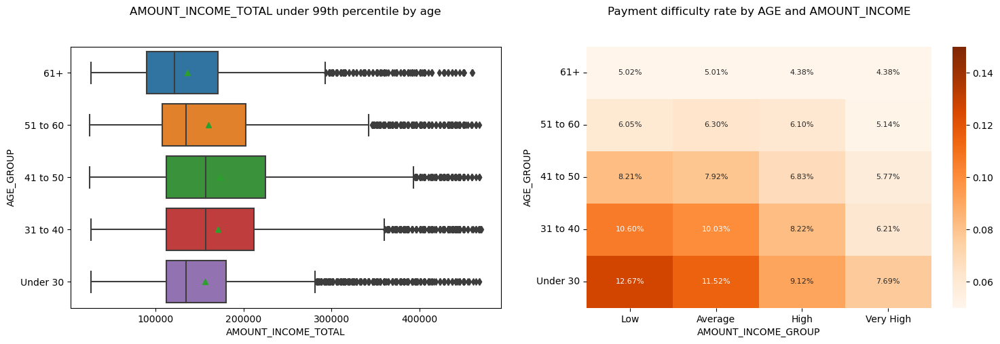

In [197]:
# boxplot of income by age groups, and heatmap of payment difficulty by age groups and income
fig, [ax1, ax2] = plt.subplots(ncols=2, figsize = (18,5))
sns.boxplot(AMOUNT_INCOME_TOTAL_Q99, y = 'AGE_GROUP', x = 'AMOUNT_INCOME_TOTAL', order = AGE_order[::-1], ax=ax1, showmeans=True)
ax1.set_title('AMOUNT_INCOME_TOTAL under 99th percentile by age', y=1.1)
eda_heatmap_ax(df, ax=ax2,
            group_y = 'AGE_GROUP', group_x = 'AMOUNT_INCOME_GROUP',
            order_y = AGE_order, order_x = AMOUNT_order,           
            plot_title='Payment difficulty rate by AGE and AMOUNT_INCOME',)

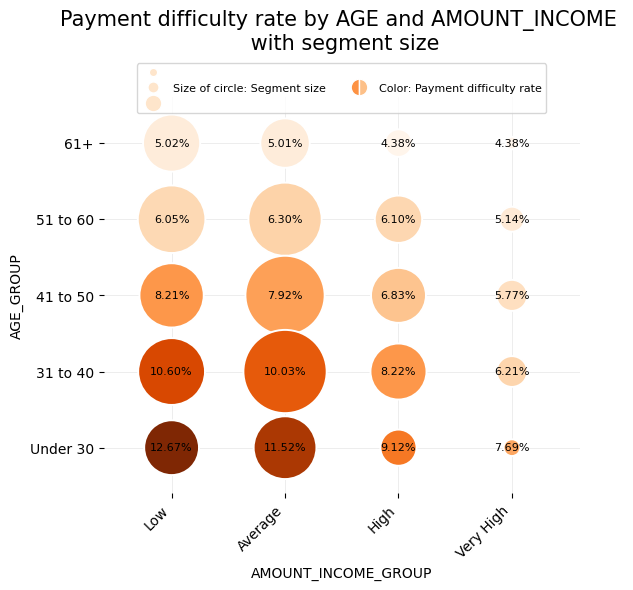

In [198]:
# bubble plot: similar to the heatmap above, but can also display the size of each segment
eda_bubble(group_y = 'AGE_GROUP', group_x = 'AMOUNT_INCOME_GROUP',
            order_y = AGE_order, order_x = AMOUNT_order,           
            plot_title='Payment difficulty rate by AGE and AMOUNT_INCOME \n with segment size')

In [199]:
print(f'Correlation coefficient of AGE and AMOUNT_INCOME_TOTAL: {df.AGE.corr(df.AMOUNT_INCOME_TOTAL):.3f}')

Correlation coefficient of AGE and AMOUNT_INCOME_TOTAL: -0.057


<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- AGE and AMOUNT_INCOME_TOTAL together has a correlation with payment difficulty rate.
- The older a client is and the higher their income is tend to lead to lower payment difficulty rate.
- Age group 41-50 has highest mean and 75th percentile  of income. The reason can be that people between 41-50 are still working and have reached higher management positions. Older than that and people start to retire (at around 55~60), which leads to lower income than the former.
- AGE and AMOUNT_INCOME_TOTAL has no correlation (correlation coefficient: -0.057)
    
</div>   



### YEARS_EMPLOYED x AGE

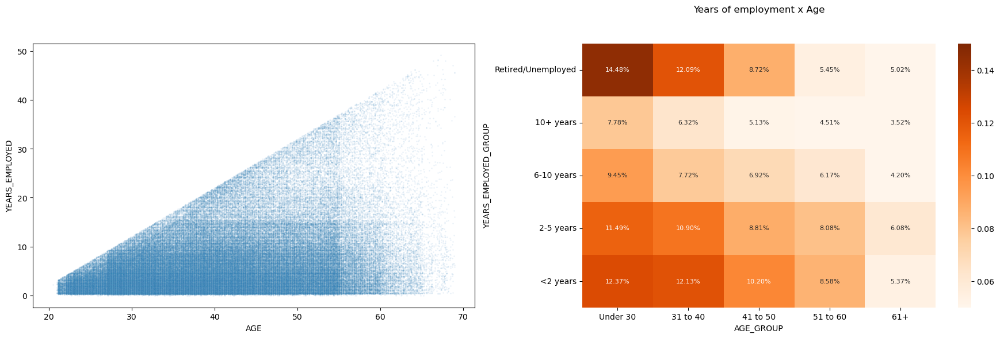

In [200]:
fig, [ax1, ax2] = plt.subplots(ncols=2, figsize = (18,6))
sns.scatterplot(df, y='YEARS_EMPLOYED', x='AGE', s=3, alpha=0.1, ax=ax1)
eda_heatmap_ax(df, ax=ax2,
            group_y = 'YEARS_EMPLOYED_GROUP', group_x = 'AGE_GROUP',
            order_y = YEARS_EMPLOYED_order, order_x = AGE_order,           
            plot_title='Years of employment x Age',)
plt.tight_layout()

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- YEARS_EMPLOYED and AGE together has a correlation with payment difficulty rate.
- The more experienced a client is and the higher their income is tend to lead to lower payment difficulty rate. 

</div>   



### YEARS_EMPLOYED x AMOUNT_INCOME_TOTAL

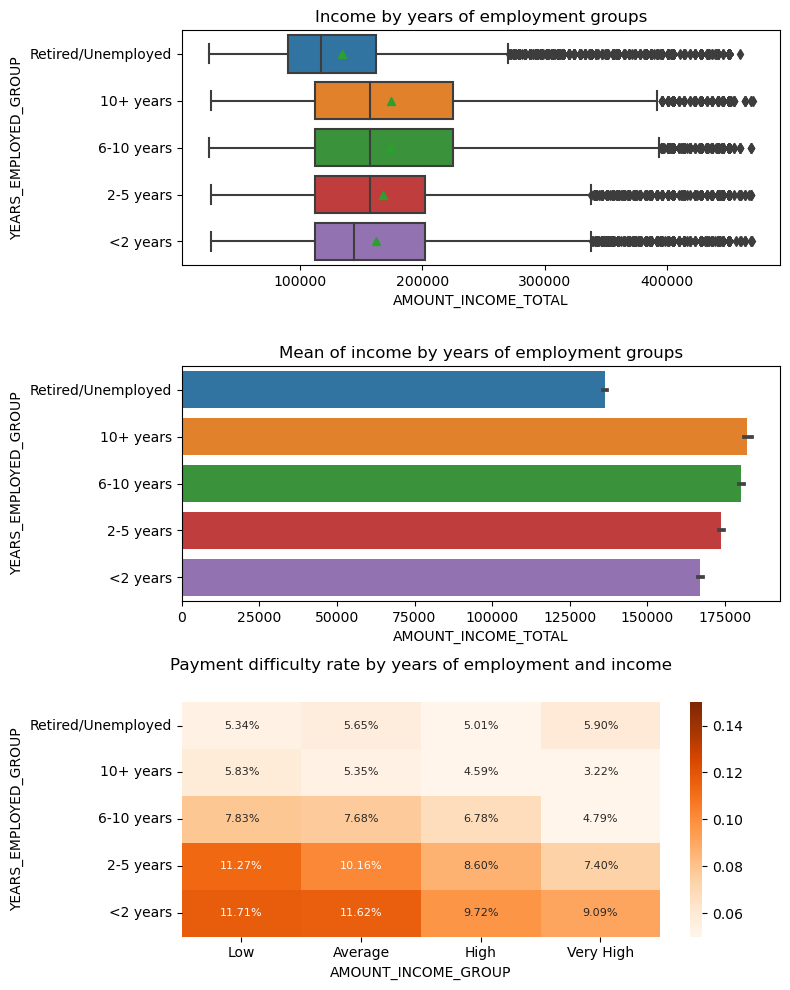

In [201]:
fig, [ax1, ax2, ax3] = plt.subplots(nrows=3, figsize = (8,10))
sns.boxplot(AMOUNT_INCOME_TOTAL_Q99, y = 'YEARS_EMPLOYED_GROUP', x = 'AMOUNT_INCOME_TOTAL', order = YEARS_EMPLOYED_order[::-1], showmeans=True, ax=ax1)
ax1.set_title('Income by years of employment groups')
eda_heatmap_ax(AMOUNT_INCOME_TOTAL_Q99, ax=ax3,
            group_y = 'YEARS_EMPLOYED_GROUP', group_x = 'AMOUNT_INCOME_GROUP',
            order_y = YEARS_EMPLOYED_order, order_x = AMOUNT_order,           
            plot_title='Payment difficulty rate by years of employment and income',)
sns.barplot(df, x='AMOUNT_INCOME_TOTAL', y = 'YEARS_EMPLOYED_GROUP', order=YEARS_EMPLOYED_order[::-1], ax=ax2)
ax2.set_title('Mean of income by years of employment groups')
plt.tight_layout()
plt.show()

In [202]:
print(f'Correlation coefficient of AMOUNT_INCOME_TOTAL and YEARS_EMPLOYED: {df.AMOUNT_INCOME_TOTAL.corr(df.YEARS_EMPLOYED):.3f}')

Correlation coefficient of AMOUNT_INCOME_TOTAL and YEARS_EMPLOYED: 0.032


<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- YEARS_EMPLOYED and AMOUNT_INCOME_TOTAL together has a correlation with payment difficulty rate.
- The more experienced a client is and the higher their income is tend to lead to lower payment difficulty rate, and vice versa. 
- The mean income tends to increase as the years of employment increase, but the difference is not very noticeable.
- The 75th percentile income of 6-10 years and 10+ years of employment is also higher than that of under 5 years of employment.
- That being said, these 2 features have no correlation (Correlation coefficient: 0.032). This is because the actual income can be varied vastly between profession, organization, etc,... 
    
</div>   



## 6.2 PREV_APPROVED x PREV_REFUSED
- We knew that clients with more approved applications -> lower payment difficulty rate while more refused applications -> higher rate.
- What is their relationship, and how do they together affect the chance of payment difficulty?

### PREV_APPROVED x PREV_REFUSED

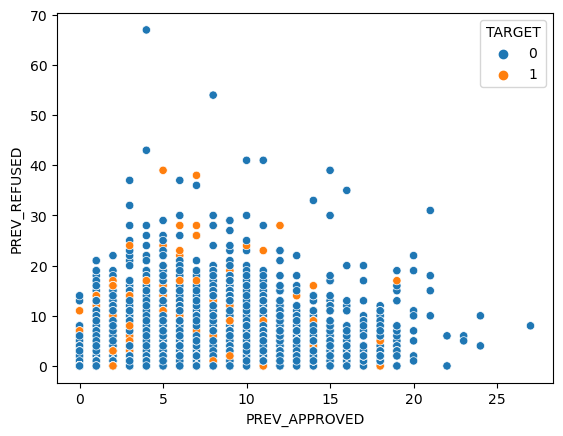

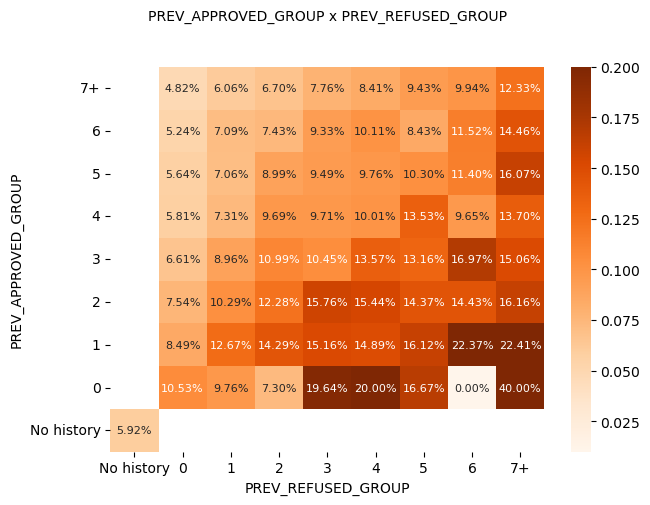

In [203]:
# plot scatterplot and heatmap of segments
sns.scatterplot(df, x='PREV_APPROVED', y='PREV_REFUSED', hue='TARGET')
eda_heatmap(df, 'PREV_APPROVED_GROUP', 'PREV_REFUSED_GROUP', PREV_order, PREV_order, v_range=(0.01, 0.2), figsize=(7,5))

In [204]:
print(f'Correlation coefficient of PREV_APPROVED and PREV_REFUSED: {df.PREV_APPROVED.corr(df.PREV_REFUSED):.3f}')

Correlation coefficient of PREV_APPROVED and PREV_REFUSED: 0.302


<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**
    
- PREV_APPROVED and PREV_REFUSED has a weak positive correlation, ie they tend to increase together, though it is hard to see the trend on the scatterplot.
- On the heatmap of payment difficulty rate, we can see that PRE_APPROVED and PRE_REFUSED affect the rate together. 
>- A person with **very low approved/high refused** pose an extremely high risk of payment difficulty (can go up to 20% ~ 40%)
>- Conversely, a person with **very high approved/low refused** has significantly lower chance of payment difficulty (as low as 4.8%)   

</div>   



Just for experiment, let's see what will happen if we combine the 2 features together by subtract PREV_REFUSED from PREV_APPROVED. This way, PREV_REFUSED acts as a 'penalty term' to PREV_APPROVED in regard to payment difficulty rate.


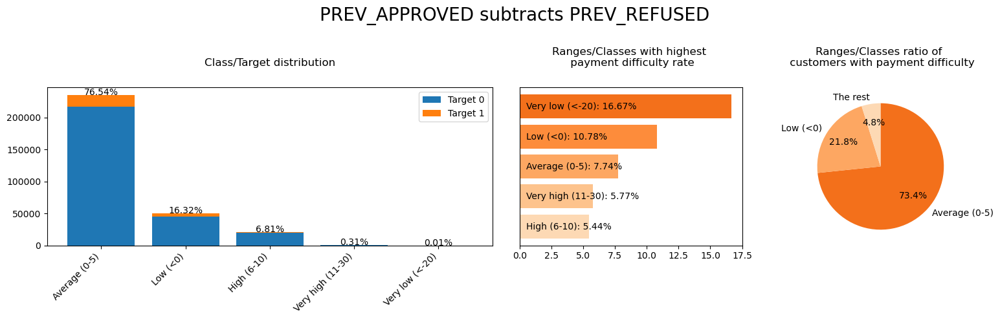

In [205]:
# Create a new feature that are PREV_APPROVED - PREV_REFUSED
eda_unicat(pd.cut(df.PREV_APPROVED - df.PREV_REFUSED, [-100,-20,0,5,10,30,100], 
                  labels=['Very low (<-20)', 'Low (<0)', 'Average (0-5)','High (6-10)', 'Very high (11-30)','The rest']),
           plot_title = 'PREV_APPROVED subtracts PREV_REFUSED'
          )

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- We can see that clients in low and very low range have significantly higher PD rate than average.

</div>   



## 6.3 Relationship between Income and Credit, Annuity, Goods Price

### Relationship between AMOUNT_INCOME_TOTAL, AMOUNT_CREDIT, AMOUNT_ANNUITY and AMOUNT_GOODS_PRICE

CPU times: total: 2.02 s
Wall time: 2.02 s


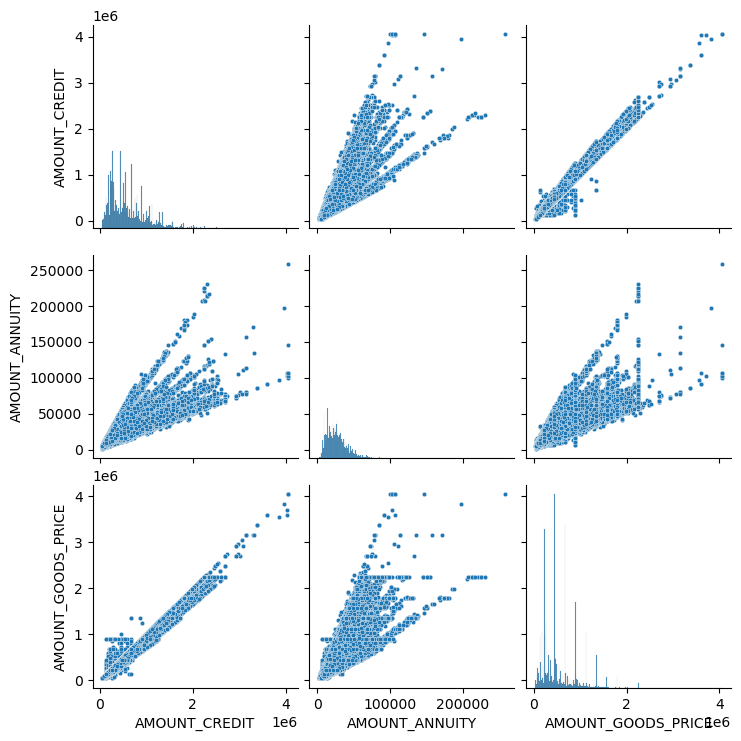

In [206]:
%%time
df_pairplot = df[['AMOUNT_CREDIT', 'AMOUNT_ANNUITY', 'AMOUNT_GOODS_PRICE']]
sns.pairplot(df_pairplot, plot_kws={"s": 10})

<AxesSubplot: >

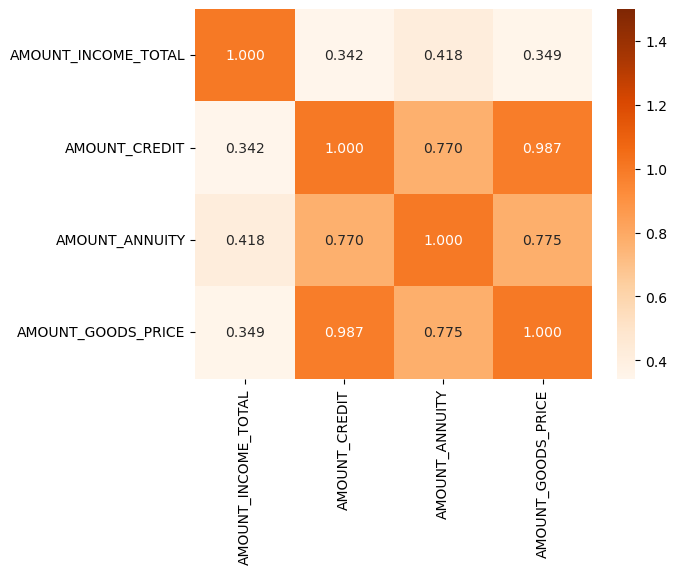

In [207]:
# correlation coefficent between 'AMOUNT_INCOME_TOTAL', 'AMOUNT_CREDIT', 'AMOUNT_ANNUITY', 'AMOUNT_GOODS_PRICE'
data = df[['AMOUNT_INCOME_TOTAL', 'AMOUNT_CREDIT', 'AMOUNT_ANNUITY', 'AMOUNT_GOODS_PRICE']].corr()
sns.heatmap(data, annot = True, fmt = '.3f', cmap=plt.get_cmap('Oranges'), vmax=1.5)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- AMOUNT_CREDIT, AMOUNT_ANNUITY, AMOUNT_GOODS_PRICE has very strong correlation to each other.
- There's a moderate/weak correlation between Income and AMOUNT_CREDIT/AMOUNT_ANNUITY/AMOUNT_GOODS_PRICE

</div>   



### Income and Annuity amount
How do income and annuity together affect payment difficulty rate?

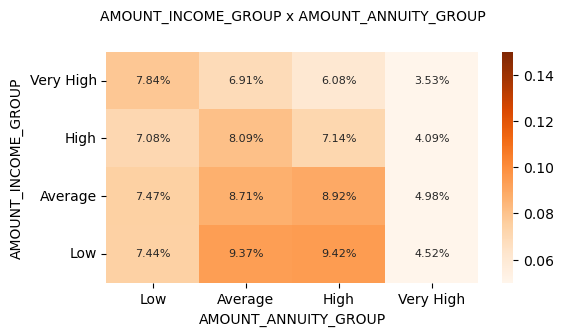

In [208]:
eda_heatmap(df, 'AMOUNT_INCOME_GROUP', 'AMOUNT_ANNUITY_GROUP', AMOUNT_order, AMOUNT_order, figsize=(6,3))

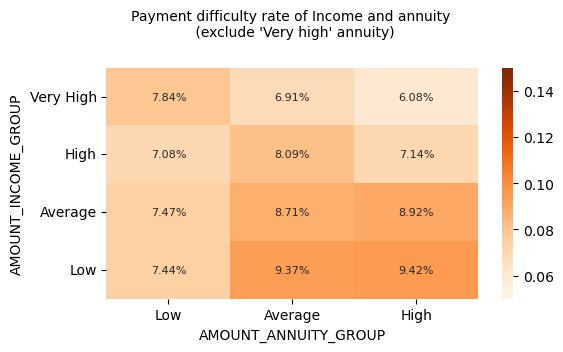

In [209]:
eda_heatmap(df[df.AMOUNT_ANNUITY_GROUP.isin(AMOUNT_order[:-1])], 
            'AMOUNT_INCOME_GROUP', 'AMOUNT_ANNUITY_GROUP', 
            AMOUNT_order, AMOUNT_order[:-1], figsize=(6,3),
            plot_title = 'Payment difficulty rate of Income and annuity \n (exclude \'Very high\' annuity)')

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- If we exclude 'Very high' annuity group, we can see that income and annuity together has a correlation with payment difficulty rate. Specifically, clients in low/average income but average/high annuity have the highest payment difficulty rate.
    
</div>   



### Income and Credit amount
How do income and credit amount together affect payment difficulty rate?

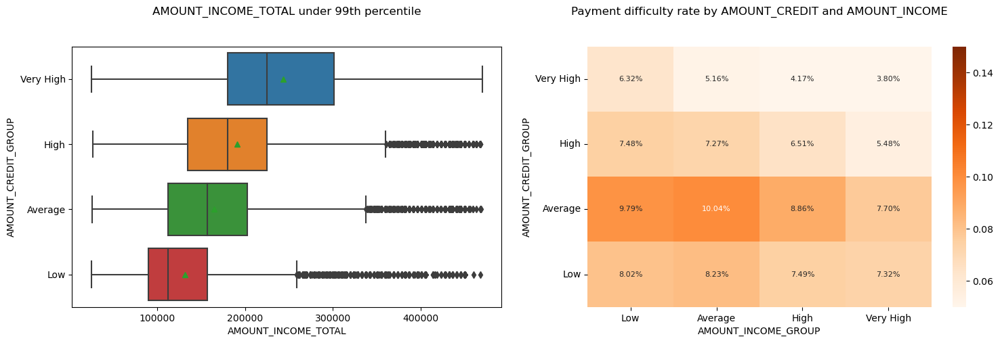

In [210]:
# boxplot of income by age groups, and heatmap of payment difficulty by age groups and income
fig, [ax1, ax2] = plt.subplots(ncols=2, figsize = (18,5))
sns.boxplot(AMOUNT_INCOME_TOTAL_Q99, y = 'AMOUNT_CREDIT_GROUP', x = 'AMOUNT_INCOME_TOTAL', order = AMOUNT_order[::-1], ax=ax1, showmeans=True)
ax1.set_title('AMOUNT_INCOME_TOTAL under 99th percentile', y=1.1)
eda_heatmap_ax(df, ax=ax2,
            group_y = 'AMOUNT_CREDIT_GROUP', group_x = 'AMOUNT_INCOME_GROUP',
            order_y = AMOUNT_order, order_x = AMOUNT_order,           
            plot_title='Payment difficulty rate by AMOUNT_CREDIT and AMOUNT_INCOME',)

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- We can see that the income range correlate well with the amount credit group (clients who were approved for higher credit also has higher income range)
- Clients in the average credit range and low/average income range has significantly higher payment difficulty rate than the rest.
    
</div>   



## 6.4 Relationship between Occupation and Income

<AxesSubplot: xlabel='AMOUNT_INCOME_TOTAL', ylabel='OCCUPATION_TYPE'>

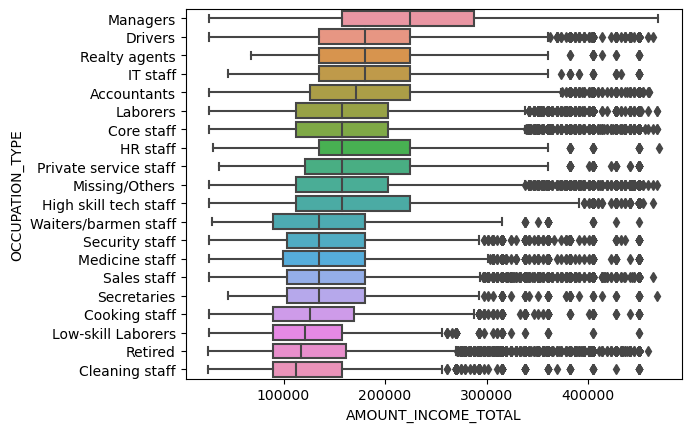

In [211]:
data = df[df.AMOUNT_INCOME_TOTAL<df.AMOUNT_INCOME_TOTAL.quantile(.99)]
order = data.groupby('OCCUPATION_TYPE').median(numeric_only = True).sort_values('AMOUNT_INCOME_TOTAL').index
sns.boxplot(data=data,x='AMOUNT_INCOME_TOTAL',y='OCCUPATION_TYPE', order=order[::-1])

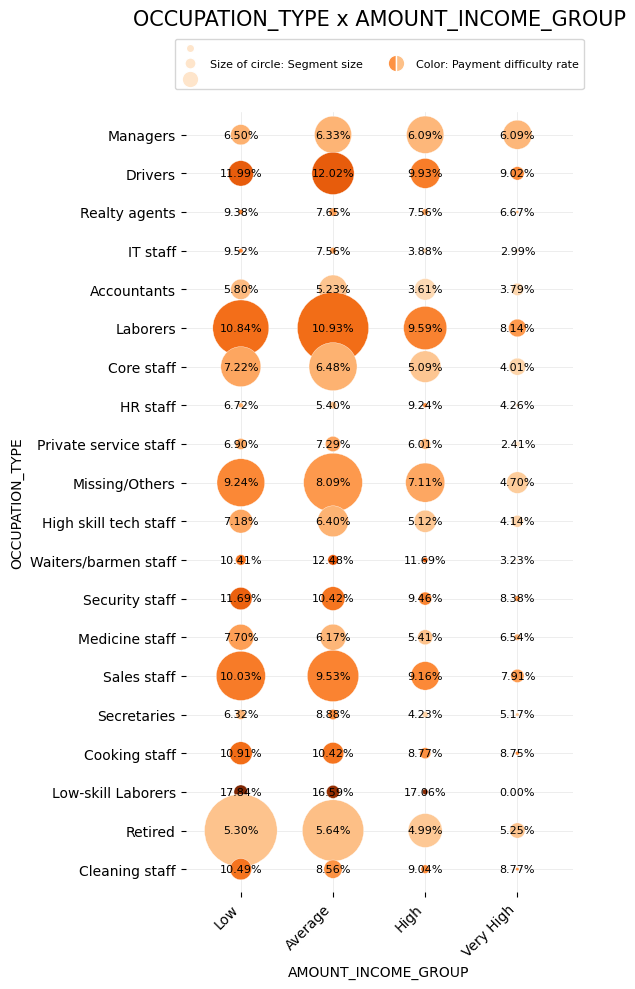

In [212]:
eda_bubble('OCCUPATION_TYPE', 'AMOUNT_INCOME_GROUP', order_y = order, order_x = AMOUNT_order,figsize=(6,10))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- Managers position has the highest mean income and overall low payment difficulty rate.
- Drivers have the second highest mean income, but they have very high payment difficulty rate across all income range.
- Cooking staff, low-skill labor, retired and cleaning staff has the lowest mean income. They also have high payment difficulty risk except for Retire.

</div>   



In [213]:
# See Education of drivers occupation
pd.DataFrame({
    'Drivers': np.round(df[df.OCCUPATION_TYPE=='Drivers']['EDUCATION'].value_counts(normalize=True),2),
    'Others' : np.round(df[df.OCCUPATION_TYPE!='Drivers']['EDUCATION'].value_counts(normalize=True),2)
})

,Drivers,Others
Secondary,0.85,0.70
Higher education,0.11,0.25
Incomplete higher,0.03,0.03
Lower secondary,0.01,0.01
Academic degree,0.00,0.00


<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- 85% of drivers have Secondary education level, compared to 70% of the others. Could lower education be the reason for high PD rate among drivers?

</div>   



## 6.5 Education vs Age / Income

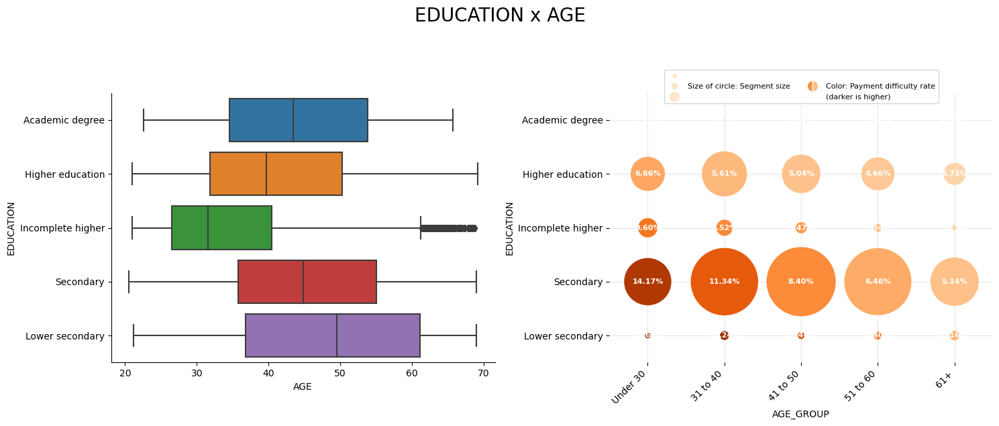

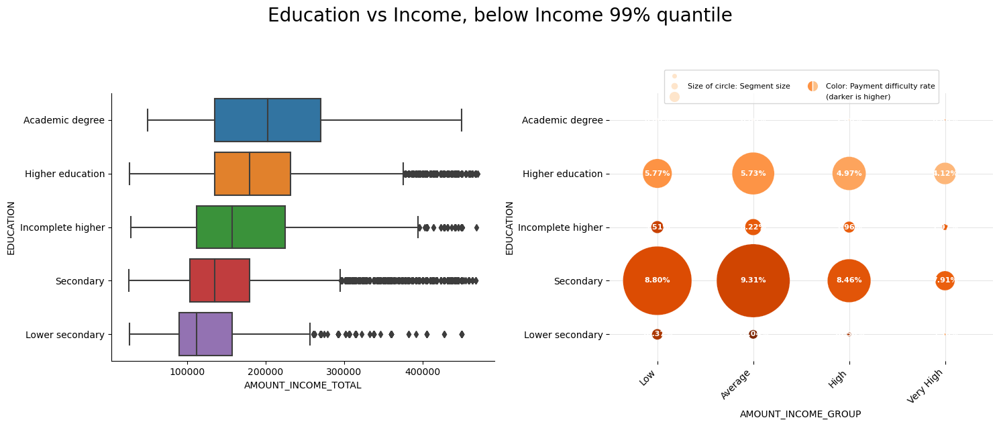

In [214]:
eda_boxbubble(df, 'EDUCATION', 'AGE', 'EDUCATION', 'AGE_GROUP', EDUCATION_order, AGE_order)
data = df[df.AMOUNT_INCOME_TOTAL<df.AMOUNT_INCOME_TOTAL.quantile(.99)]
eda_boxbubble(data, 'EDUCATION', 'AMOUNT_INCOME_TOTAL', 'EDUCATION', 'AMOUNT_INCOME_GROUP', EDUCATION_order, AMOUNT_order,
              size_adjust = 2e4, plot_title = 'Education vs Income, below Income 99% quantile')

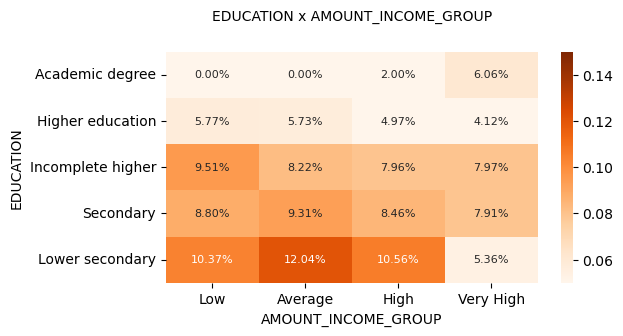

In [215]:
# payment difficulty rate by education and income
eda_heatmap(df, 'EDUCATION', 'AMOUNT_INCOME_GROUP', EDUCATION_order, AMOUNT_order, figsize=(6,3))

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**

- We can see that education level greatly affects the payment difficulty rate.
- Clients with Secondary/Lower secondary education tend to have higher PD rate than average, even in the High income range.
- On the other hand, client with higher education have significantly lower PD rate than average, regardless of income range.
- Overall, there is a correlation between education and income, as seen in the boxplot. Higher education customers have higher income range.
- While education and income can both affect the payment difficulty rate, education is the more deciding factor of the two.
</div>   



## 6.6 Relationship between Income and reg/work/live city

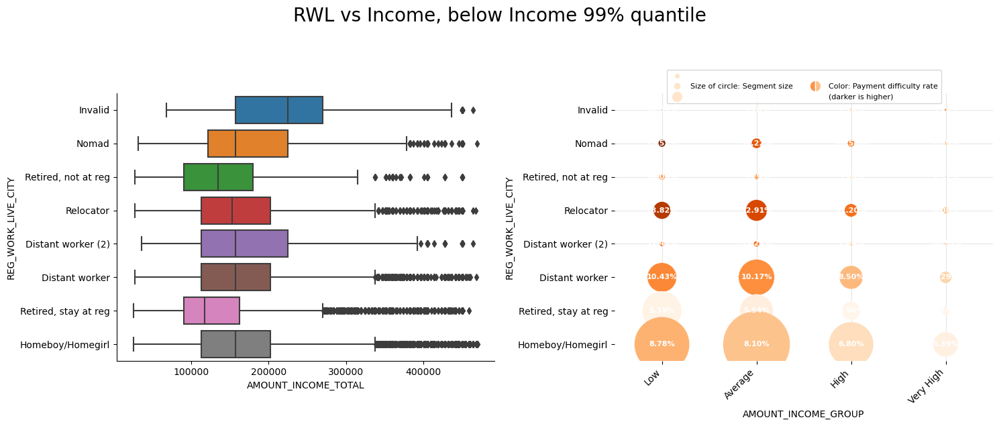

In [216]:
data = df[df.AMOUNT_INCOME_TOTAL<df.AMOUNT_INCOME_TOTAL.quantile(.99)]
eda_boxbubble(data, 'REG_WORK_LIVE_CITY', 'AMOUNT_INCOME_TOTAL', 'REG_WORK_LIVE_CITY', 'AMOUNT_INCOME_GROUP', REG_WORK_LIVE_CITY_order, AMOUNT_order,
              size_adjust = 2e4, plot_title = 'RWL vs Income, below Income 99% quantile')

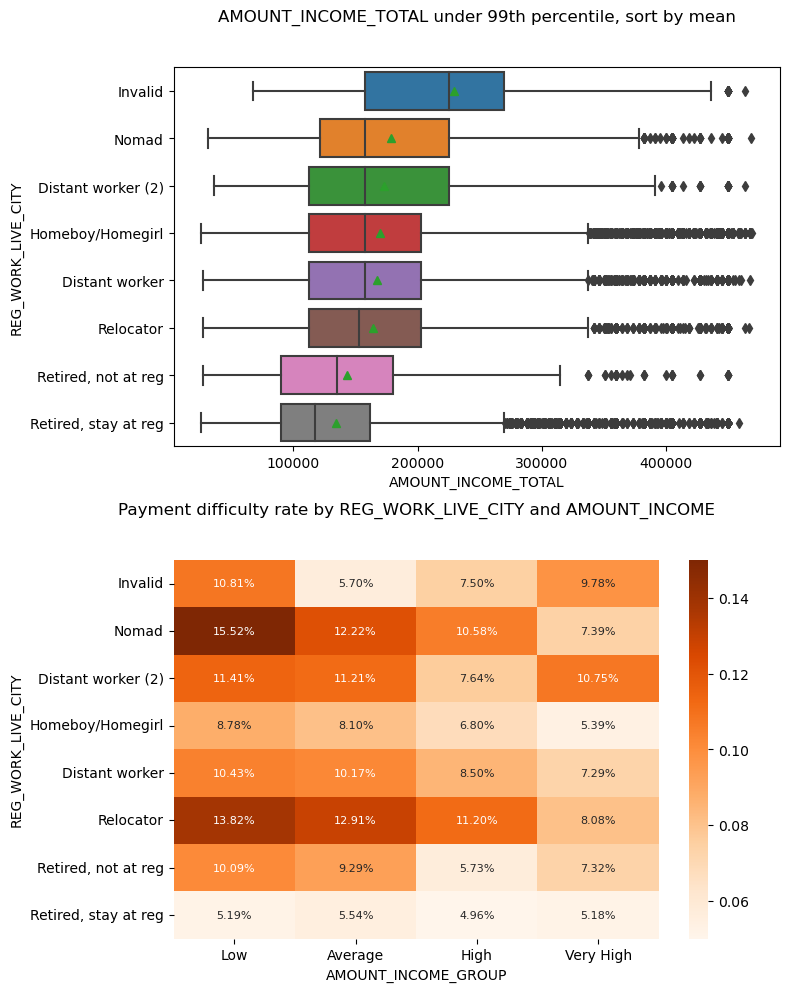

In [217]:
# boxplot of income by REG_WORK_LIVE_CITY, and heatmap of payment difficulty by REG_WORK_LIVE_CITY and income

# create a custom order by descending mean
order = data.groupby('REG_WORK_LIVE_CITY').mean(numeric_only = True).sort_values('AMOUNT_INCOME_TOTAL').index

fig, [ax1, ax2] = plt.subplots(nrows=2, figsize = (8,10))
sns.boxplot(AMOUNT_INCOME_TOTAL_Q99, y = 'REG_WORK_LIVE_CITY', x = 'AMOUNT_INCOME_TOTAL', order=order[::-1], ax=ax1, showmeans=True)
ax1.set_title('AMOUNT_INCOME_TOTAL under 99th percentile, sort by mean', y=1.1)
eda_heatmap_ax(df, ax=ax2,
            group_y = 'REG_WORK_LIVE_CITY', group_x = 'AMOUNT_INCOME_GROUP',
            order_y=order, order_x = AMOUNT_order,           
            plot_title='Payment difficulty rate by REG_WORK_LIVE_CITY and AMOUNT_INCOME',)
plt.tight_layout()

<div class="alert-success" /* success danger */, style="padding: 10px" >

**Observation:**
- Nomad (reg≠work≠live) and Relocator(reg≠work=live) have the highest PD rate, even for high income customers.
- During our analysis so far, Retiree tend to have very low payment difficulty rate. Only now we can see a segment where Retiree has higher PD rate than average: those who are living in a different city than their registered address and have low/average income.
</div>   



## 6.7 Key takeaways of multivariate analysis

- **AGE** and **AMOUNT_INCOME_TOTAL** together has a correlation with payment difficulty rate, although they do not have a correlation to each other.

- **YEARS_EMPLOYED** and **AGE** together has a correlation with payment difficulty rate. The more experienced a client is and the higher their income is tend to lead to lower payment difficulty rate.

- **YEARS_EMPLOYED** and **AMOUNT_INCOME_TOTAL** together has a correlation with payment difficulty rate.

- **PRE_APPROVED** and **PRE_REFUSED** also affect the rate together

- **AMOUNT_CREDIT, AMOUNT_ANNUITY, AMOUNT_GOODS_PRICE** has very strong correlation to each other. There's a moderate/weak correlation between Income and AMOUNT_CREDIT/AMOUNT_ANNUITY/AMOUNT_GOODS_PRICE. If we exclude 'Very high' annuity group, we can see that income and annuity together has a correlation with payment difficulty rate. Specifically, clients in low/average income but average/high annuity have the highest payment difficulty rate.

- In term of **Occupation** type, Managers position has the highest mean income and overall low payment difficulty rate. Drivers have the second highest mean income, but they have very high payment difficulty rate across all income range. Cooking staff, low-skill labor, retired and cleaning staff has the lowest mean income. They also have high payment difficulty risk except for Retire.

- We can see that **EDUCATION** level greatly affects the payment difficulty rate across all income ranges. While education and income can both affect the payment difficulty rate, education is the more deciding factor of the two.


***
# 7. Summary and Business recommendation

## 7.1 Most important features and combination of features

1. **AGE**: younger age has higher PD rate and vice versa.
2. **YEARS_EMPLOYED**: low years of employment has higher PD
3. **AMOUNT_INCOME_TOTAL**: Low/average range has higher rate than high/very high range
4. **PREV_APPROVED**: More previous approved loan means lower PD rate. The lowest is no history.
5. **PREV_REFUSED**: Less previous refused loan means lower PD rate. The lowest is no history.
6. **TOTAL/AVERAGE_CREDIT_APPLIED**: Low total approved credit and low average approved credit per loan has higher rate.
7. **AMOUNT_CREDIT**: clients with low/average credit has higher PD rate than those in high/very high range.
8. **AMOUNT_ANNUITY**: average and high annuity has higher rate than either low or very high range.
9. **AMOUNT_REQ_CB_YEAR**: More requests in the year prior to the loan application have significantly higher payment difficulty rate than those with fewer request.
10. **OCCUPATION_TYPE**: Heavy labor jobs has the highest PD rate while accountant, manager,high skill tech, ... have lowest rate.
11. **ORGANIZATION_TYPE**:  organization type related blue_collar, manual labor work (eg Restaurant, Construction, Cleaning, Agriculture,...) also has higher PD rate than average.
12. **EDUCATION**: the level of education also correlate to payment difficulty rate. Lower levels tends to have higher rate and vice versa.
13. **REG_WORK_LIVE_CITY/CITY_COUNT**: People associated with 2 cities or more have significantly higher PD rate than those who live and work in the same city as their registered city.

**Combination of features:**
1. **AGE** and **AMOUNT_INCOME_TOTAL**
2. **YEARS_EMPLOYED** and **AGE**
3. **YEARS_EMPLOYED** and **AMOUNT_INCOME_TOTAL**
4. **PREV_APPROVED** and **PREV_REFUSED**
5. **REG_WORK_LIVE_CITY** and **AMOUNT_INCOME**
6. **EDUCATION** and **AMOUNT_INCOME**
7. **AMOUNT_INCOME** and **AMOUNT_ANNUITY**

## 7.2 Business Recommendation

<div class="alert-success" /* success danger */, style="padding: 10px" >

### Green flags in customer
**General traits of an ideal customers that the bank should focus on:**

- Age 41 or older, more than 5 years of employment
- Retiree living at their registered address
- Income in high range
- Has high amount of previous approved contracts and low amount of refused.
- Low amount of AMOUNT_REQ_CB in the last year
- Finished higher education
- Holding management position or high skilled staff occupation
- Live and work in the same city of their registered address
- Married, have no children
- Own new car
- Have low annuity amount relatively to their income
- Have no defaulted individual in their recent social circle
</div>

<div class="alert-danger" /* success danger */, style="padding: 10px" >

### Red flags in customer
**General traits of customer with higher risk of payment difficulty:**

- Young age (Under 30)
- Older age (30-50) but have low years of employment
- Older age (30-50) but only finished Secondary education
- Retiree living in a different city than their registered address
- Income in low range
- Income in high range but have low education level
- Renting apartment or living with their parents
- Has low amount of previous approved contracts and high amount of refused
- High amount of AMOUNT_REQ_CB in the last year
- Working as low-skilled labor or heavy-manual labor
- Relocated to or work in a different city than their registered address
- Single, or married but have many children
- Own old car (>10 years) or do not own car at all
- High annuity amount relative to their income
- Have defaulted individual in their recent social circle
</div>

<div class="alert-warning" /* success danger */, style="padding: 10px" >

### Issues that need considering stricter requirements/approval process in the future

- The clients that have missing value for amount request have the highest PD rate (10.34%). The bank needs to investigate the source of this segment and apply stricter procedure/requirements for such clients.

- Nearly 1/3 of clients with PD the bank have had are from 31-40 group - the group with 2nd highest risk. The bank may need to apply stricter requirement in the future on this age group to limit the clients with PD from said group.

- 58% of clients with PD the bank has had are from under 5 years of employment - the groups with highest risk. The bank may need to apply stricter requirement in the future on this group to limit the clients with PD from said group.

- In term of required documents, the bank might need to review the procedure associated with Document_3. Could it be that DOC_3 is the easiest to apply/obtain thus allow people with higher PD rate exploit this?

- Secondary/Lower Secondary has the highest PD rate, which makes up more than 70% of the current clients. The bank might need to apply stricter requirements on this group.
</div>

***
End of analysis. Thank you.